# SARIMA

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error

# Define the period of the time series (e.g., 12 for monthly data if seasonality is yearly)
period = 52  # Adjust this value based on your data

# Iterate over each series in the data_series_it DataFrame
for series_name in data_series_it.columns:
    print(f"Processing series: {series_name}")
    
    # Define the series to be processed
    series = data_series_it[series_name].dropna()
    
    # Ensure that series is numeric and handle any potential missing values
    series = pd.to_numeric(series, errors='coerce').dropna()

    # Decompose the series using STL
    result = STL(series, period=period).fit()  # Specify the period here
    component_dict = {'seasonal': result.seasonal, 'trend': result.trend, 'residual': result.resid}
    prediction_results = []

    # Apply SARIMA model for each component
    for component in ['seasonal', 'trend', 'residual']:
        historic = component_dict[component].iloc[:int(len(series) * 0.7)].tolist()
        test = component_dict[component].iloc[int(len(series) * 0.7):]
        predictions = []

        for i in range(len(test)):
            # Example SARIMA order: (p,d,q)(P,D,Q,s), adjust based on your data
            model = SARIMAX(historic, order=(1, 1, 1), seasonal_order=(1, 1, 1, period))
            model_fit = model.fit(disp=False)
            pred = model_fit.forecast(steps=1)
            predictions.append(pred[0])
            historic.append(test[i])

        predictions = pd.Series(predictions, index=test.index, name=component)
        prediction_results.append(predictions)

        # Calculate RMSE
        test_score = np.sqrt(mean_squared_error(test, predictions))
        print(f'Test for {component} RMSE: {test_score}')

        # Plot results
        plt.figure(figsize=(14, 5))
        plt.plot(test, label='Observed ' + component)
        plt.plot(predictions, color='red', label='Predicted ' + component)
        plt.legend()
        plt.title(f'{component.capitalize()} Component - SARIMA Model')
        plt.show()

    # Recompose the predicted components
    recomposed_preds = pd.concat(prediction_results, axis=1).sum(axis=1)

    # Plot the recomposed predictions against the original series
    plt.figure(figsize=(14, 5))
    plt.plot(series.iloc[int(len(series) * 0.7):], label='Observed')
    plt.plot(recomposed_preds, color='red', label='Predicted')
    plt.legend()
    plt.title(f'Recomposed Predictions vs Observed Series - SARIMA Model for {series_name}')
    plt.show()

    # Calculate the overall RMSE
    test_score = np.sqrt(mean_squared_error(series.iloc[int(len(series) * 0.7):], recomposed_preds))
    print(f'Overall RMSE for {series_name}: {test_score}')


NameError: name 'data_series_it' is not defined

# LSTM

In [ ]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Define the look-back period (number of previous time steps to use as input)
look_back = 10

# Function to create the dataset with look-back
def create_dataset(series, look_back=1):
    X, Y = [], []
    for i in range(len(series) - look_back):
        X.append(series[i:(i + look_back)])
        Y.append(series[i + look_back])
    return np.array(X), np.array(Y)

# Initialize MinMaxScaler to normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))

# Iterate over each series in the data_series_it DataFrame
for series_name in data_series_it.columns:
    print(f"Processing series: {series_name}")

    # Define the series to be processed
    series = data_series_it[series_name].dropna()

    # Normalize the series
    series_scaled = scaler.fit_transform(series.values.reshape(-1, 1))

    # Create the dataset
    X, y = create_dataset(series_scaled, look_back)

    # Split into train and test sets (70% train, 30% test)
    train_size = int(len(X) * 0.7)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Reshape input to be [samples, time steps, features] which is required by LSTM
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

    # Define the LSTM model
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(look_back, 1)))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(X_train, y_train, batch_size=1, epochs=10)

    # Predict using the LSTM model
    predictions = model.predict(X_test)
    predictions = scaler.inverse_transform(predictions)

    # Inverse transform y_test for comparison
    y_test = scaler.inverse_transform([y_test])

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test[0], predictions[:, 0]))
    print(f'RMSE for {series_name}: {rmse}')

    # Plot the results
    train = series[:train_size + look_back]
    valid = series[train_size + look_back:]
    valid['Predictions'] = predictions

    plt.figure(figsize=(14, 5))
    plt.plot(train, label='Training data')
    plt.plot(valid.index, valid.values, label='Actual data')
    plt.plot(valid.index, valid['Predictions'], label='LSTM Predictions', color='red')
    plt.legend()
    plt.title(f'LSTM Model - {series_name}')
    plt.show()


ModuleNotFoundError: No module named 'tensorflow'

In [59]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Define the look-back period (number of previous time steps to use as input)
look_back = 10

# Function to create the dataset with look-back
def create_dataset(series, look_back=1):
    X, Y = [], []
    for i in range(len(series) - look_back):
        X.append(series[i:(i + look_back)])
        Y.append(series[i + look_back])
    return np.array(X), np.array(Y)

# Initialize MinMaxScaler to normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))

# Iterate over each series in the data_series_it DataFrame
for series_name in data_series_it.columns:
    print(f"Processing series: {series_name}")

    # Define the series to be processed
    series = data_series_it[series_name].dropna()

    # Normalize the series
    series_scaled = scaler.fit_transform(series.values.reshape(-1, 1))

    # Create the dataset
    X, y = create_dataset(series_scaled, look_back)

    # Split into train and test sets (70% train, 30% test)
    train_size = int(len(X) * 0.7)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Reshape input to be [samples, time steps, features] which is required by LSTM
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

    # Define the LSTM model
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(look_back, 1)))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(X_train, y_train, batch_size=1, epochs=10)

    # Predict using the LSTM model
    predictions = model.predict(X_test)
    predictions = scaler.inverse_transform(predictions)

    # Inverse transform y_test for comparison
    y_test = scaler.inverse_transform([y_test])

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test[0], predictions[:, 0]))
    print(f'RMSE for {series_name}: {rmse}')

    # Plot the results
    train = series[:train_size + look_back]
    valid = series[train_size + look_back:]
    valid['Predictions'] = predictions

    plt.figure(figsize=(14, 5))
    plt.plot(train, label='Training data')
    plt.plot(valid.index, valid.values, label='Actual data')
    plt.plot(valid.index, valid['Predictions'], label='LSTM Predictions', color='red')
    plt.legend()
    plt.title(f'LSTM Model - {series_name}')
    plt.show()


Processing series: LNACT_Collec
Epoch 1/10


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.0547  
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0423
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0236
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0318
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0669
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0432
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0243
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0244
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0559
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0303
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


ValueError: Found array with dim 3. None expected <= 2.

# NN

In [ ]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

# Define the look-back period (number of previous time steps to use as input)
look_back = 10

# Function to create the dataset with look-back
def create_dataset(series, look_back=1):
    X, Y = [], []
    for i in range(len(series) - look_back):
        X.append(series[i:(i + look_back)])
        Y.append(series[i + look_back])
    return np.array(X), np.array(Y)

# Initialize MinMaxScaler to normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))

# Iterate over each series in the data_series_it DataFrame
for series_name in data_series_it.columns:
    print(f"Processing series: {series_name}")

    # Define the series to be processed
    series = data_series_it[series_name].dropna()

    # Normalize the series
    series_scaled = scaler.fit_transform(series.values.reshape(-1, 1))

    # Create the dataset
    X, y = create_dataset(series_scaled, look_back)

    # Split into train and test sets (70% train, 30% test)
    train_size = int(len(X) * 0.7)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Define the Neural Network model
    model = Sequential()
    model.add(Dense(100, activation='relu', input_shape=(look_back,)))
    model.add(Dropout(0.2))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(X_train, y_train, epochs=20, batch_size=10, verbose=1)

    # Predict using the model
    predictions = model.predict(X_test)
    predictions = scaler.inverse_transform(predictions)

    # Inverse transform y_test for comparison
    y_test = scaler.inverse_transform(y_test.reshape(-1, 1))

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    print(f'RMSE for {series_name}: {rmse}')

    # Plot the results
    train = series[:train_size + look_back]
    valid = series[train_size + look_back:]
    valid['Predictions'] = predictions

    plt.figure(figsize=(14, 5))
    plt.plot(train, label='Training data')
    plt.plot(valid.index, valid.values, label='Actual data')
    plt.plot(valid.index, valid['Predictions'], label='NN Predictions', color='red')
    plt.legend()
    plt.title(f'Neural Network Model - {series_name}')
    plt.show()


# Compare different NN

Processing series: LNACT_Collec
Training MLP model for LNACT_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
RMSE for LNACT_Collec using MLP: 4070134.3087739535


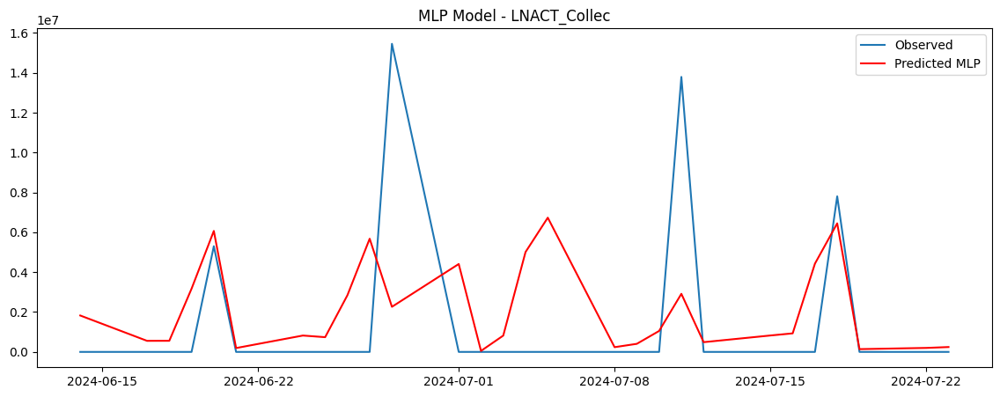

Training LSTM model for LNACT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
RMSE for LNACT_Collec using LSTM: 93575175087330.42


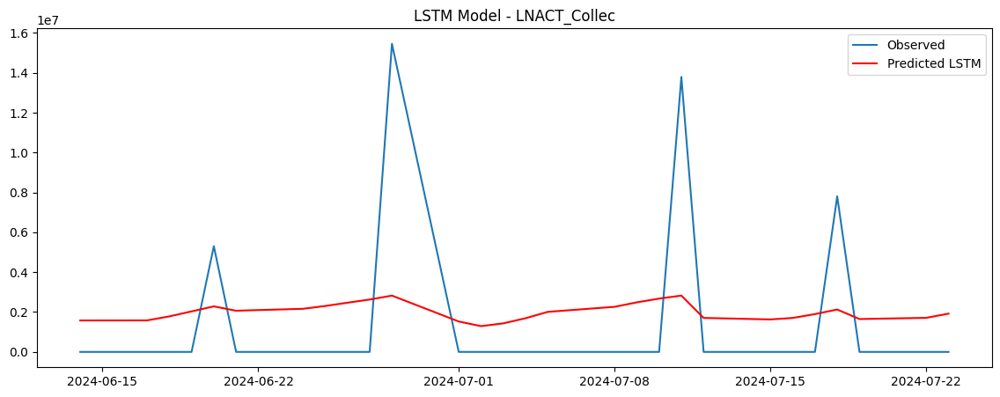

Training CNN model for LNACT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNACT_Collec using CNN: 2.0353688313253454e+21


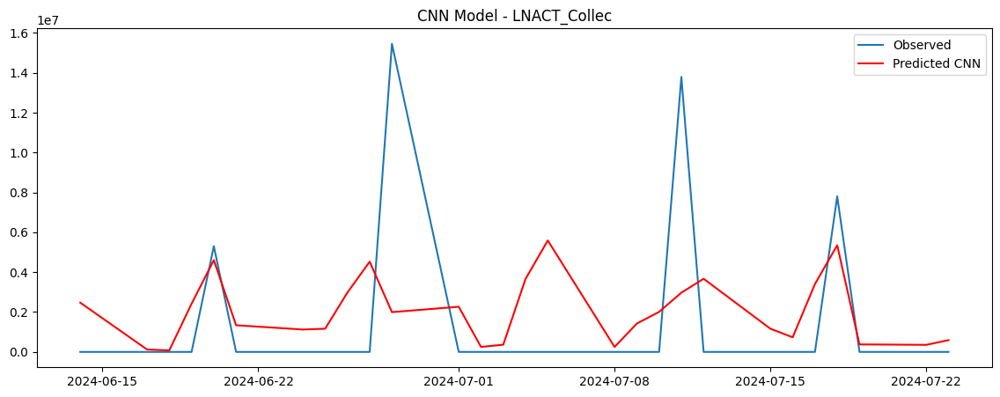

Training GRU model for LNACT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
RMSE for LNACT_Collec using GRU: 4.427163758698206e+28


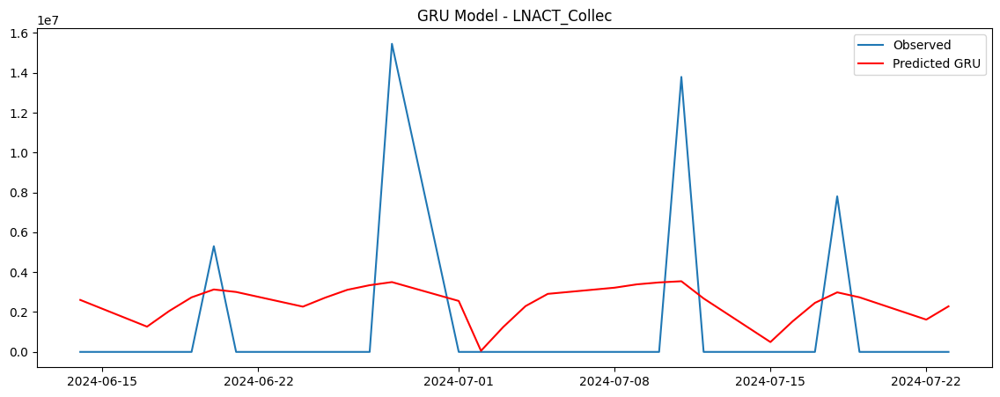

Processing series: LNAAE_Collec
Training MLP model for LNAAE_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNAAE_Collec using MLP: 964646.5344339701


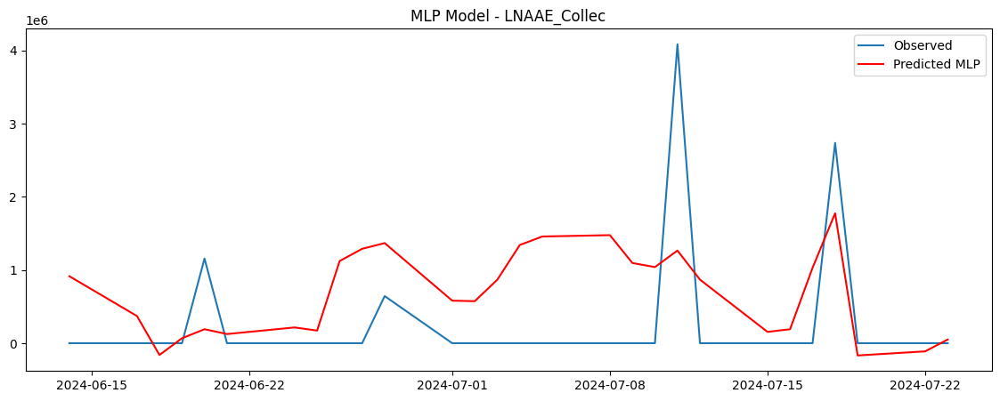

Training LSTM model for LNAAE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
RMSE for LNAAE_Collec using LSTM: 7213696846722.684


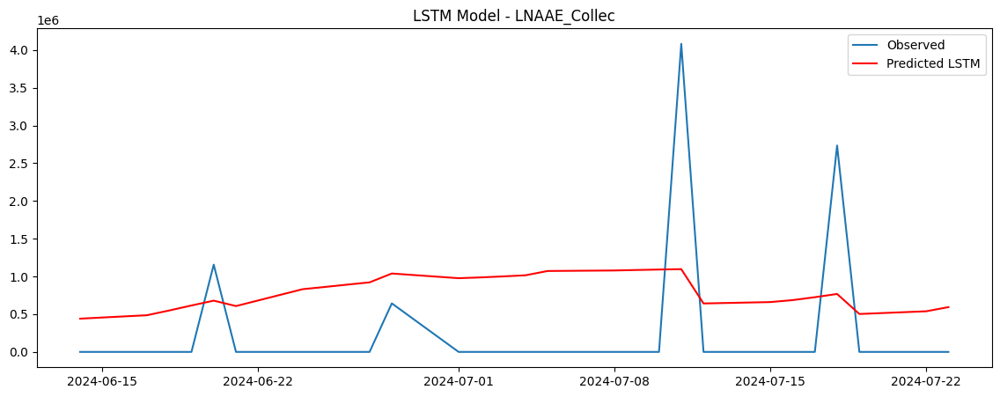

Training CNN model for LNAAE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNAAE_Collec using CNN: 5.410040094420716e+19


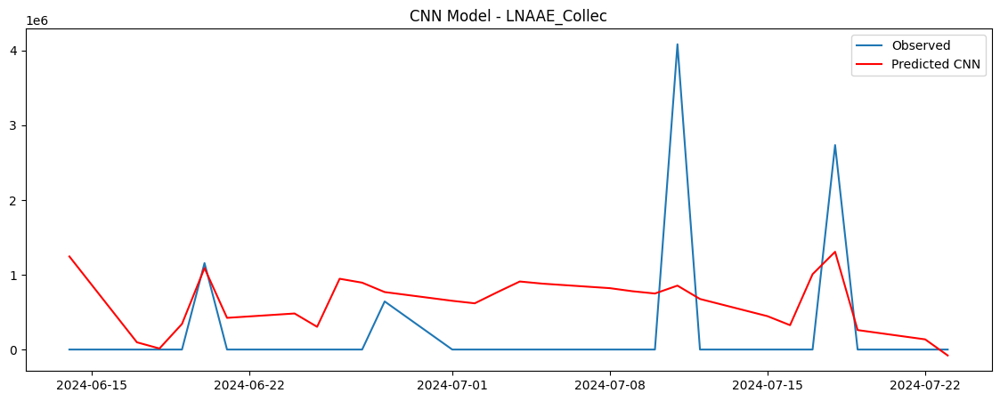

Training GRU model for LNAAE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
RMSE for LNAAE_Collec using GRU: 4.057355505051835e+26


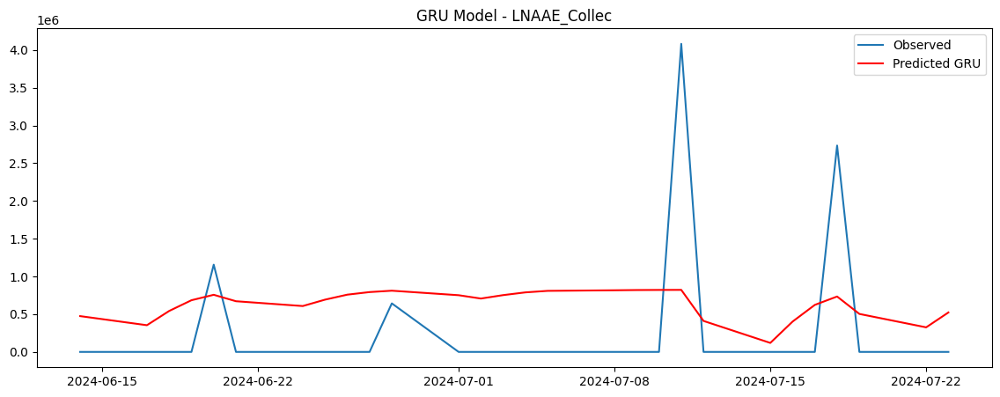

Processing series: LNATO_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNATO_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNATO_Collec using MLP: 3299612.4704362326


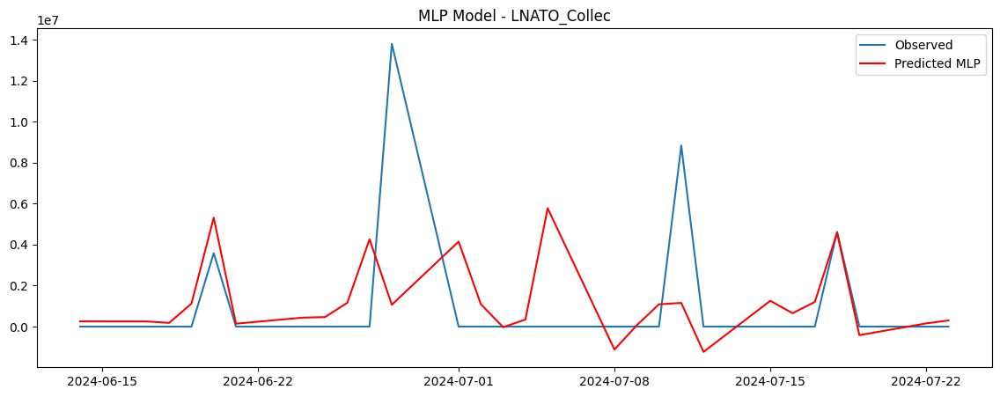

Training LSTM model for LNATO_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
RMSE for LNATO_Collec using LSTM: 49185396551101.55


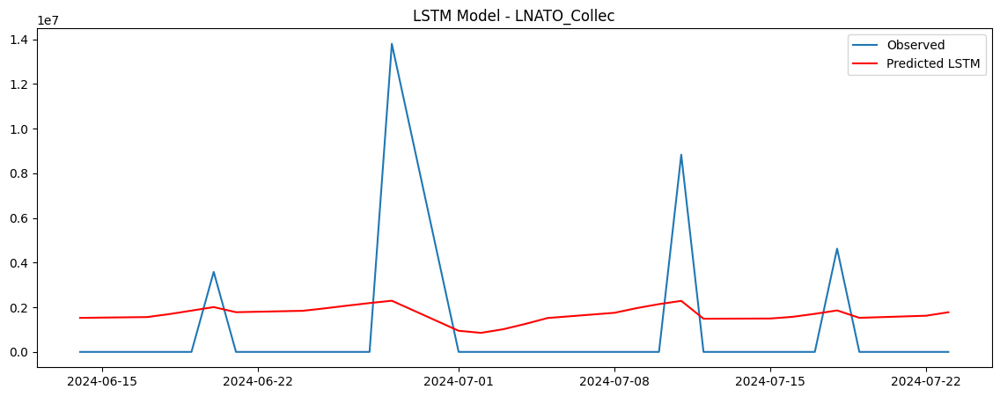

Training CNN model for LNATO_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
RMSE for LNATO_Collec using CNN: 7.359996673273199e+20


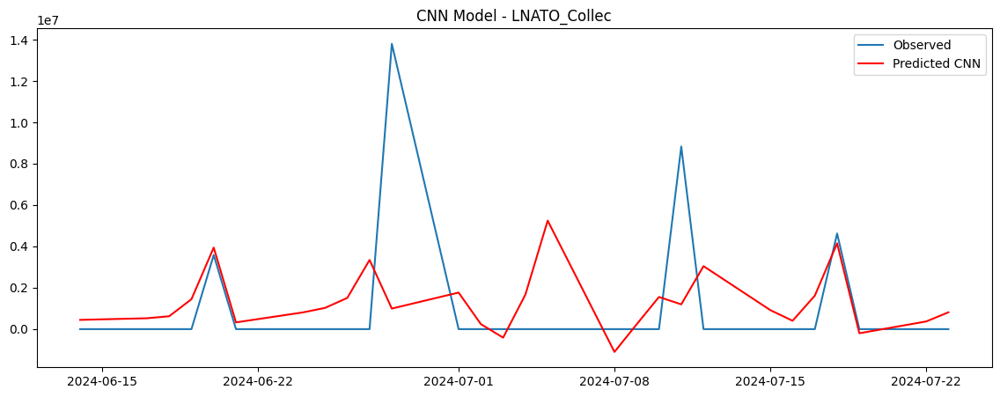

Training GRU model for LNATO_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
RMSE for LNATO_Collec using GRU: 1.101334014163784e+28


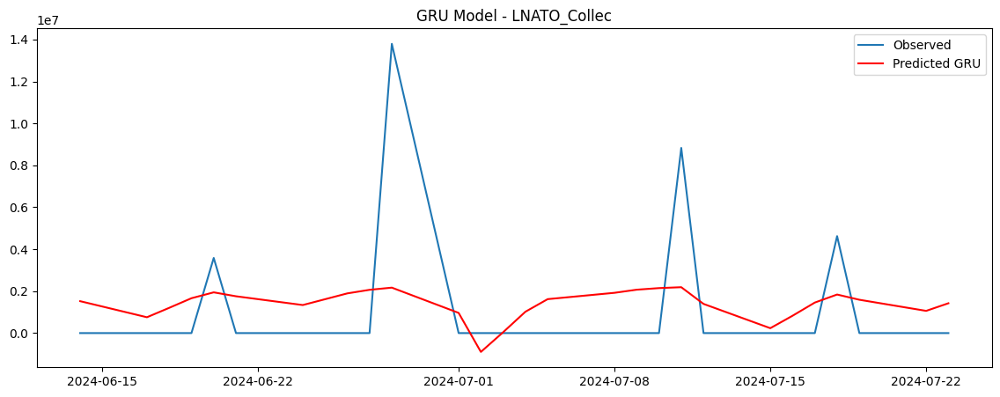

Processing series: LNAT2_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNAT2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNAT2_Collec using MLP: 294818.358871013


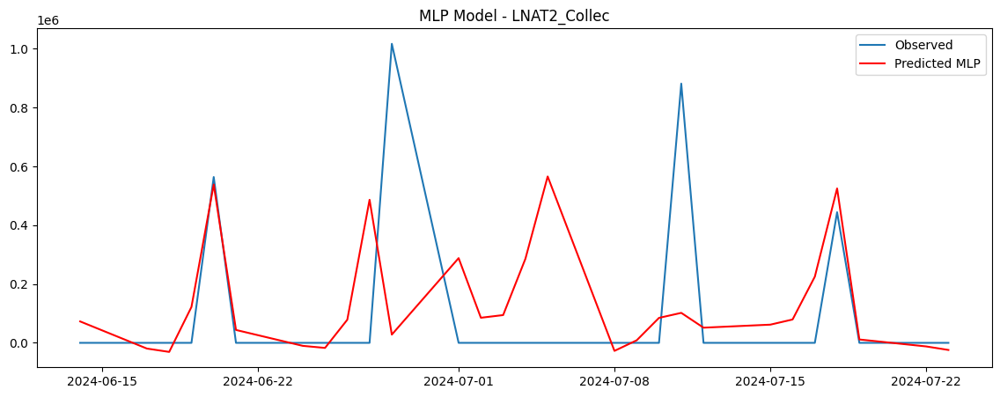

Training LSTM model for LNAT2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
RMSE for LNAT2_Collec using LSTM: 351457540583.1882


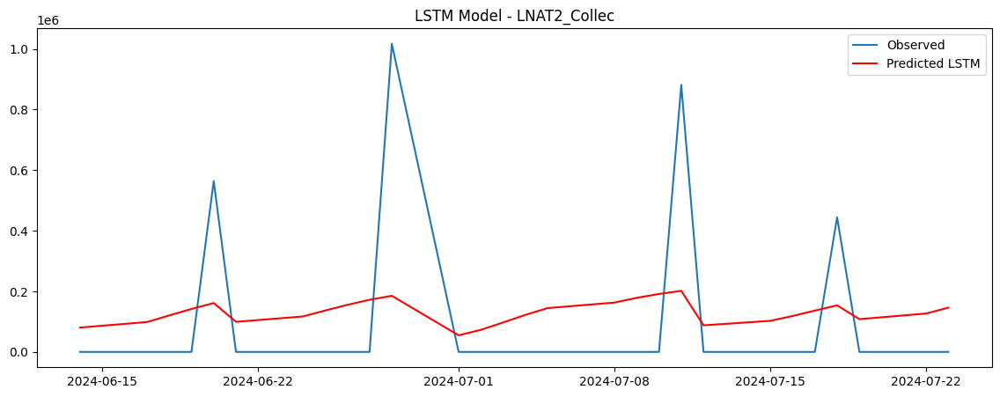

Training CNN model for LNAT2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
RMSE for LNAT2_Collec using CNN: 4.284664094838276e+17


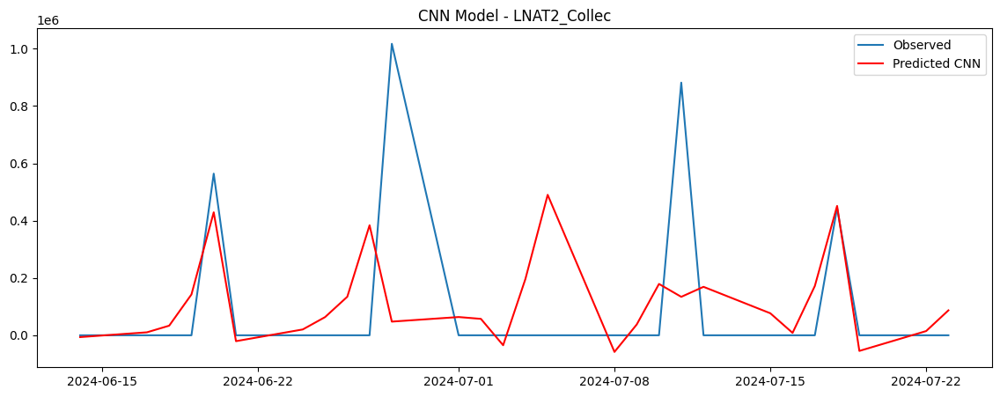

Training GRU model for LNAT2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
RMSE for LNAT2_Collec using GRU: 5.2234881561724206e+23


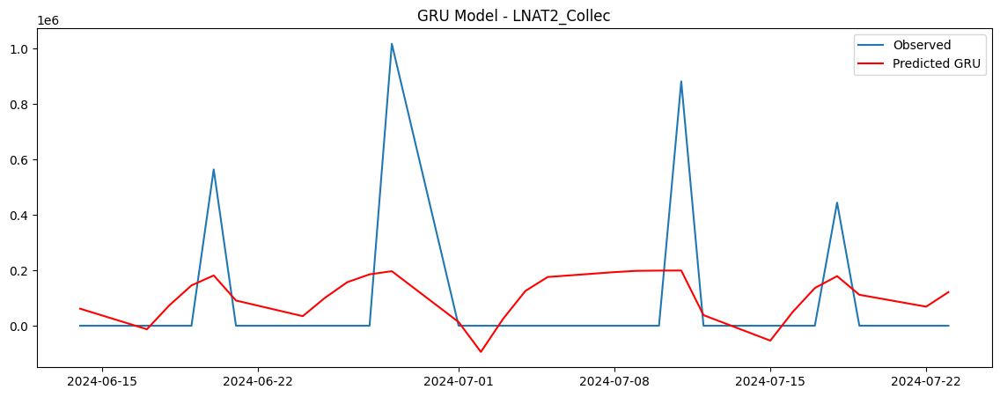

Processing series: LNACC_Collec
Training MLP model for LNACC_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
RMSE for LNACC_Collec using MLP: 8722079.240587376


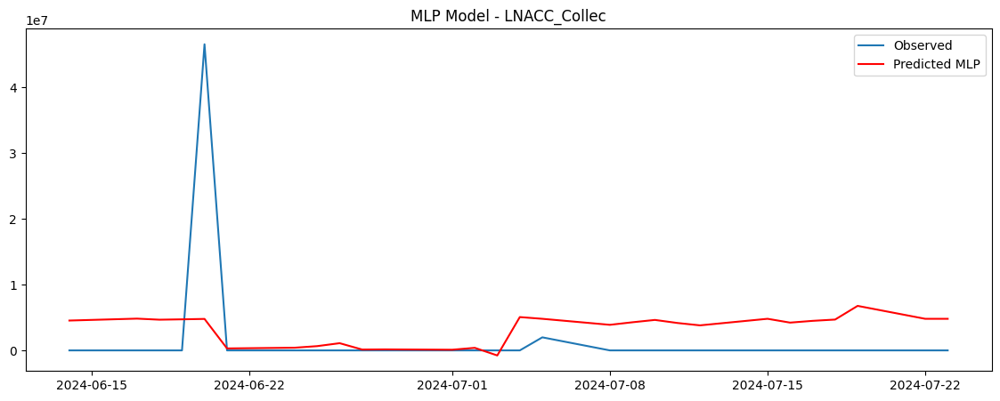

Training LSTM model for LNACC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
RMSE for LNACC_Collec using LSTM: 416851740477798.2


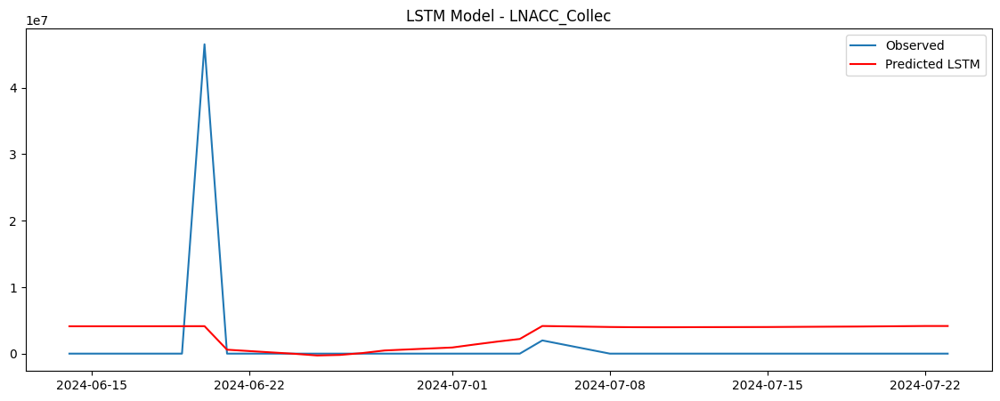

Training CNN model for LNACC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNACC_Collec using CNN: 1.9736529411673294e+22


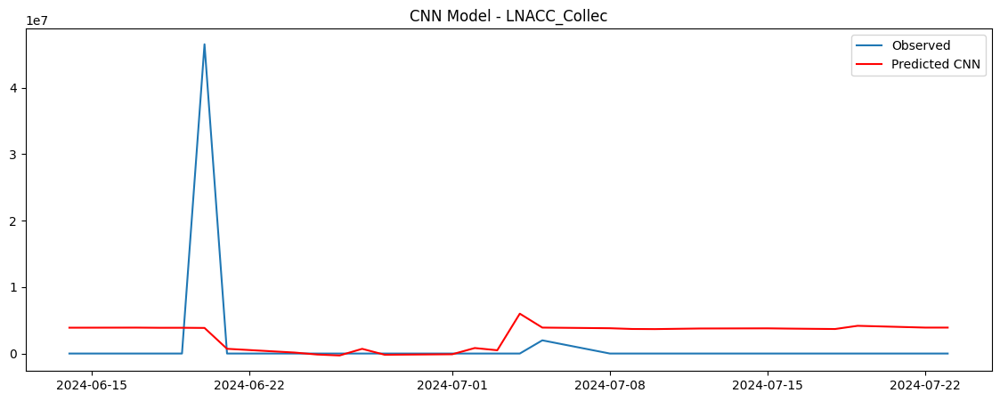

Training GRU model for LNACC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
RMSE for LNACC_Collec using GRU: 9.344583568512134e+29


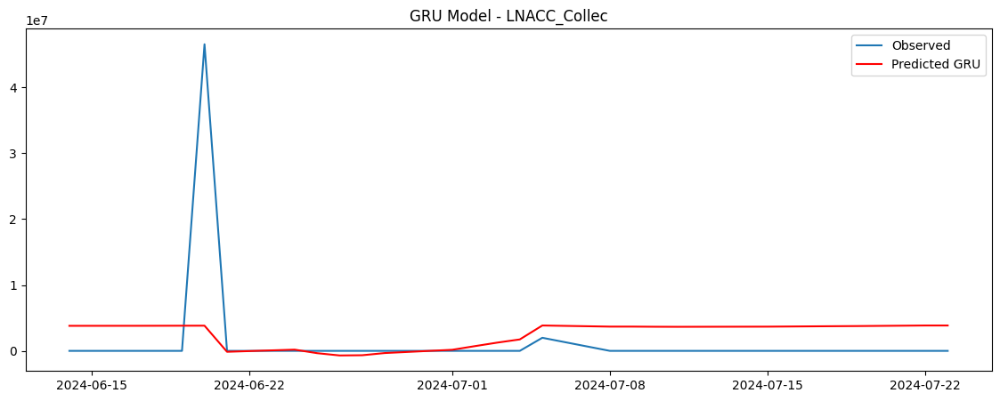

Processing series: LNACE_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNACE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
RMSE for LNACE_Collec using MLP: 0.0


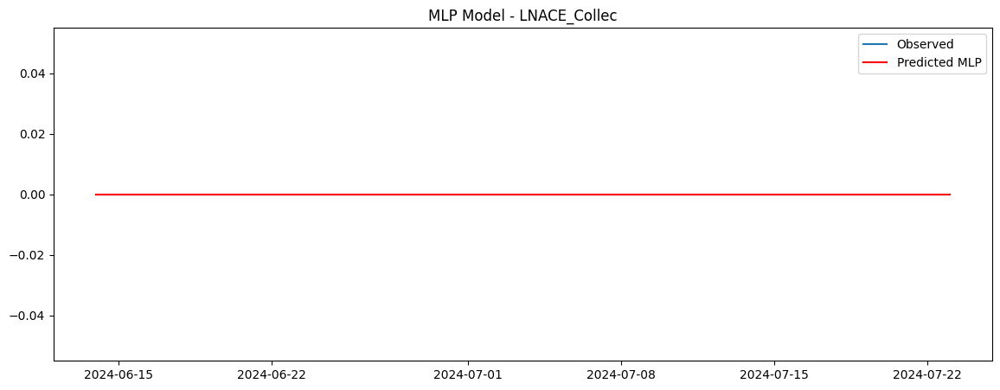

Training LSTM model for LNACE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
RMSE for LNACE_Collec using LSTM: 0.0


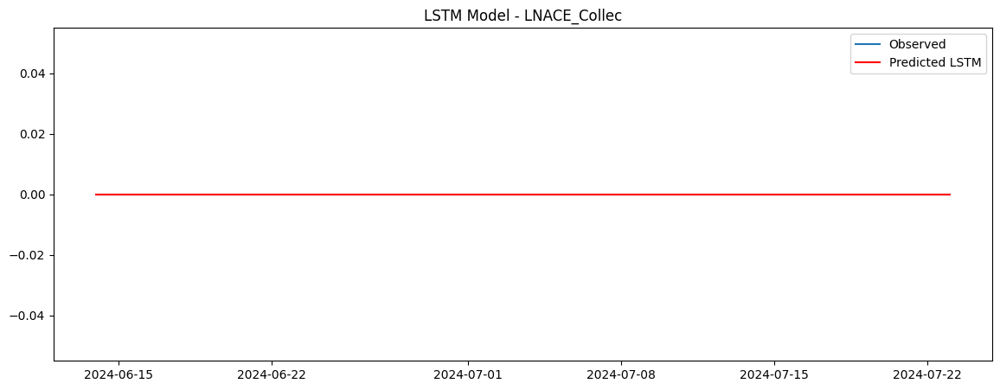

Training CNN model for LNACE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
RMSE for LNACE_Collec using CNN: 0.0


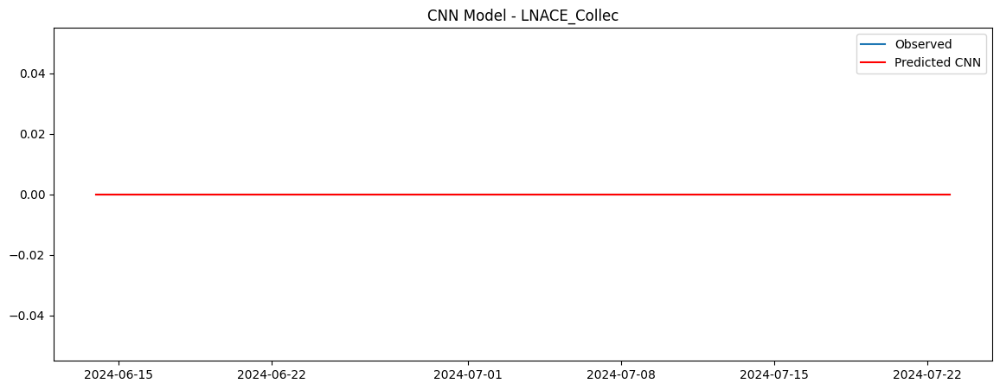

Training GRU model for LNACE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
RMSE for LNACE_Collec using GRU: 0.0


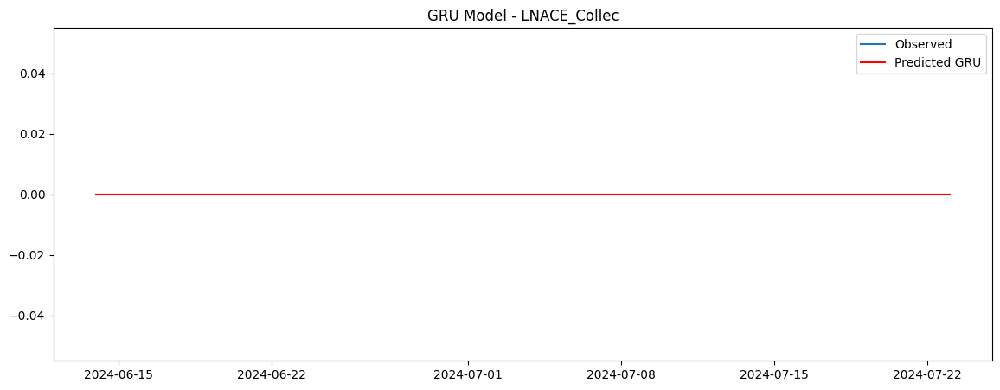

Processing series: LNAC3_Collec
Training MLP model for LNAC3_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNAC3_Collec using MLP: 0.0


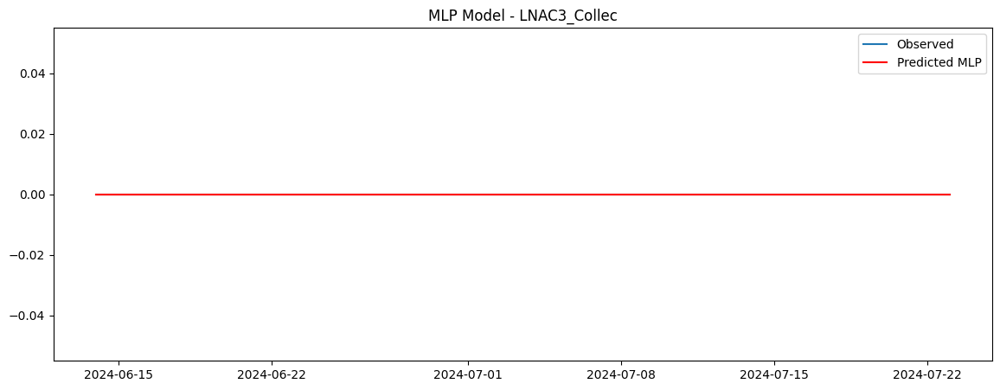

Training LSTM model for LNAC3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
RMSE for LNAC3_Collec using LSTM: 0.0


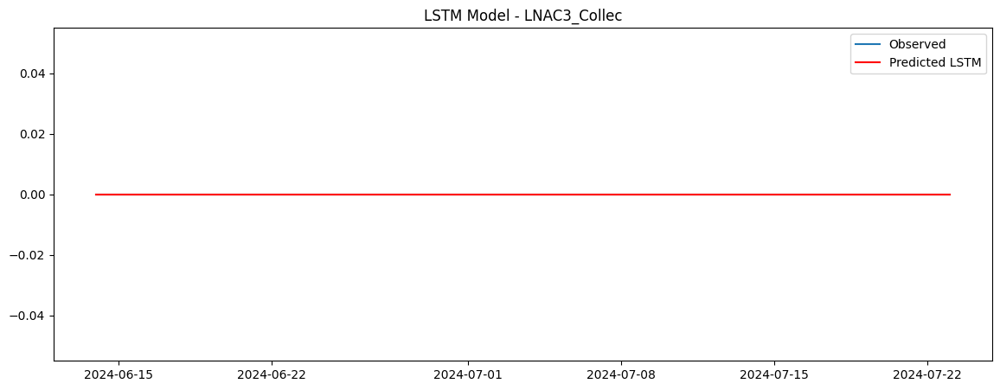

Training CNN model for LNAC3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
RMSE for LNAC3_Collec using CNN: 0.0


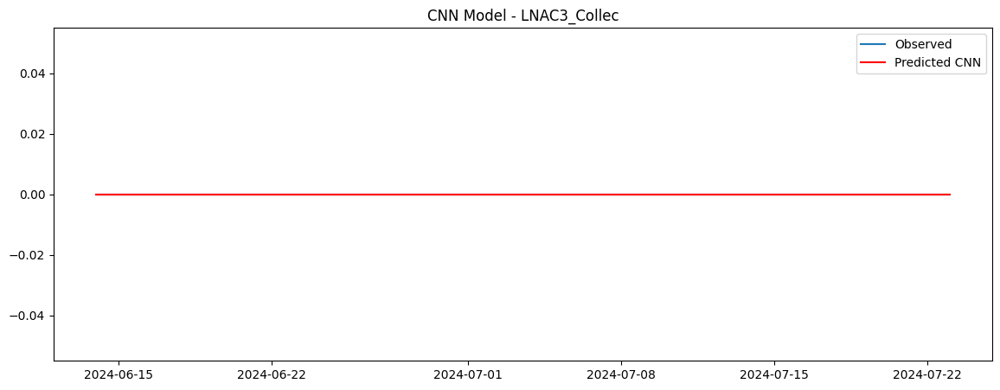

Training GRU model for LNAC3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
RMSE for LNAC3_Collec using GRU: 0.0


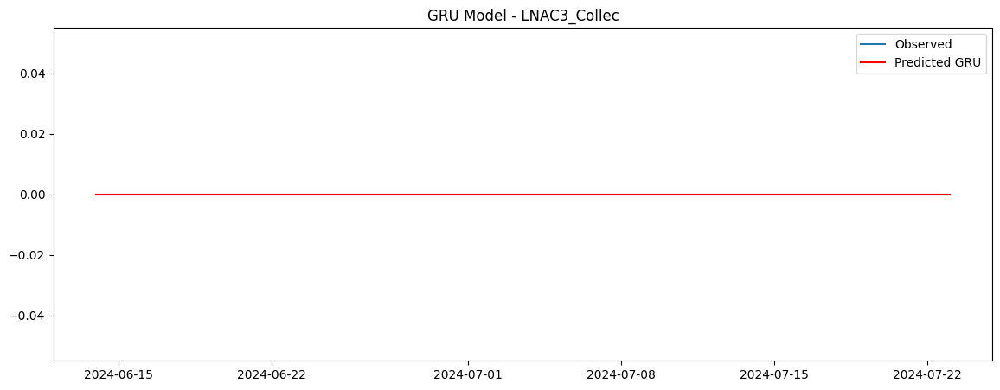

Processing series: LNAC4_Collec
Training MLP model for LNAC4_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNAC4_Collec using MLP: 0.0


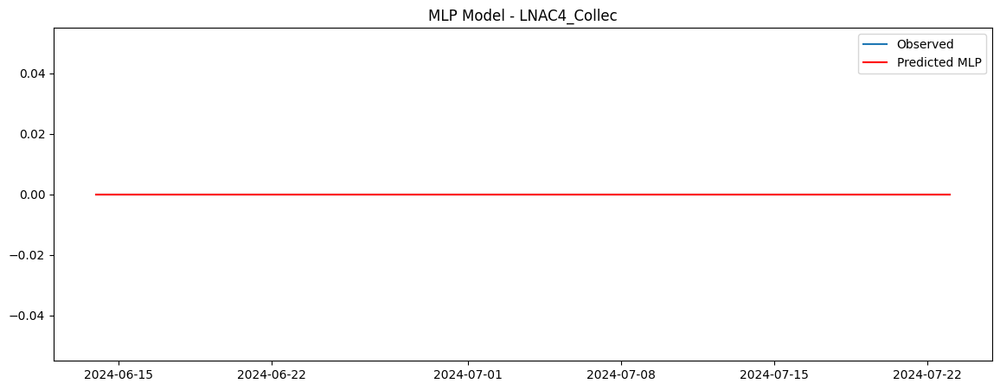

Training LSTM model for LNAC4_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
RMSE for LNAC4_Collec using LSTM: 0.0


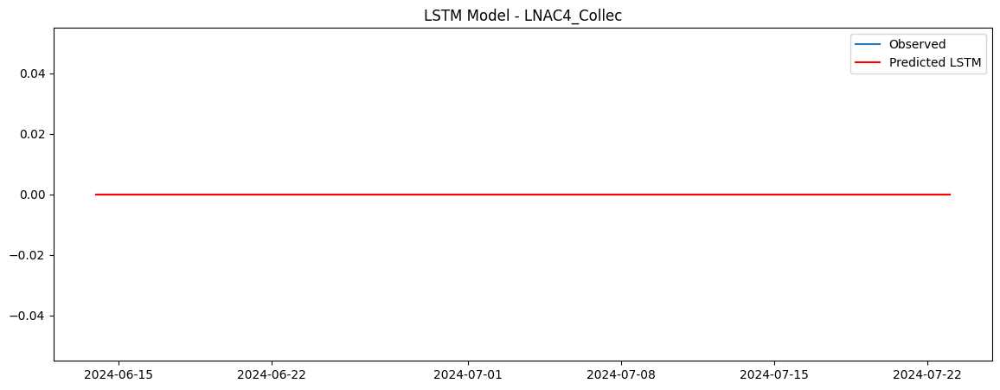

Training CNN model for LNAC4_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNAC4_Collec using CNN: 0.0


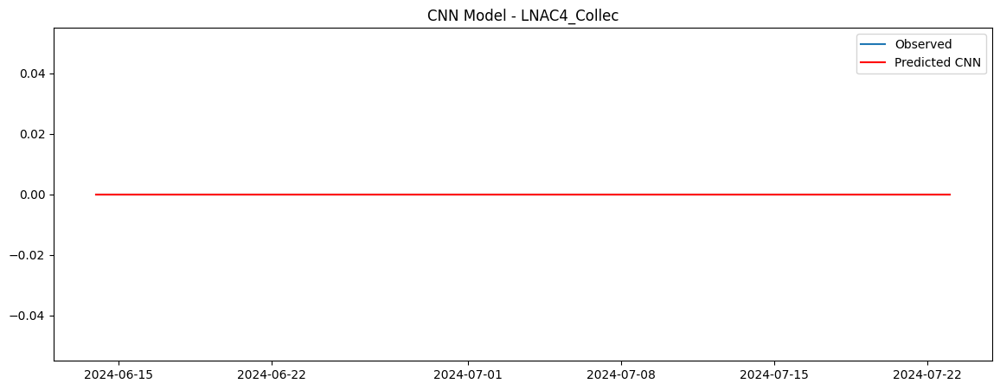

Training GRU model for LNAC4_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
RMSE for LNAC4_Collec using GRU: 0.0


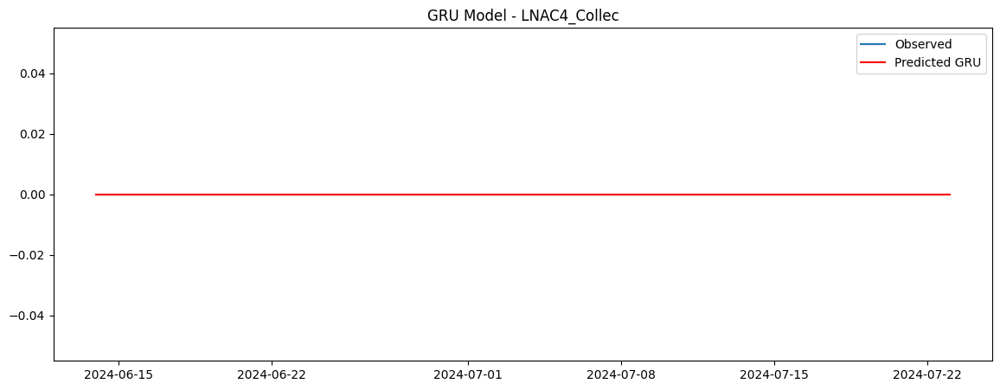

Processing series: LNAC6_Collec
Training MLP model for LNAC6_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
RMSE for LNAC6_Collec using MLP: 9945.60761354582


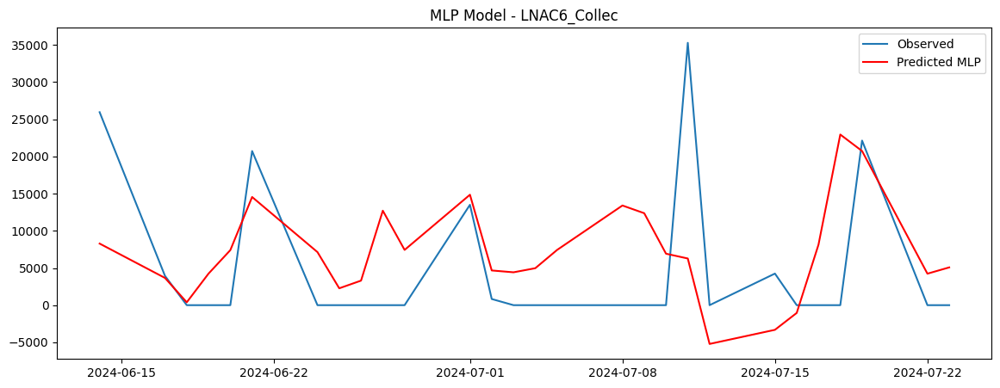

Training LSTM model for LNAC6_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
RMSE for LNAC6_Collec using LSTM: 824299937.8478489


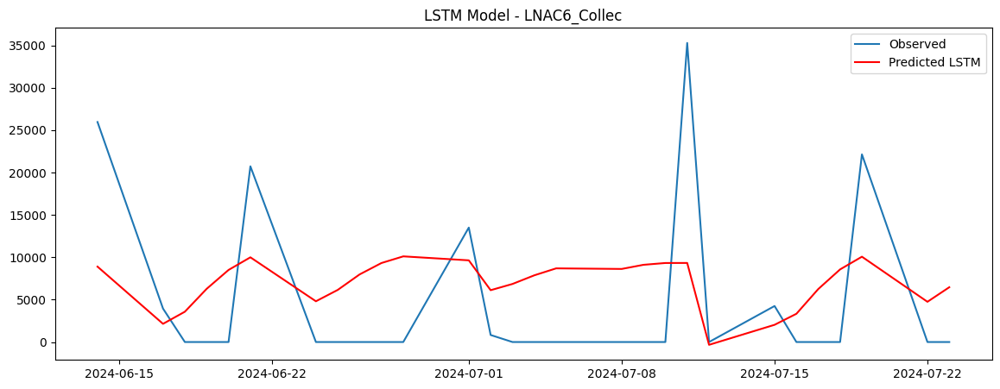

Training CNN model for LNAC6_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNAC6_Collec using CNN: 65049748206743.96


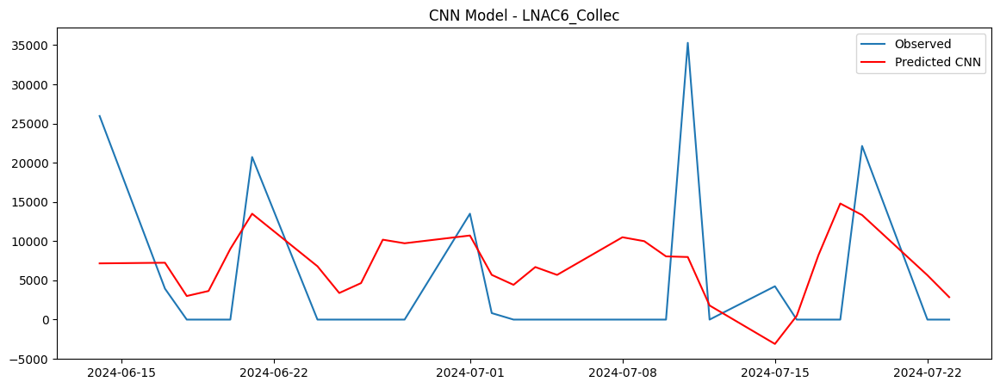

Training GRU model for LNAC6_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
RMSE for LNAC6_Collec using GRU: 5.133385918618846e+18


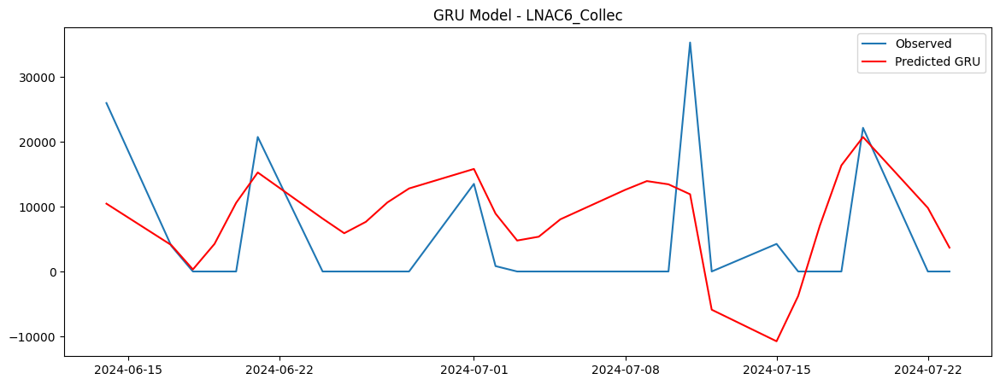

Processing series: LNDOL_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNDOL_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
RMSE for LNDOL_Collec using MLP: 1403990.9965433013


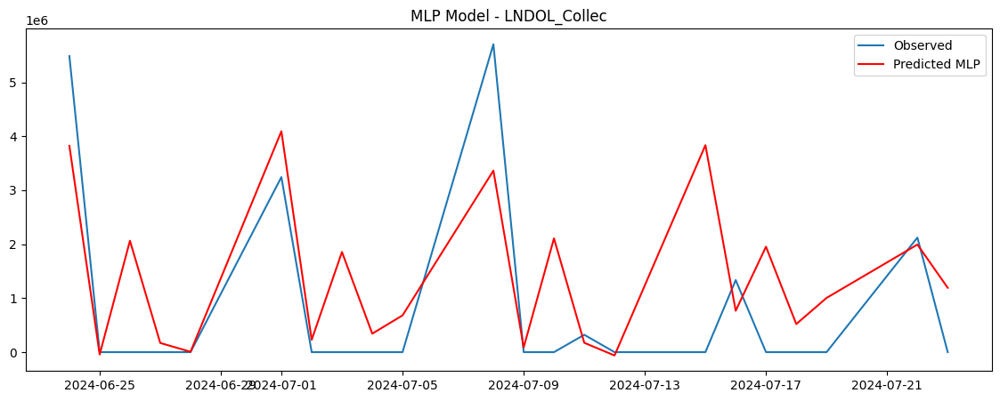

Training LSTM model for LNDOL_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
RMSE for LNDOL_Collec using LSTM: 20988157698681.074


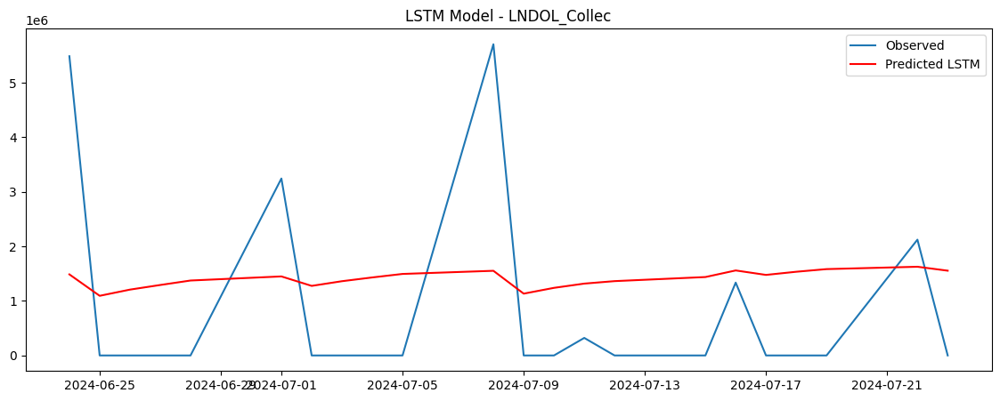

Training CNN model for LNDOL_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNDOL_Collec using CNN: 2.316894640761623e+20


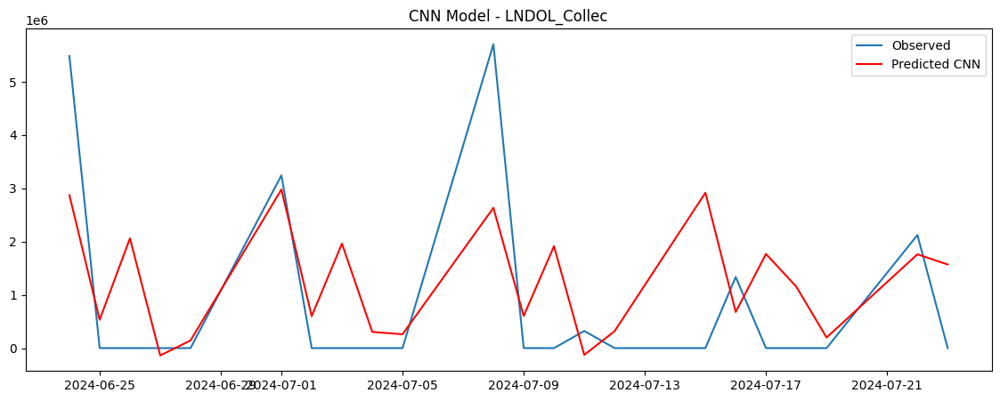

Training GRU model for LNDOL_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
RMSE for LNDOL_Collec using GRU: 2.557633063539436e+27


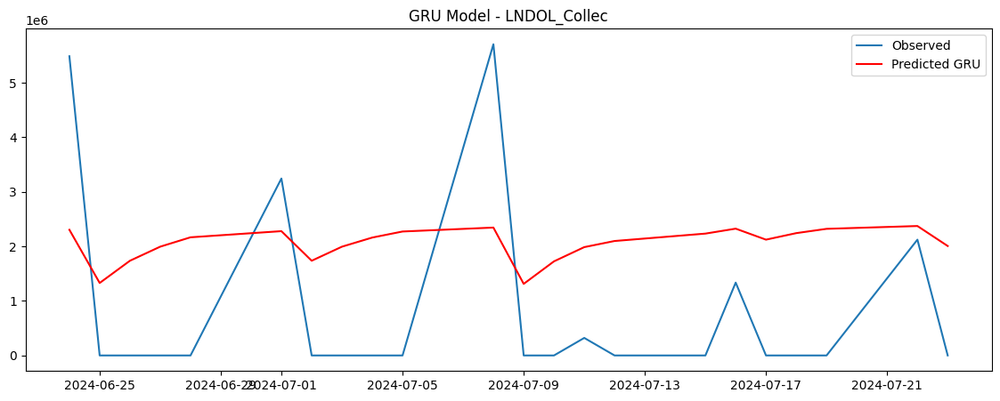

Processing series: LNEDI_Collec
Training MLP model for LNEDI_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNEDI_Collec using MLP: 7285318.490044558


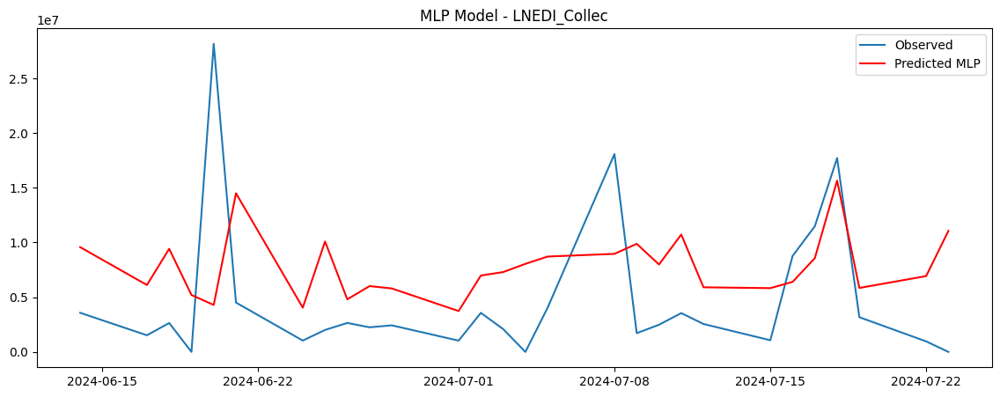

Training LSTM model for LNEDI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
RMSE for LNEDI_Collec using LSTM: 353821057560707.1


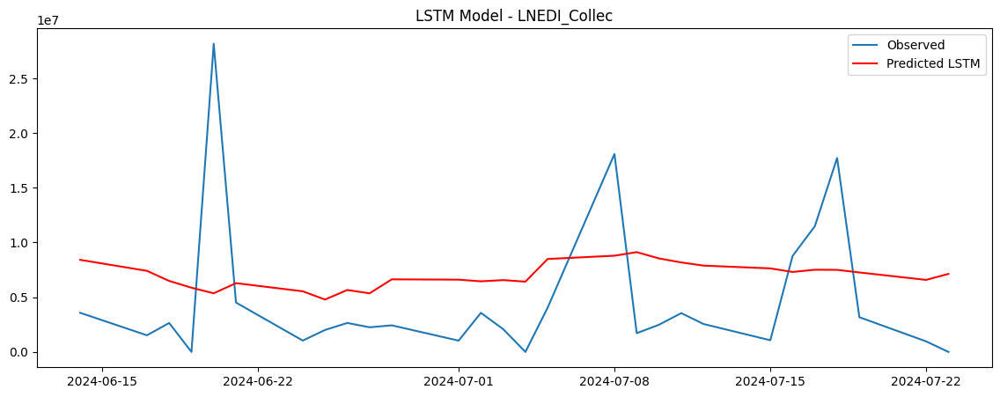

Training CNN model for LNEDI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
RMSE for LNEDI_Collec using CNN: 1.5688229136532253e+22


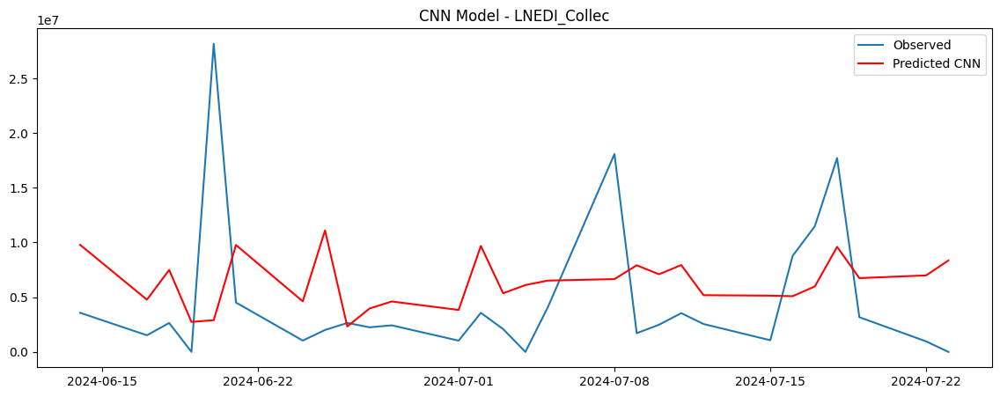

Training GRU model for LNEDI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
RMSE for LNEDI_Collec using GRU: 6.95607356474029e+29


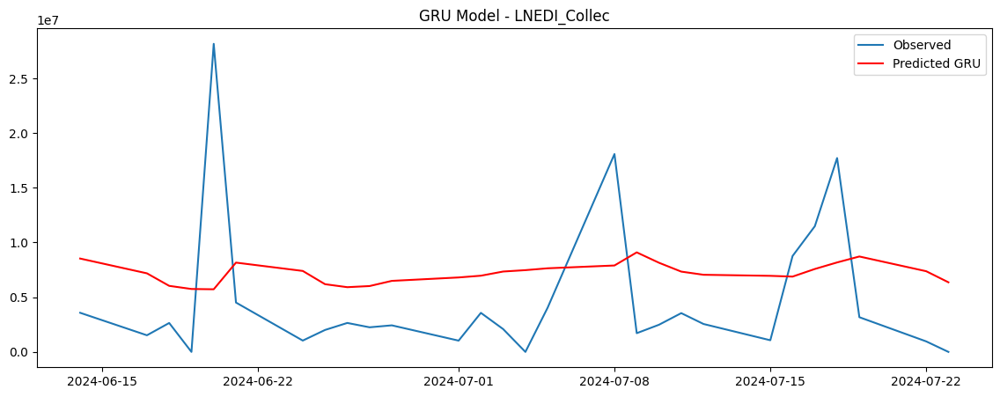

Processing series: LNEDN_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNEDN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
RMSE for LNEDN_Collec using MLP: 3989826.7390964245


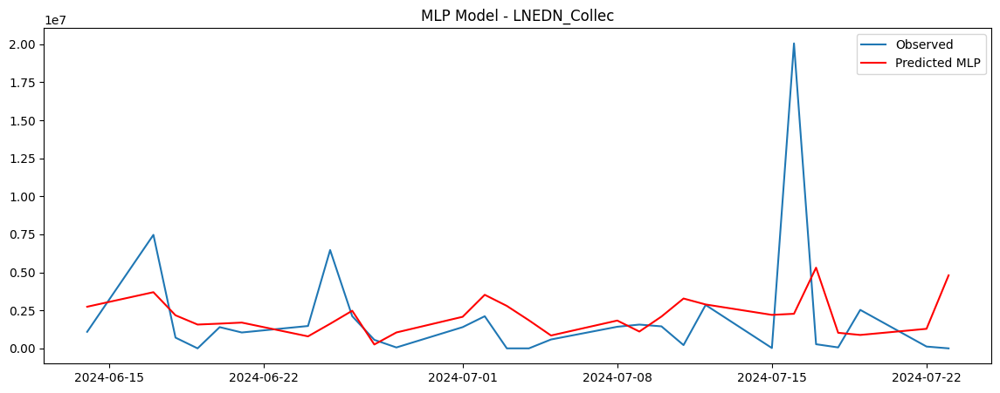

Training LSTM model for LNEDN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
RMSE for LNEDN_Collec using LSTM: 88079946965480.17


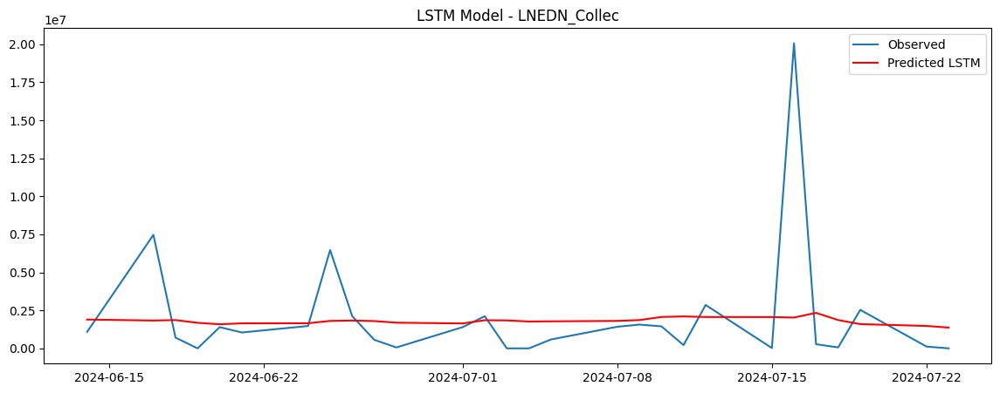

Training CNN model for LNEDN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
RMSE for LNEDN_Collec using CNN: 1.7670068824350416e+21


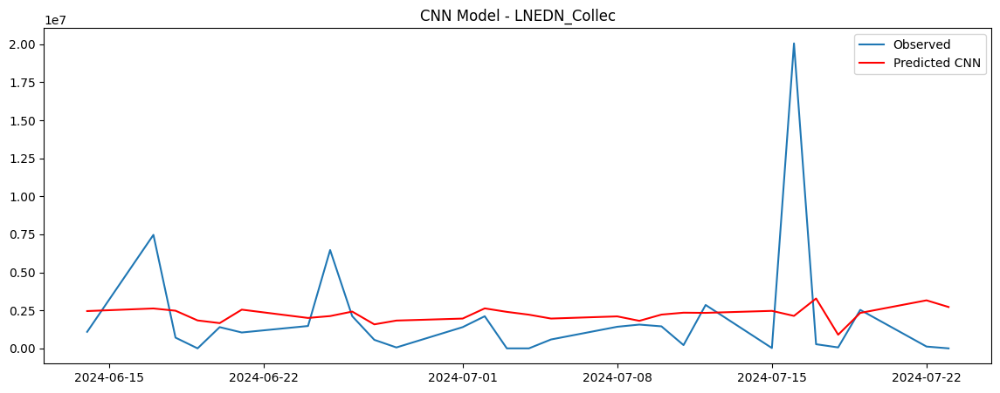

Training GRU model for LNEDN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
RMSE for LNEDN_Collec using GRU: 3.544862819590805e+28


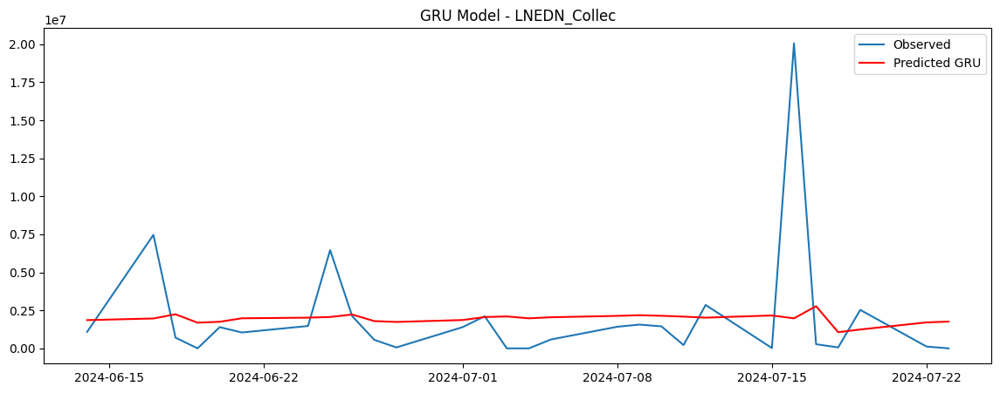

Processing series: LNENT_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNENT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNENT_Collec using MLP: 26724727.942394163


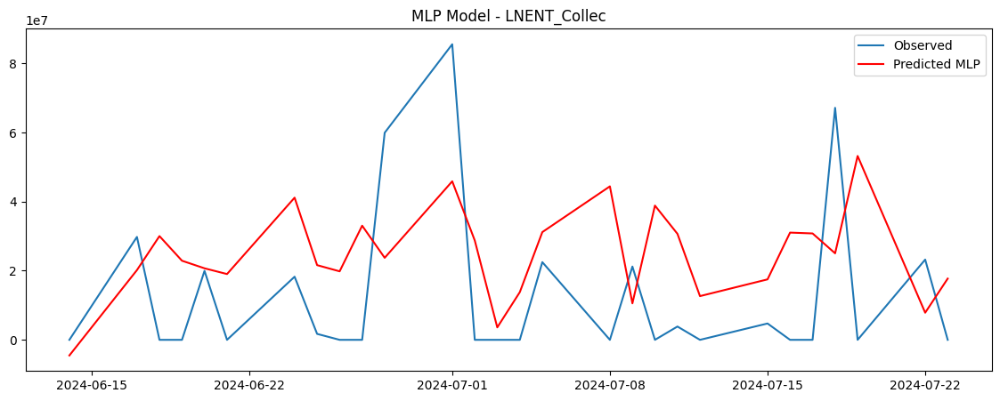

Training LSTM model for LNENT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
RMSE for LNENT_Collec using LSTM: 4238186549344654.0


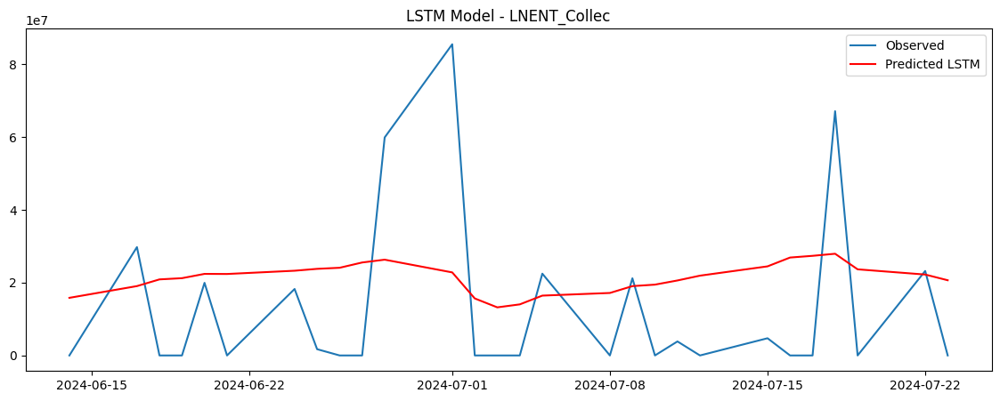

Training CNN model for LNENT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
RMSE for LNENT_Collec using CNN: 6.974532514632128e+23


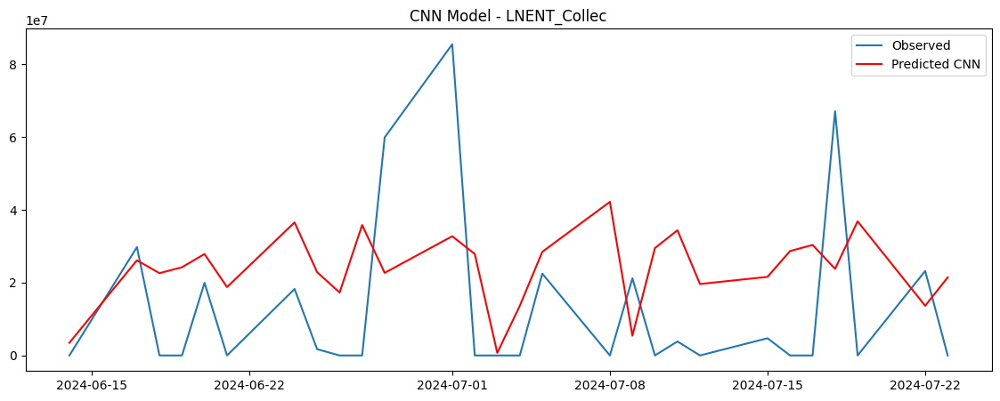

Training GRU model for LNENT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
RMSE for LNENT_Collec using GRU: 1.1477574924555676e+32


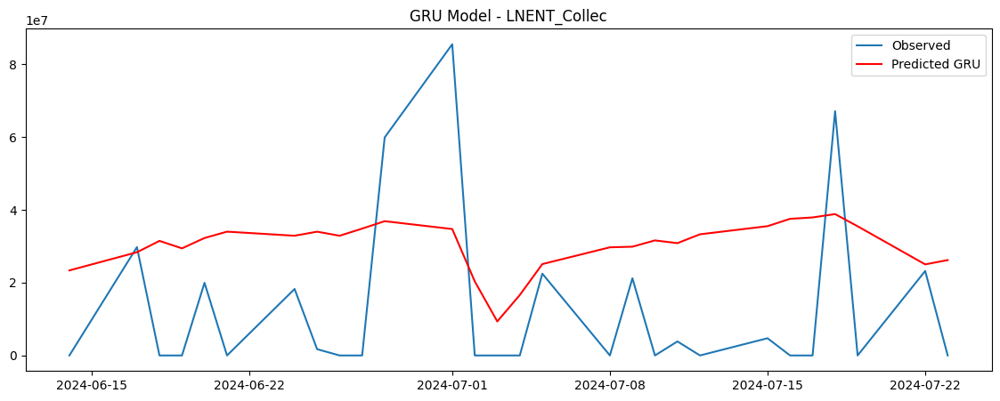

Processing series: LNENE_Collec
Training MLP model for LNENE_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNENE_Collec using MLP: 18767947.61403448


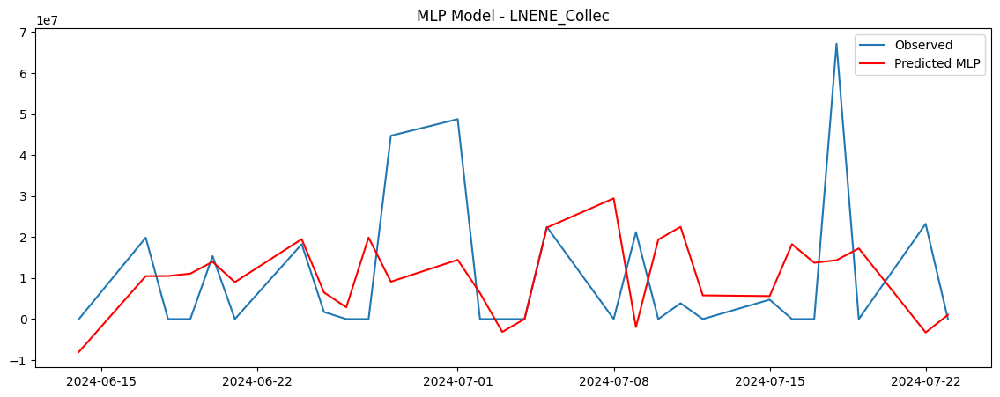

Training LSTM model for LNENE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
RMSE for LNENE_Collec using LSTM: 1698699191589084.8


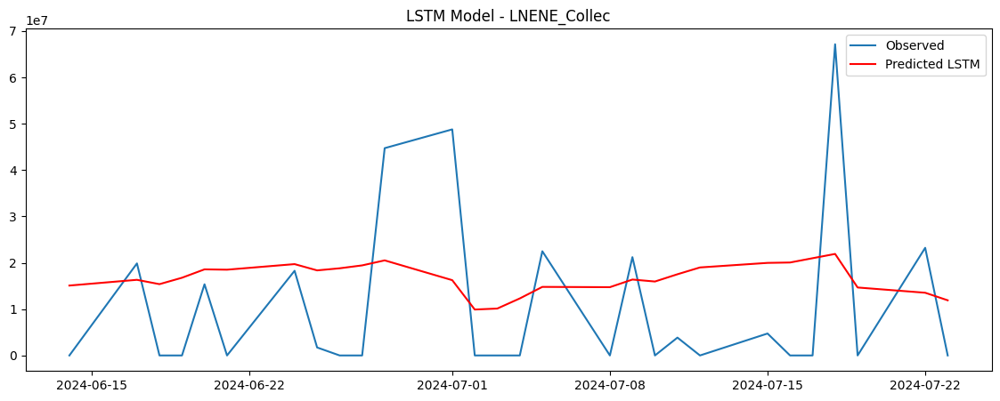

Training CNN model for LNENE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNENE_Collec using CNN: 1.4308769480333297e+23


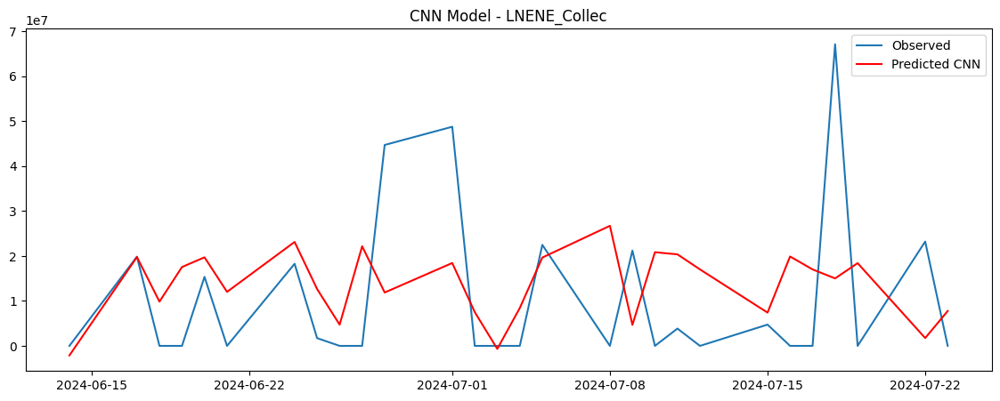

Training GRU model for LNENE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
RMSE for LNENE_Collec using GRU: 1.2052803928771996e+31


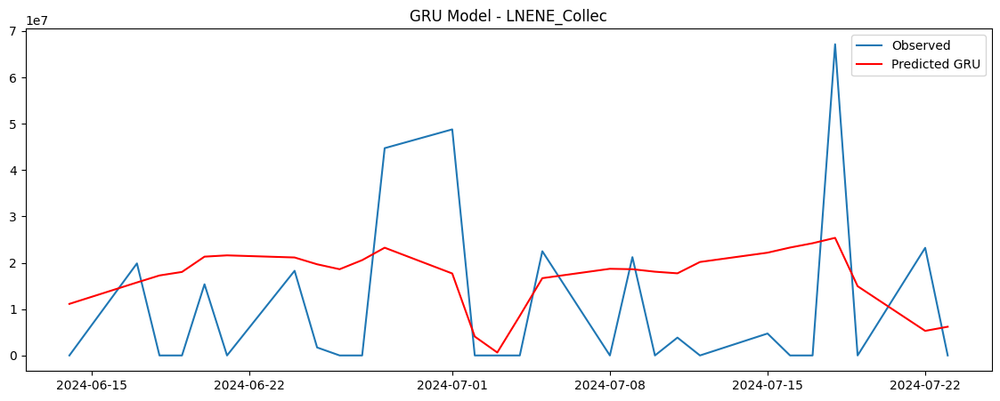

Processing series: LNENM_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNENM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
RMSE for LNENM_Collec using MLP: 8997638.599280097


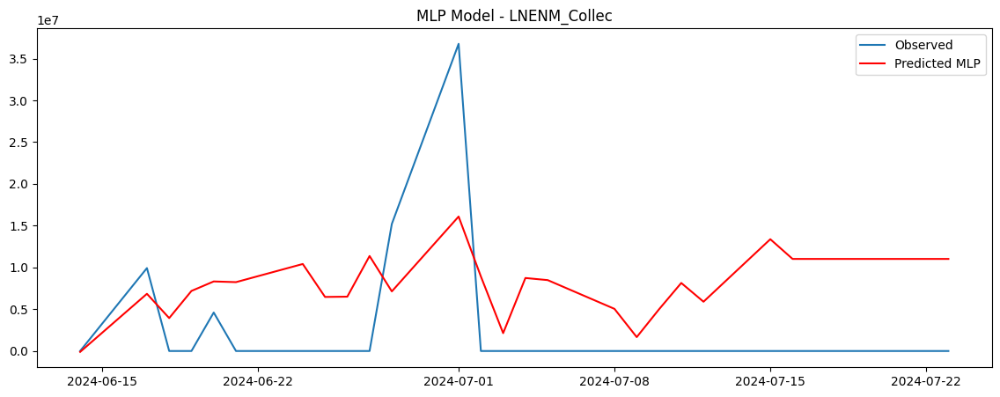

Training LSTM model for LNENM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
RMSE for LNENM_Collec using LSTM: 626352870585491.2


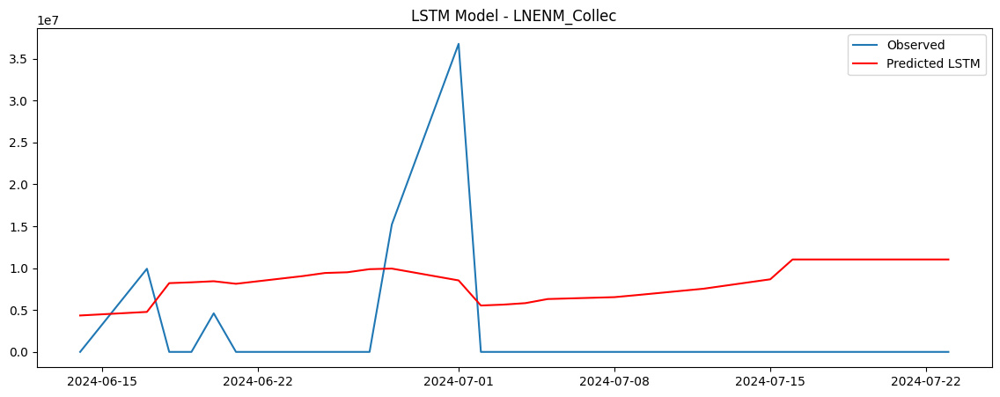

Training CNN model for LNENM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
RMSE for LNENM_Collec using CNN: 5.0315170117262445e+22


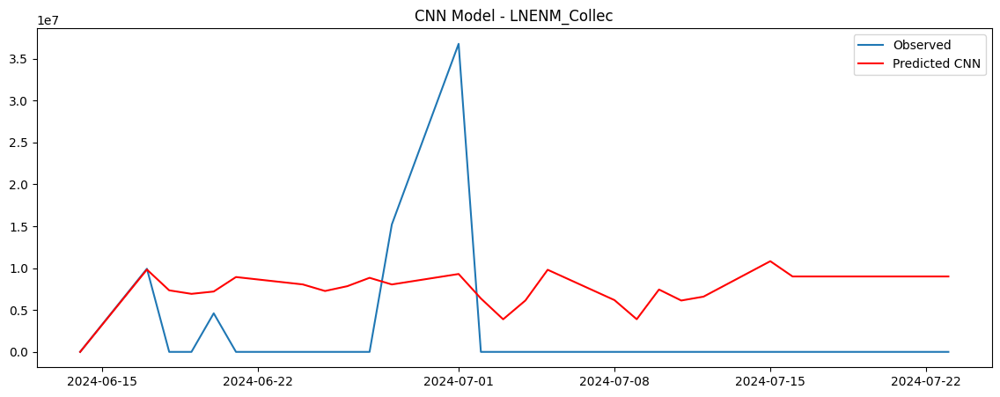

Training GRU model for LNENM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
RMSE for LNENM_Collec using GRU: 4.041837201705964e+30


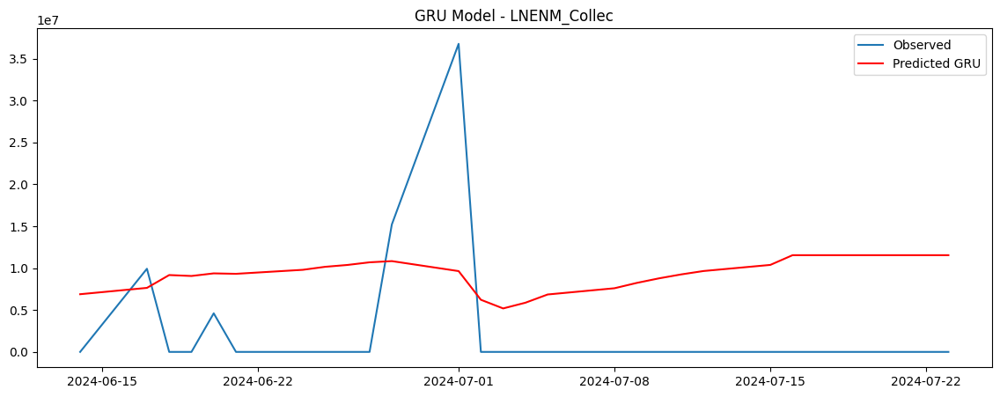

Processing series: LNEFM_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNEFM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNEFM_Collec using MLP: 19982999.09282801


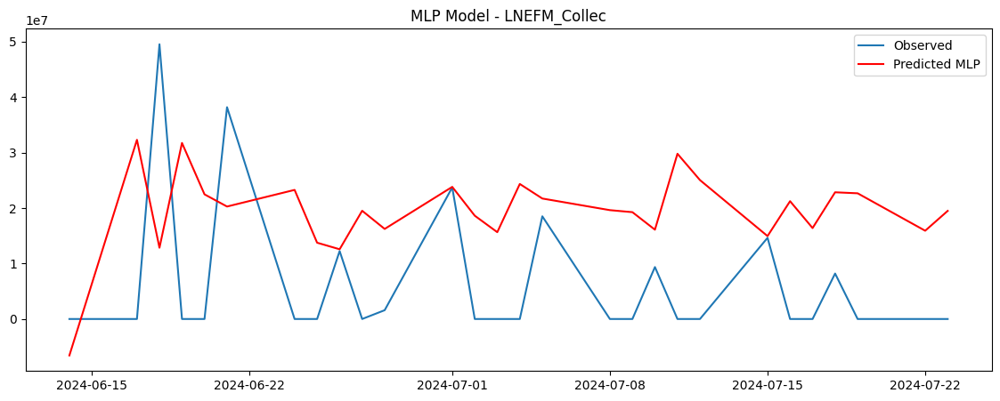

Training LSTM model for LNEFM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
RMSE for LNEFM_Collec using LSTM: 7090258325383494.0


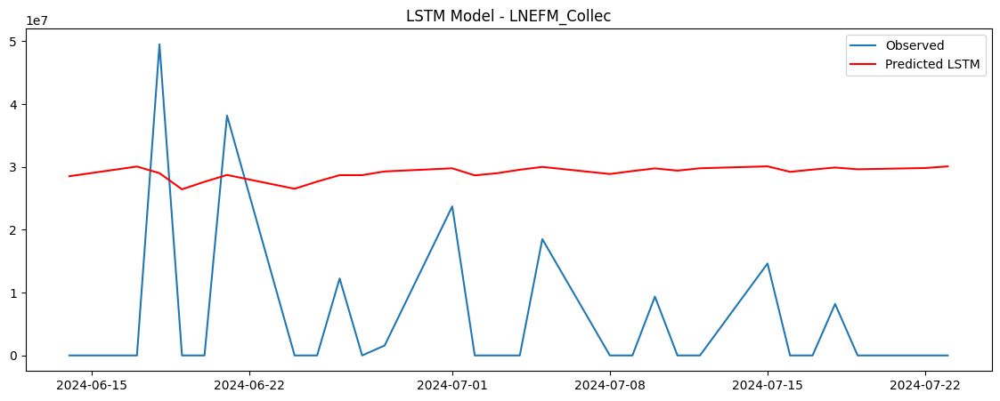

Training CNN model for LNEFM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNEFM_Collec using CNN: 3.641168726238225e+24


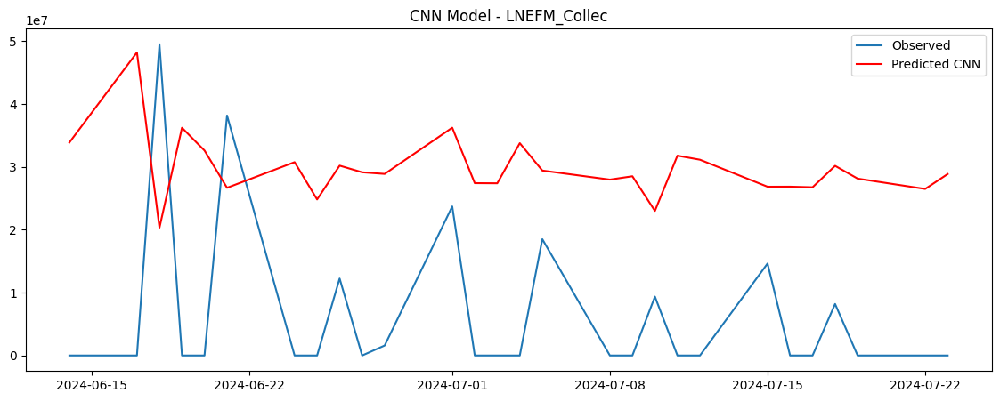

Training GRU model for LNEFM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
RMSE for LNEFM_Collec using GRU: 1.8699050245493458e+33


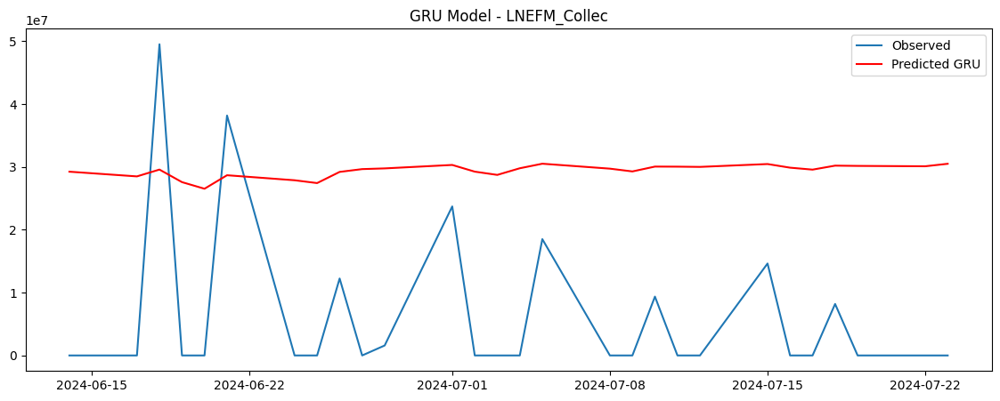

Processing series: LNENP_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNENP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
RMSE for LNENP_Collec using MLP: 4342644.45935537


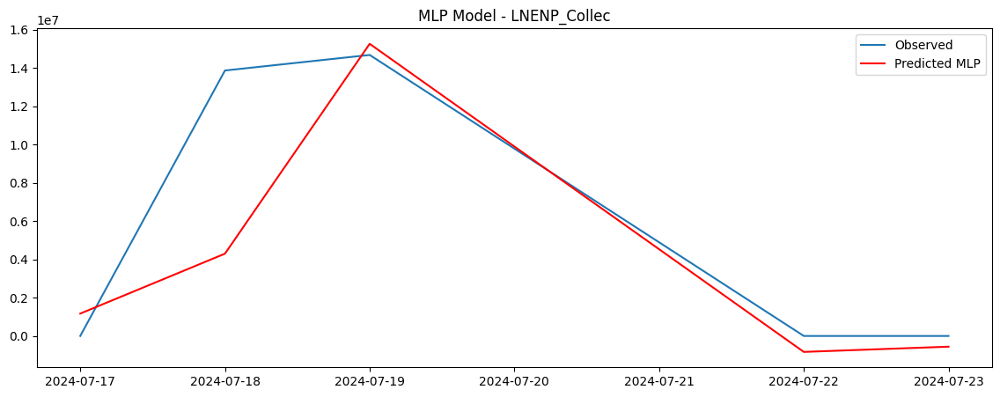

Training LSTM model for LNENP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
RMSE for LNENP_Collec using LSTM: 2941474221248213.0


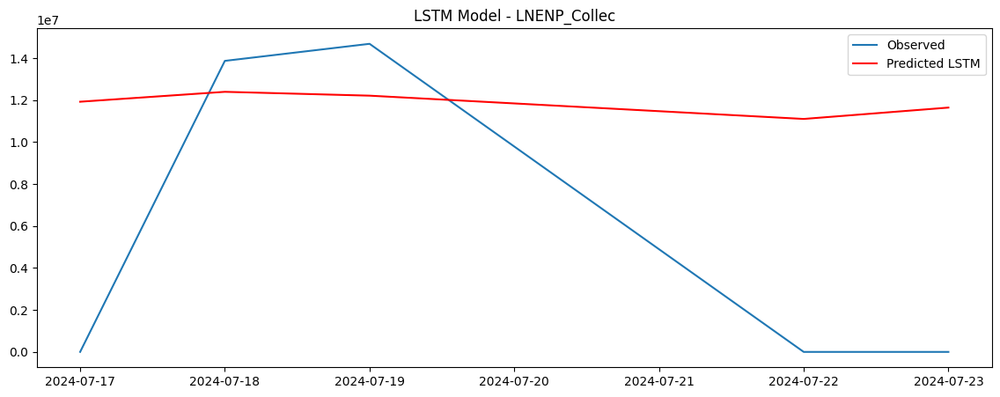

Training CNN model for LNENP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
RMSE for LNENP_Collec using CNN: 9.579758270542544e+23


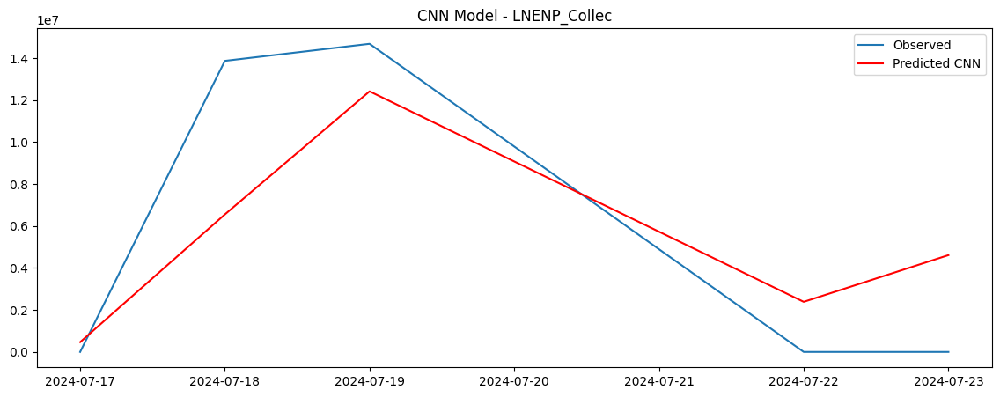

Training GRU model for LNENP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
RMSE for LNENP_Collec using GRU: 3.1199242752665123e+32


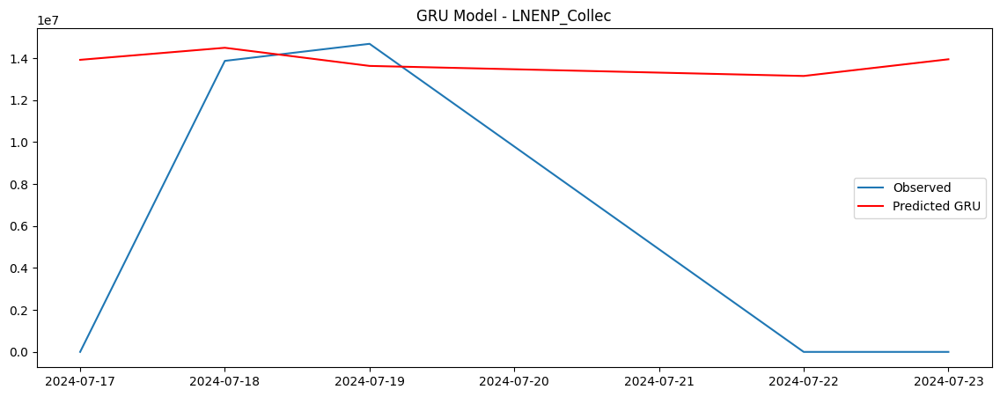

Processing series: LNENG_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNENG_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNENG_Collec using MLP: 4510312.382132687


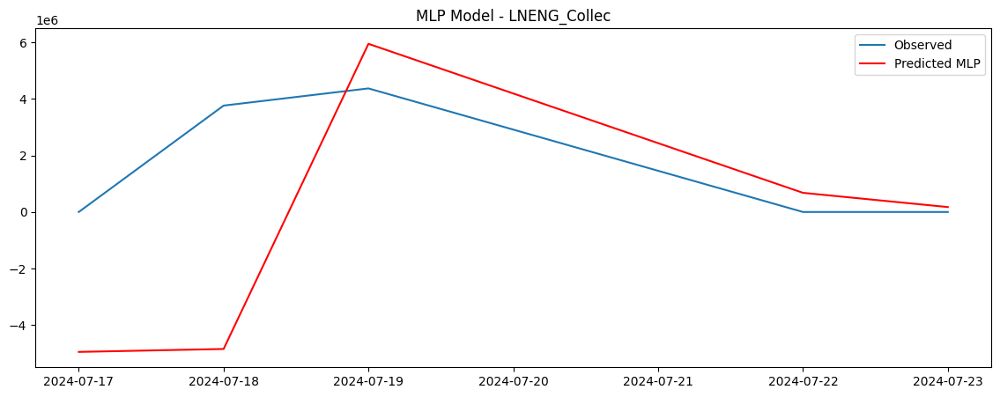

Training LSTM model for LNENG_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
RMSE for LNENG_Collec using LSTM: 187999840811149.62


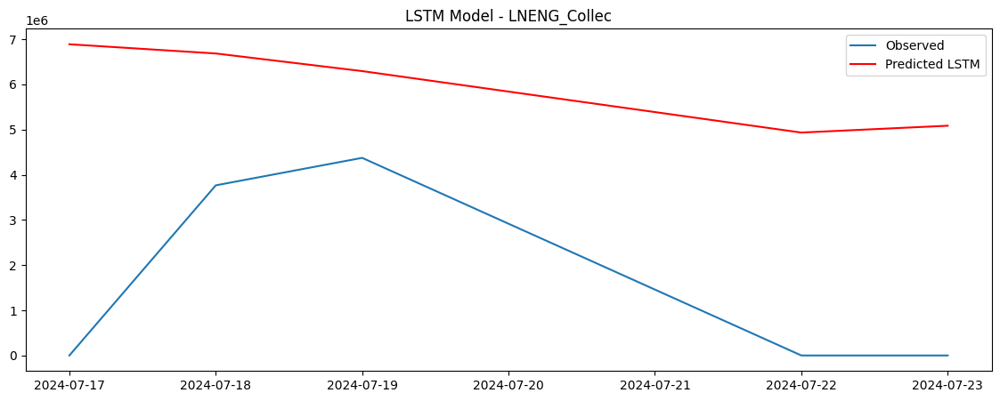

Training CNN model for LNENG_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
RMSE for LNENG_Collec using CNN: 1.3694071145271306e+22


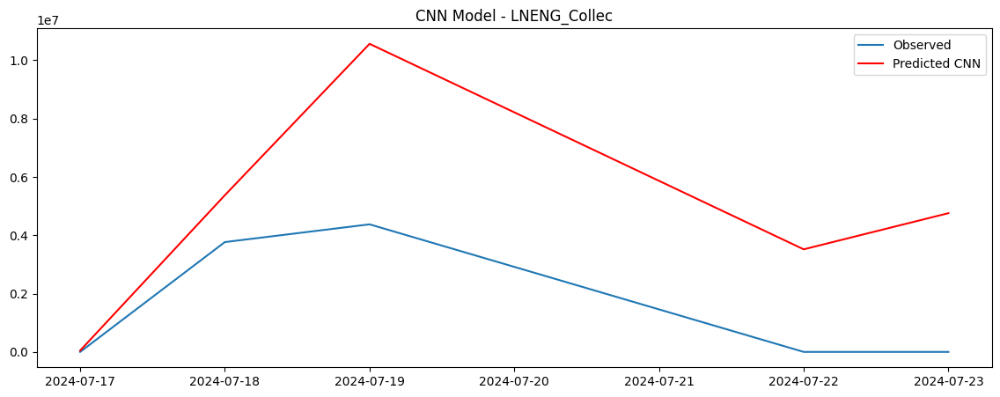

Training GRU model for LNENG_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
RMSE for LNENG_Collec using GRU: 9.974879747206763e+29


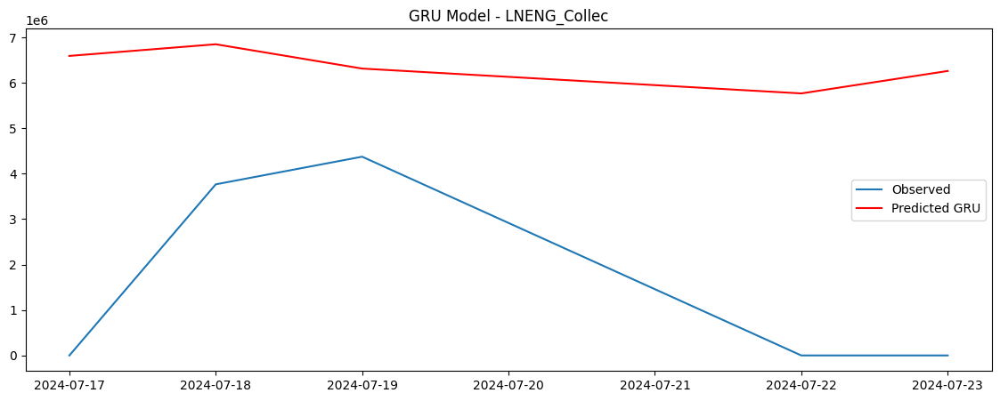

Processing series: LNSEN_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNSEN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
RMSE for LNSEN_Collec using MLP: 0.0


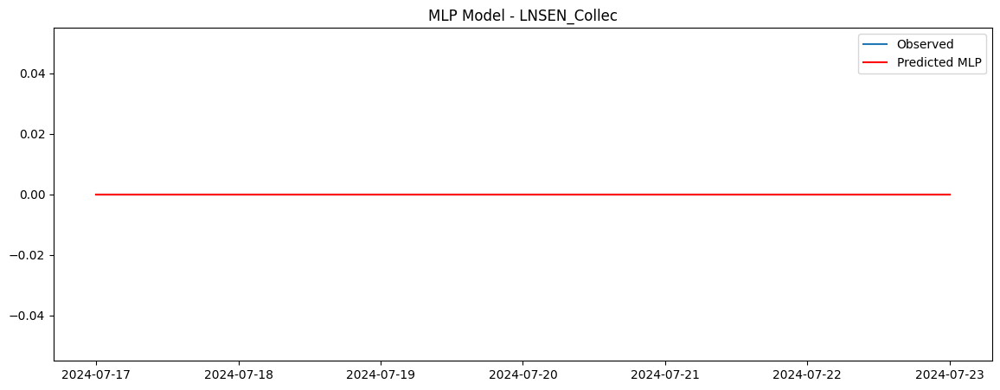

Training LSTM model for LNSEN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
RMSE for LNSEN_Collec using LSTM: 0.0


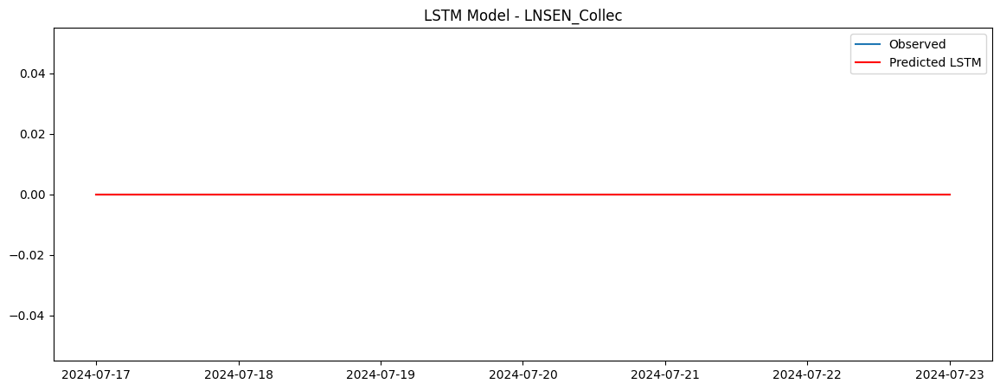

Training CNN model for LNSEN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNSEN_Collec using CNN: 0.0


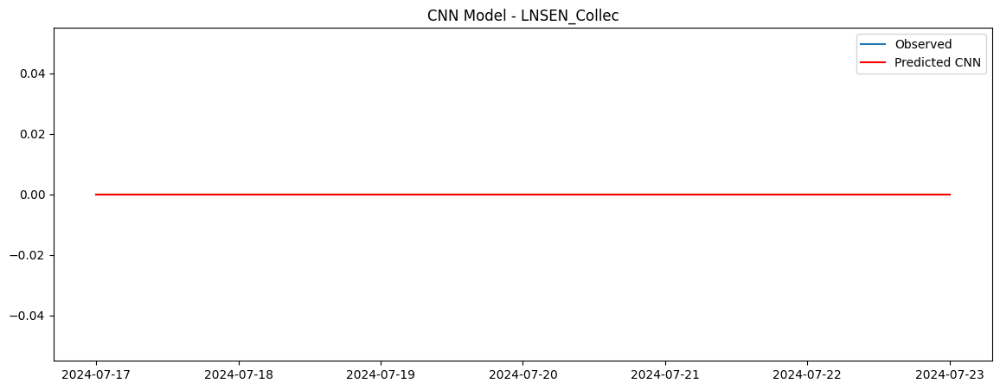

Training GRU model for LNSEN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
RMSE for LNSEN_Collec using GRU: 0.0


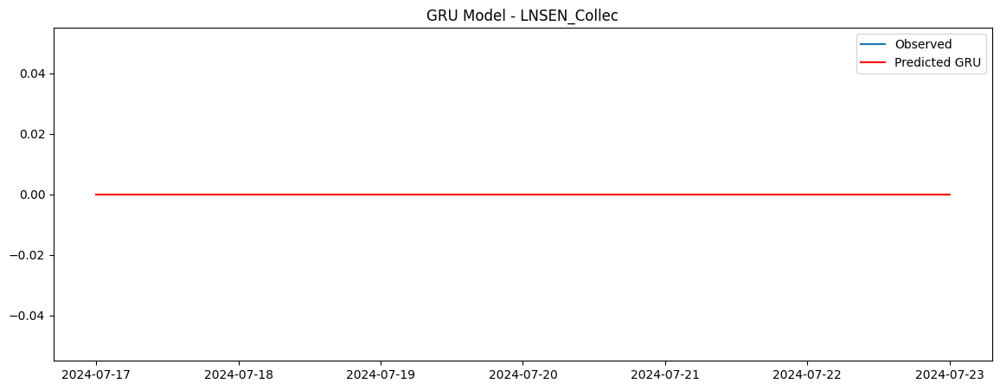

Processing series: LNENI_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNENI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNENI_Collec using MLP: 8540097.964534616


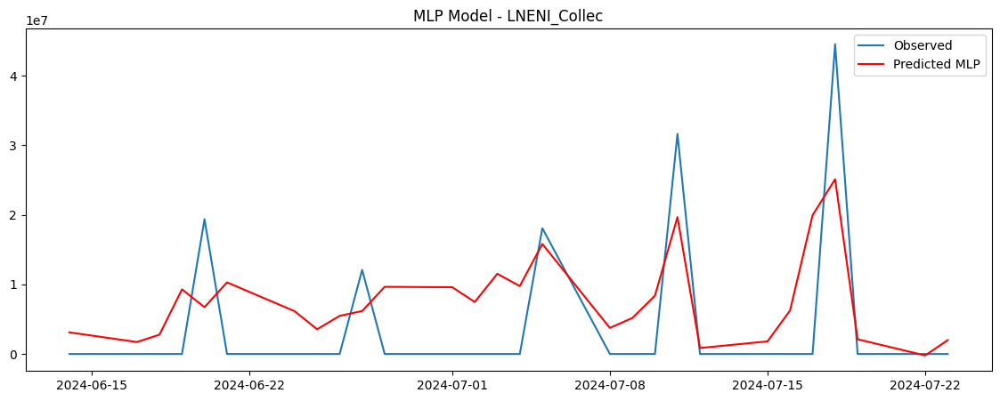

Training LSTM model for LNENI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
RMSE for LNENI_Collec using LSTM: 959790581392039.0


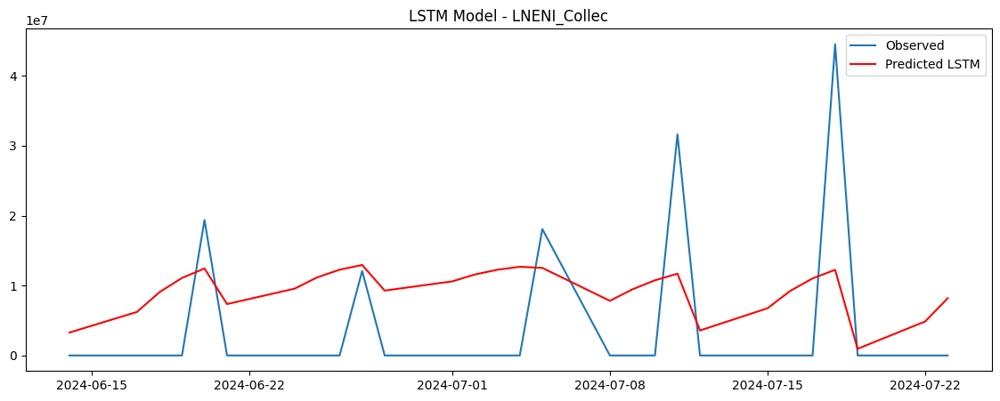

Training CNN model for LNENI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
RMSE for LNENI_Collec using CNN: 7.876120894398928e+22


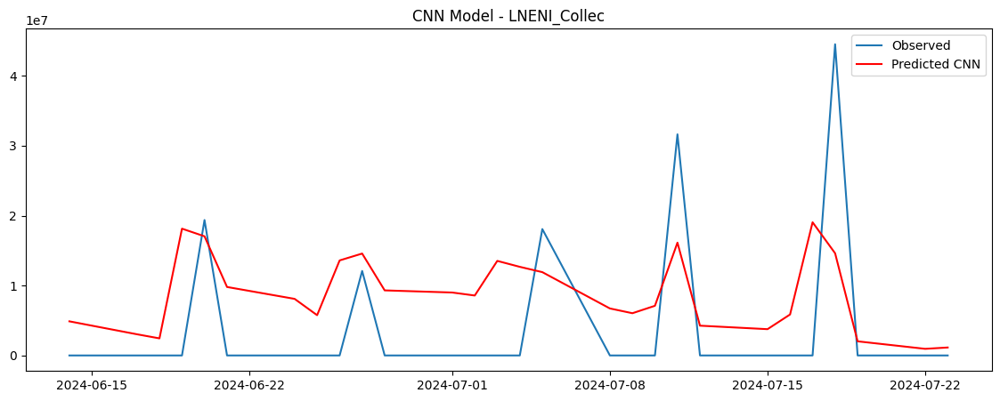

Training GRU model for LNENI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
RMSE for LNENI_Collec using GRU: 6.463209917047581e+30


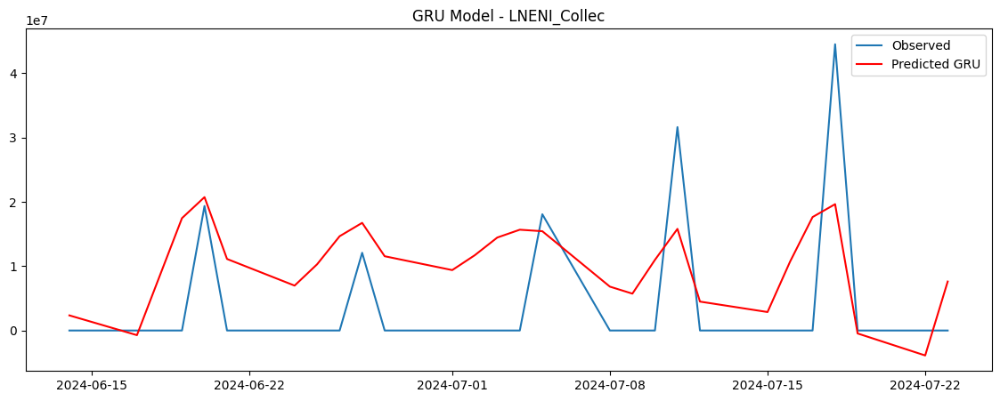

Processing series: LNENC_Collec
Training MLP model for LNENC_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
RMSE for LNENC_Collec using MLP: 38.87605667114258


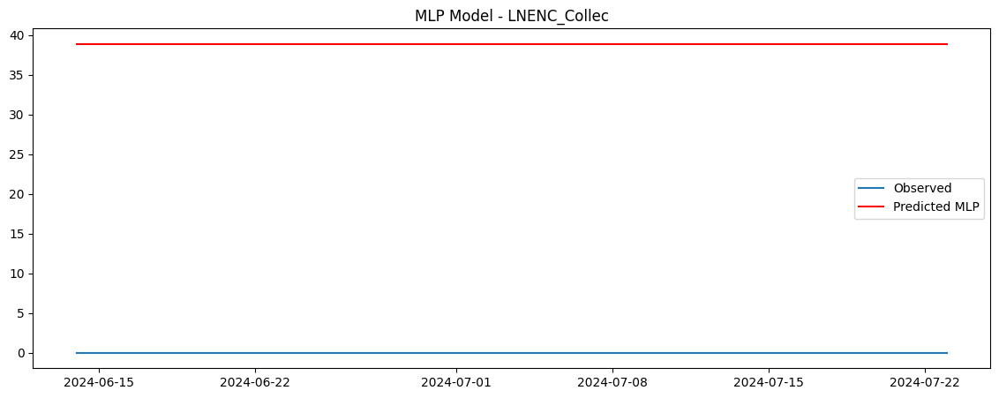

Training LSTM model for LNENC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
RMSE for LNENC_Collec using LSTM: 36.88123321533203


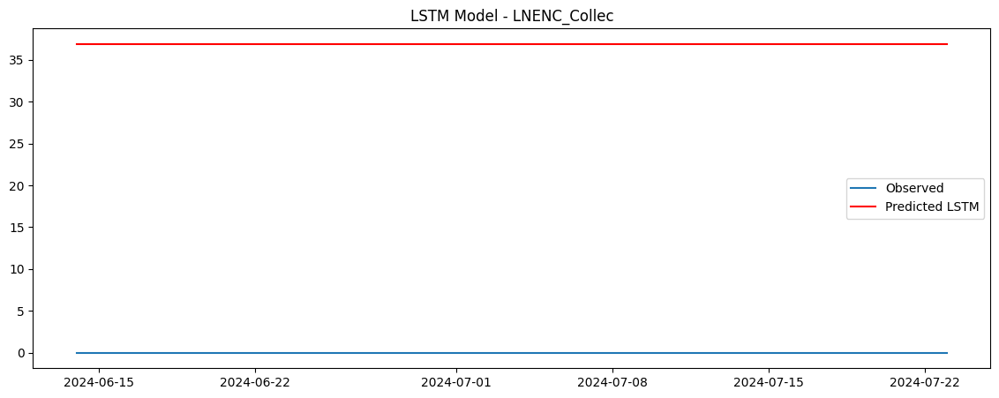

Training CNN model for LNENC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
RMSE for LNENC_Collec using CNN: 49.9879035949707


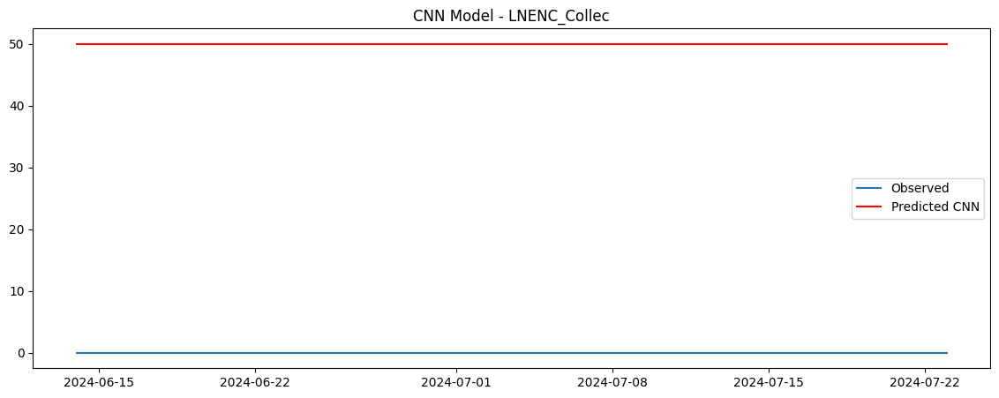

Training GRU model for LNENC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
RMSE for LNENC_Collec using GRU: 31.42597007751465


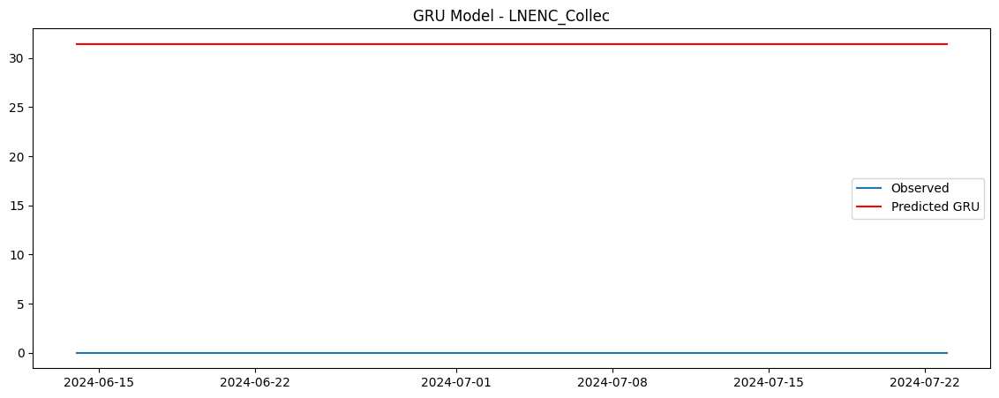

Processing series: LNEN3_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNEN3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
RMSE for LNEN3_Collec using MLP: 9.933572769165039


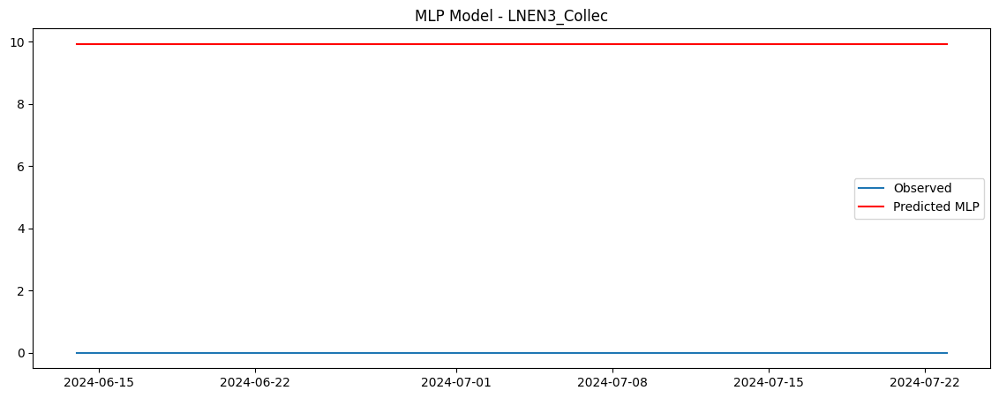

Training LSTM model for LNEN3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
RMSE for LNEN3_Collec using LSTM: 10.07863712310791


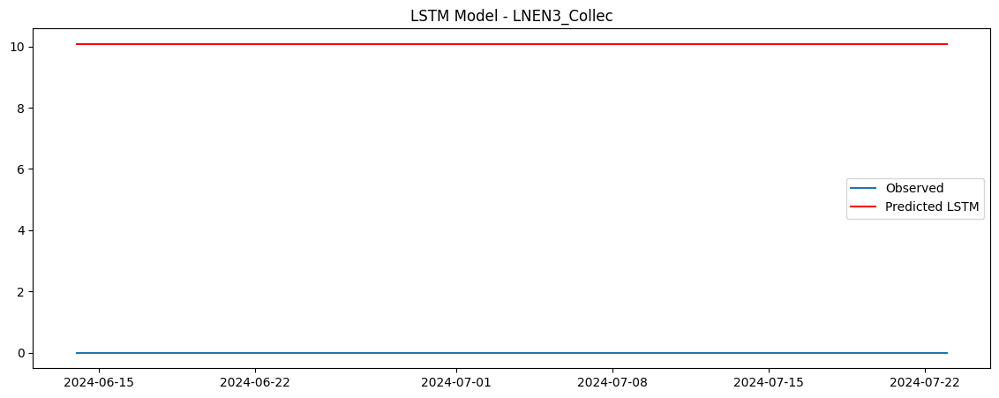

Training CNN model for LNEN3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
RMSE for LNEN3_Collec using CNN: 9.716792106628418


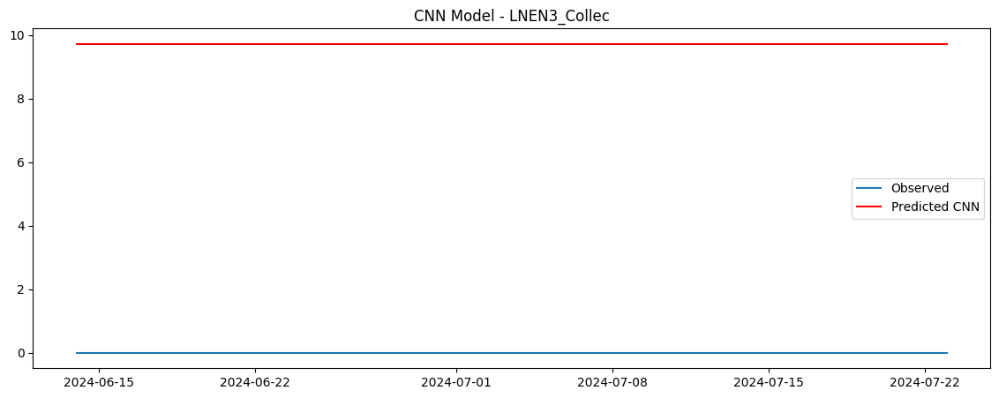

Training GRU model for LNEN3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
RMSE for LNEN3_Collec using GRU: 8.177215576171875


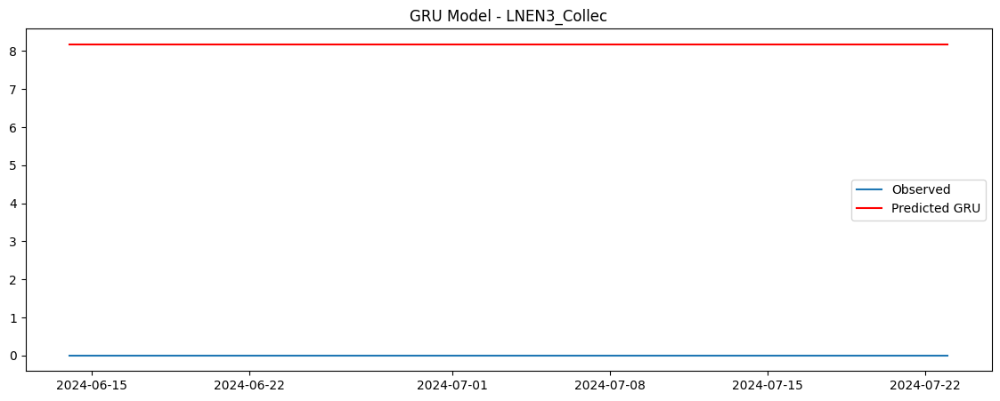

Processing series: LNGIV_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNGIV_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNGIV_Collec using MLP: 947964.8224592757


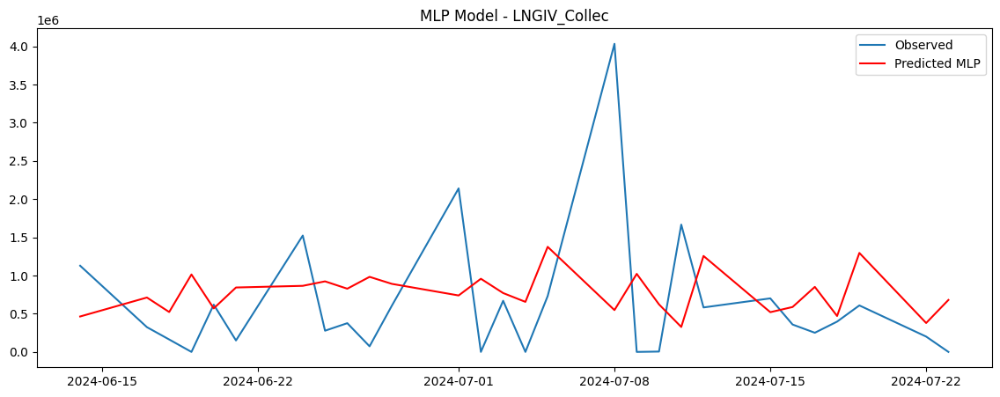

Training LSTM model for LNGIV_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
RMSE for LNGIV_Collec using LSTM: 8110877074172.023


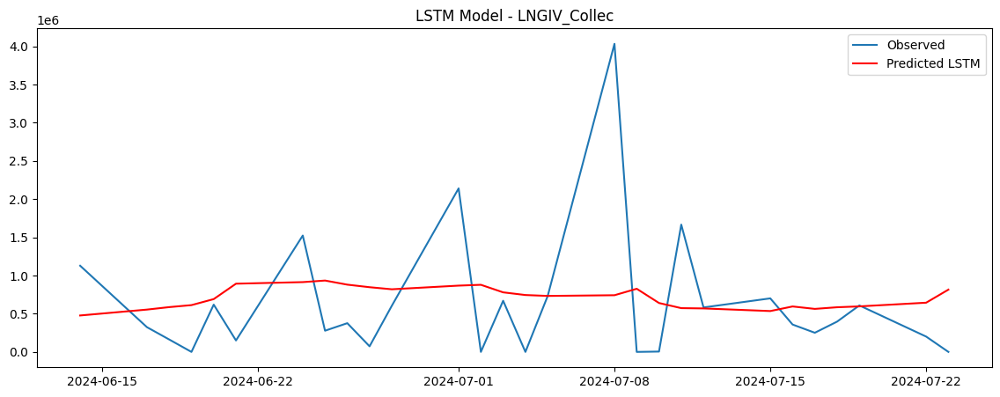

Training CNN model for LNGIV_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
RMSE for LNGIV_Collec using CNN: 6.2620696705106035e+19


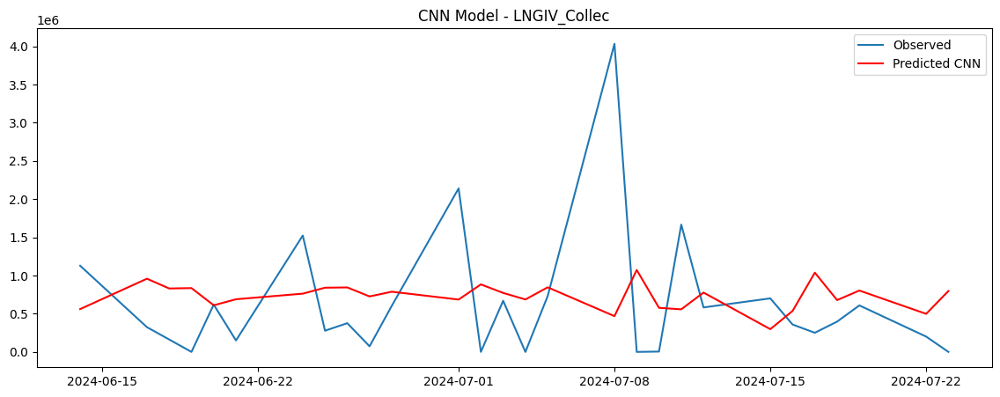

Training GRU model for LNGIV_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
RMSE for LNGIV_Collec using GRU: 4.834682382116641e+26


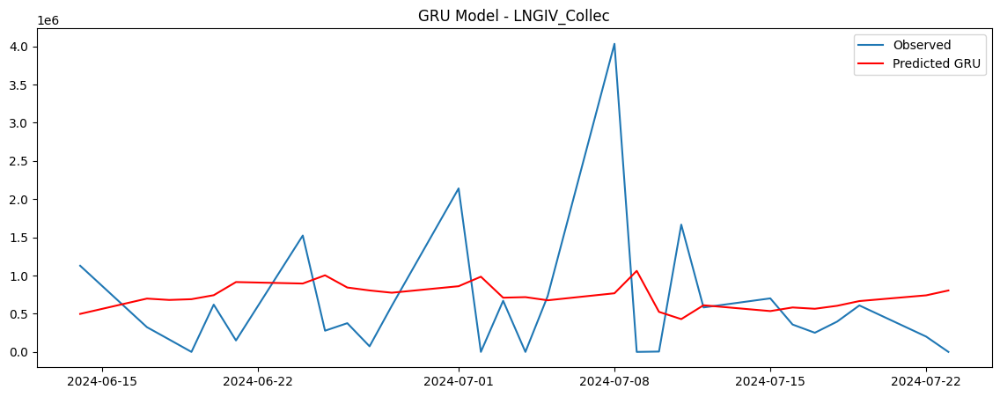

Processing series: LNGSI_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNGSI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
RMSE for LNGSI_Collec using MLP: 5904809.574707924


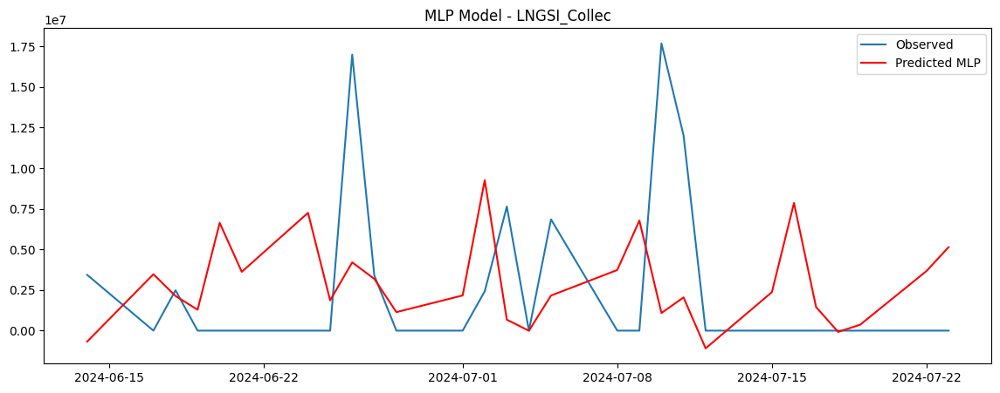

Training LSTM model for LNGSI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
RMSE for LNGSI_Collec using LSTM: 153641244771101.94


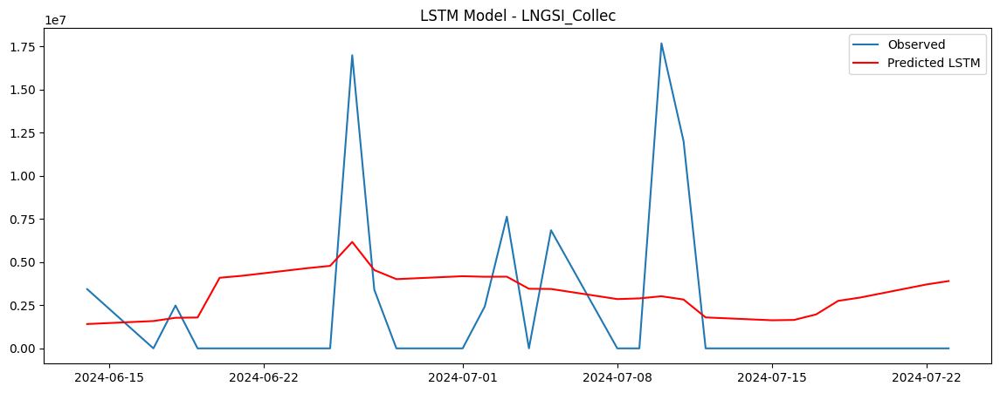

Training CNN model for LNGSI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
RMSE for LNGSI_Collec using CNN: 4.195307737820228e+21


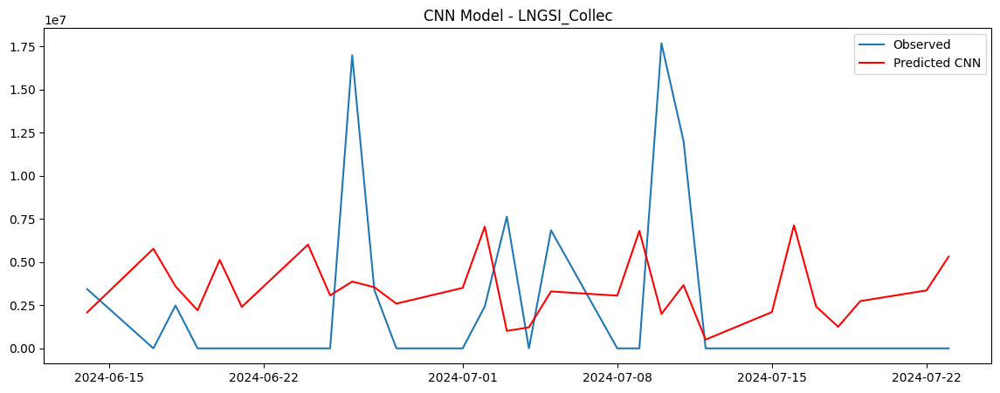

Training GRU model for LNGSI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
RMSE for LNGSI_Collec using GRU: 1.1455652312602783e+29


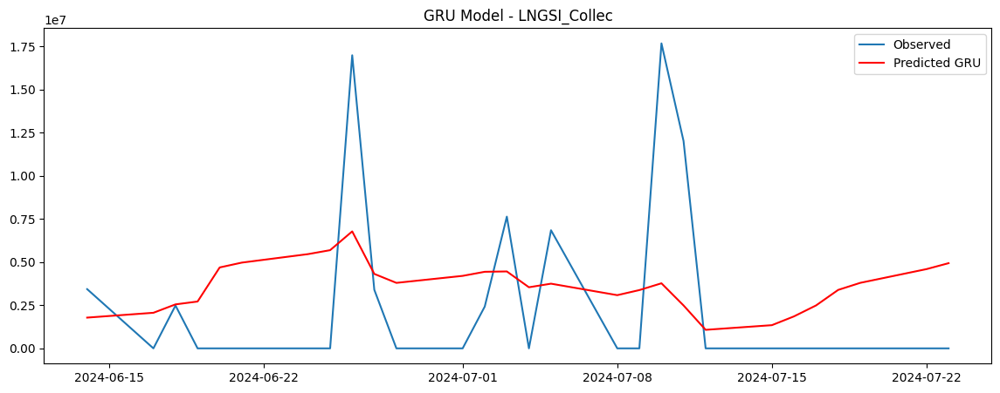

Processing series: LNIGT_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNIGT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNIGT_Collec using MLP: 0.0


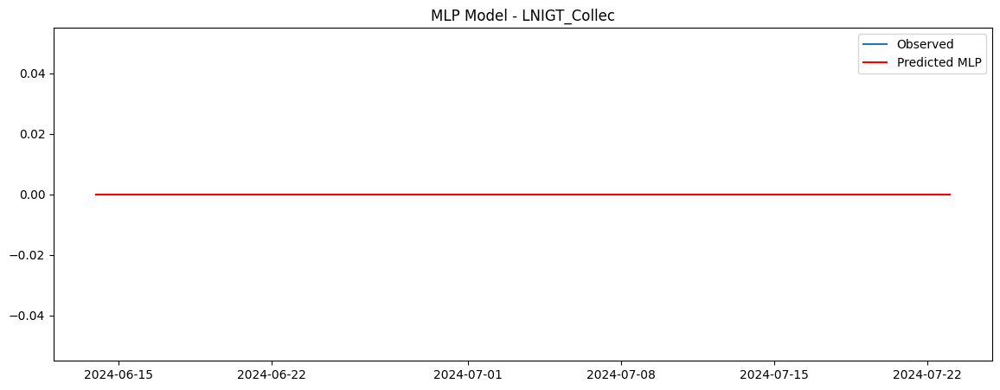

Training LSTM model for LNIGT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
RMSE for LNIGT_Collec using LSTM: 0.0


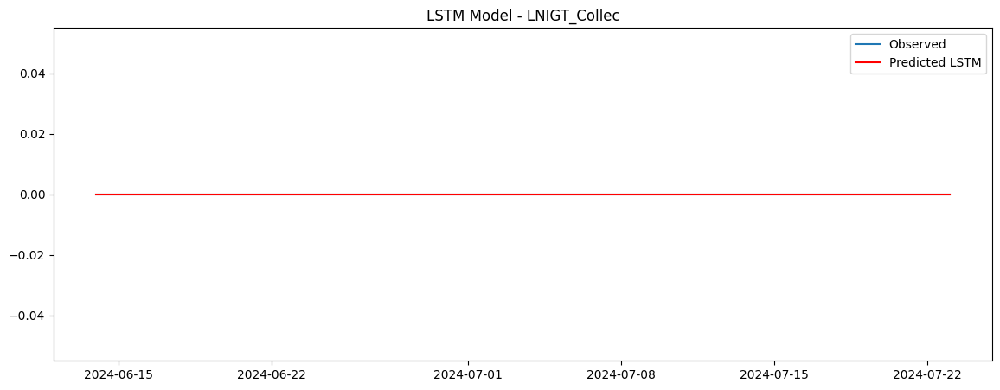

Training CNN model for LNIGT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
RMSE for LNIGT_Collec using CNN: 0.0


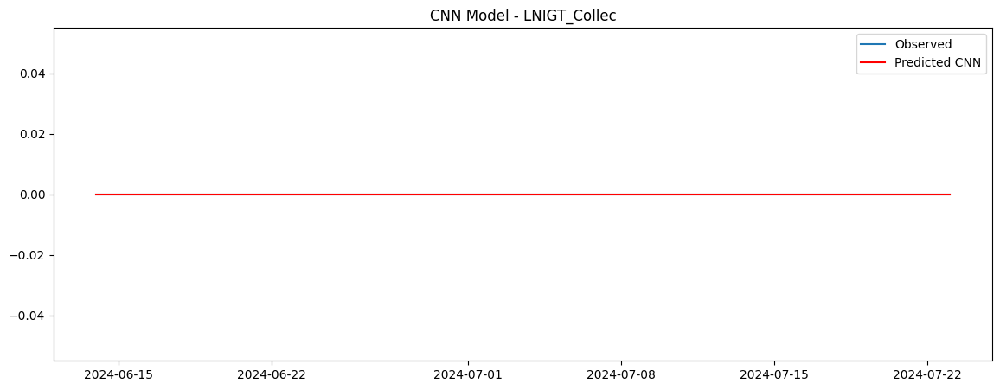

Training GRU model for LNIGT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
RMSE for LNIGT_Collec using GRU: 0.0


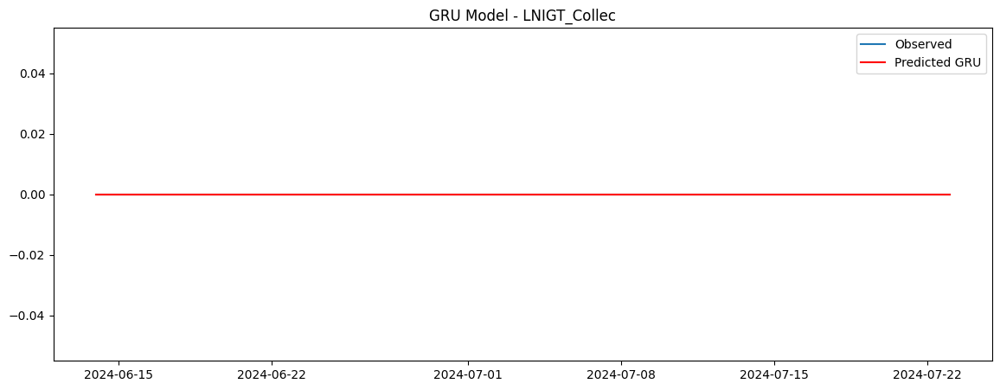

Processing series: LNHET_Collec
Training MLP model for LNHET_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNHET_Collec using MLP: 61512.07352915939


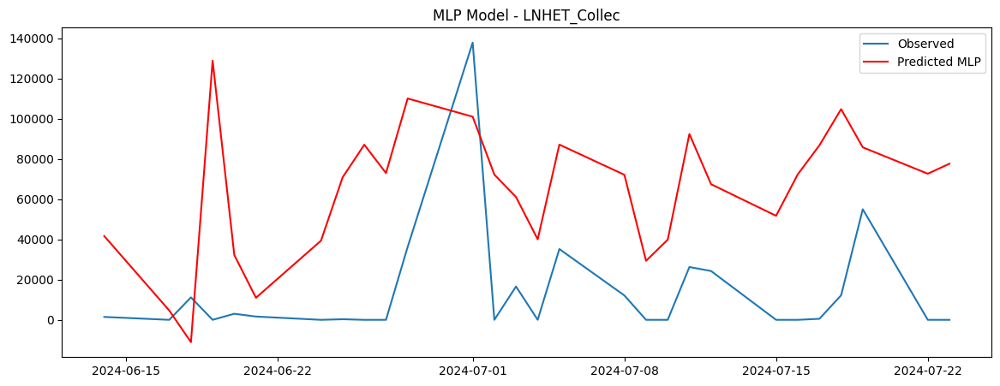

Training LSTM model for LNHET_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
RMSE for LNHET_Collec using LSTM: 18543919215.2855


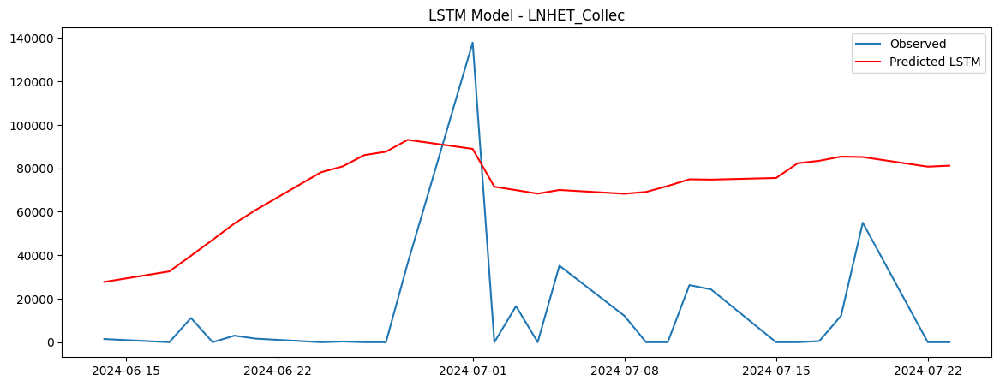

Training CNN model for LNHET_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
RMSE for LNHET_Collec using CNN: 1.1160510070471334e+16


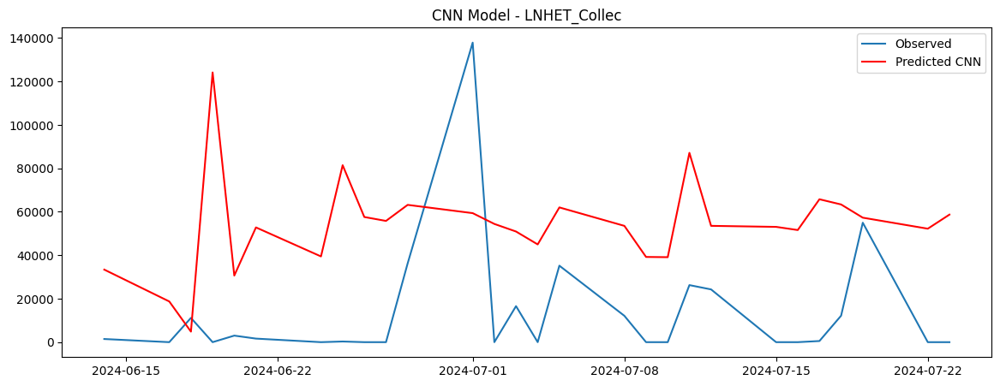

Training GRU model for LNHET_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
RMSE for LNHET_Collec using GRU: 6.716851313681785e+21


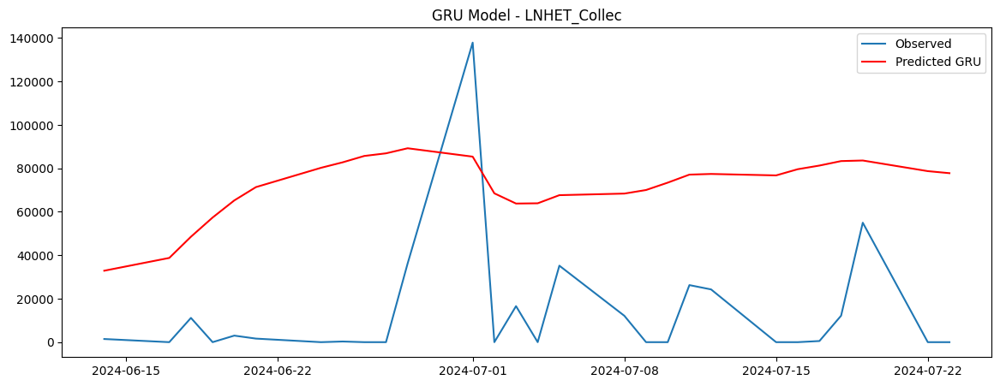

Processing series: LNHEC_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNHEC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNHEC_Collec using MLP: 49444.45509625578


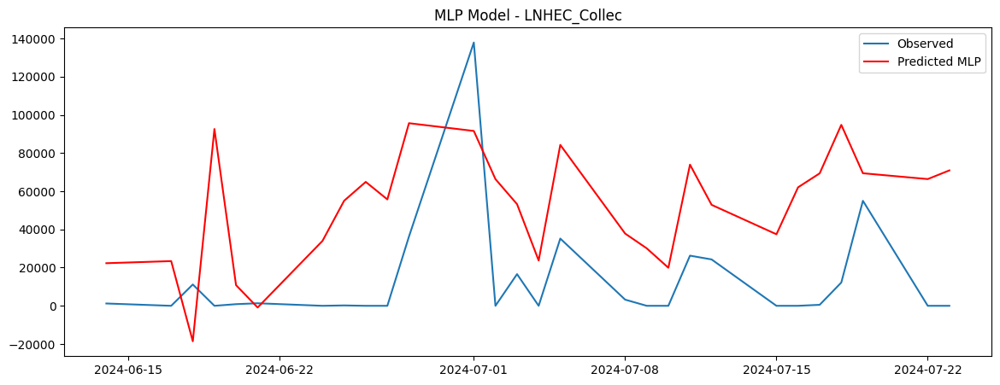

Training LSTM model for LNHEC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
RMSE for LNHEC_Collec using LSTM: 18492755184.1449


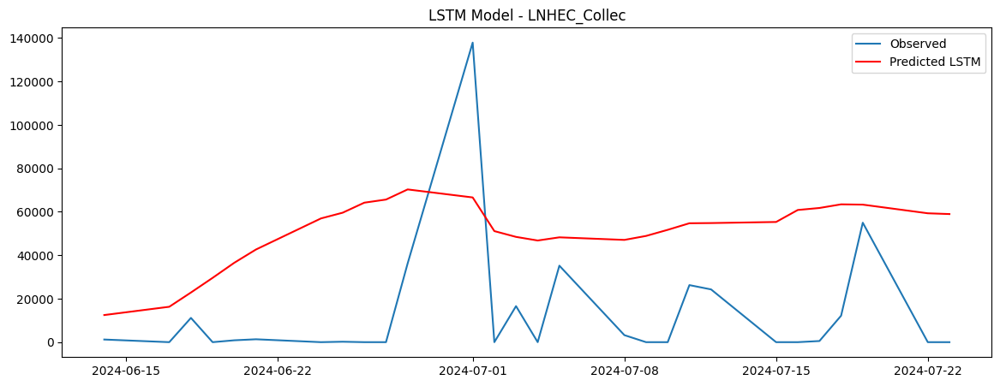

Training CNN model for LNHEC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNHEC_Collec using CNN: 1.1129711500387338e+16


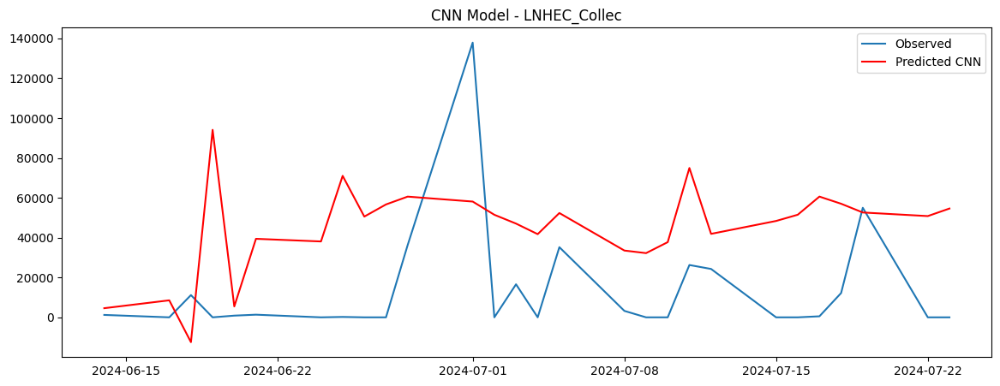

Training GRU model for LNHEC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
RMSE for LNHEC_Collec using GRU: 6.698315474849983e+21


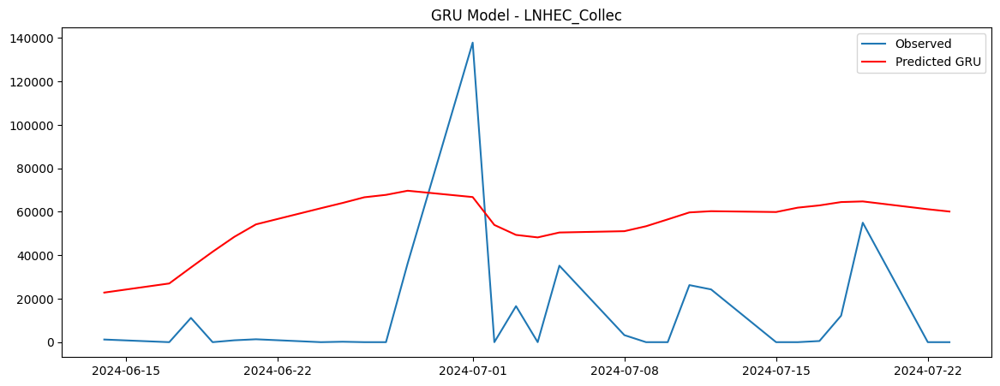

Processing series: LNHEP_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNHEP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
RMSE for LNHEP_Collec using MLP: 5974.67592455968


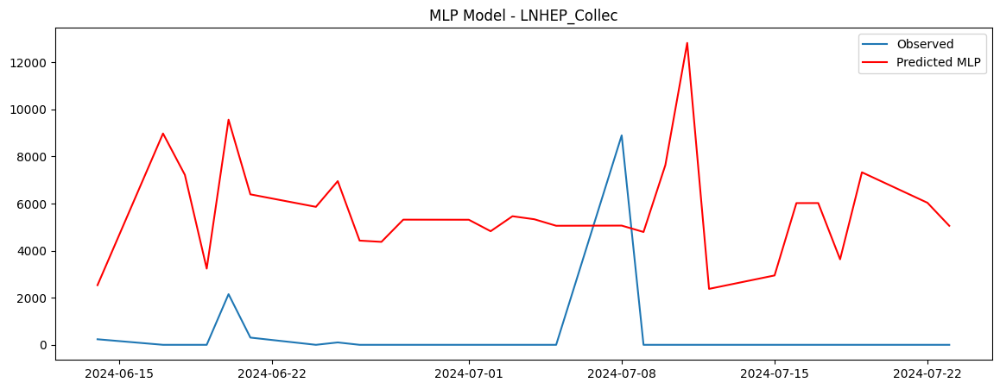

Training LSTM model for LNHEP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
RMSE for LNHEP_Collec using LSTM: 206622557.50616494


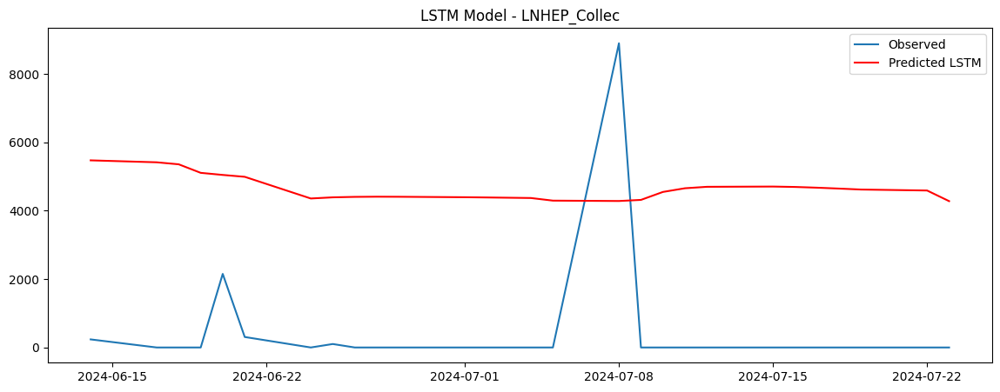

Training CNN model for LNHEP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNHEP_Collec using CNN: 24665074453132.266


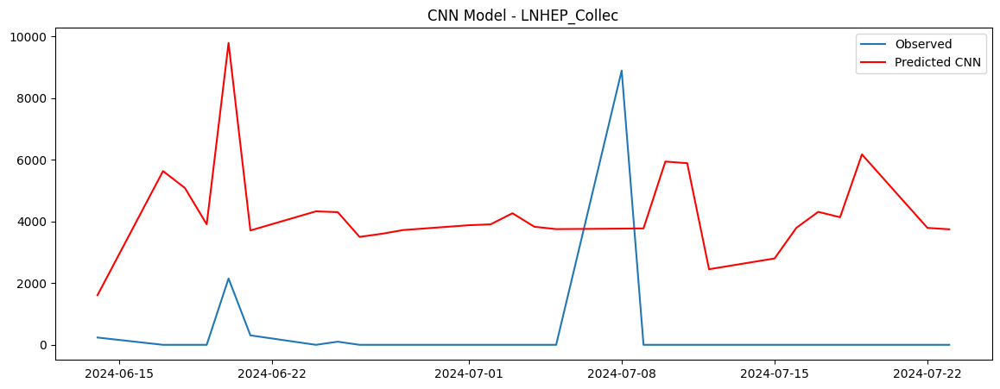

Training GRU model for LNHEP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
RMSE for LNHEP_Collec using GRU: 2.944319021107776e+18


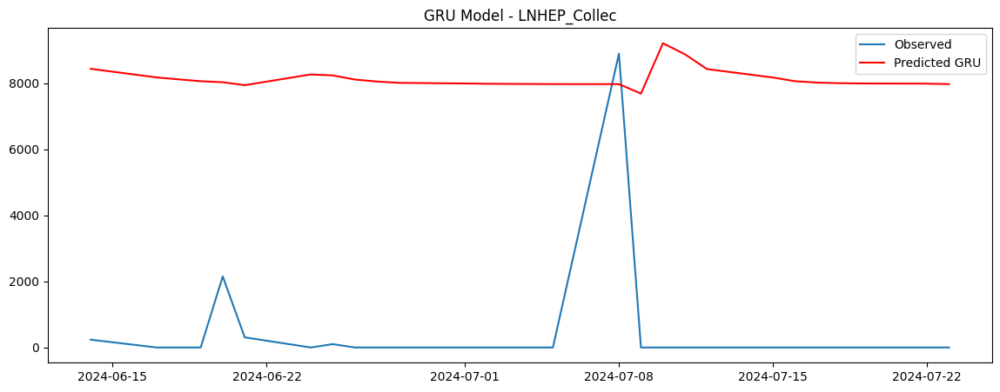

Processing series: LNHER_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNHER_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
RMSE for LNHER_Collec using MLP: 3118068.728847826


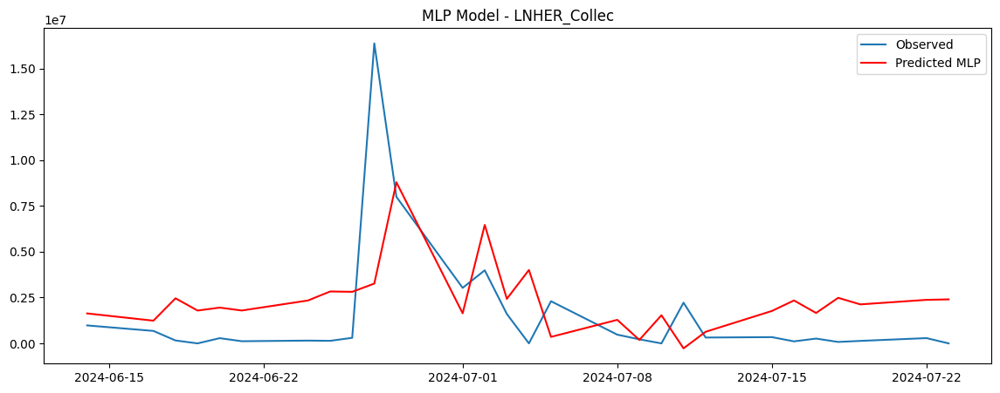

Training LSTM model for LNHER_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
RMSE for LNHER_Collec using LSTM: 59656717952841.05


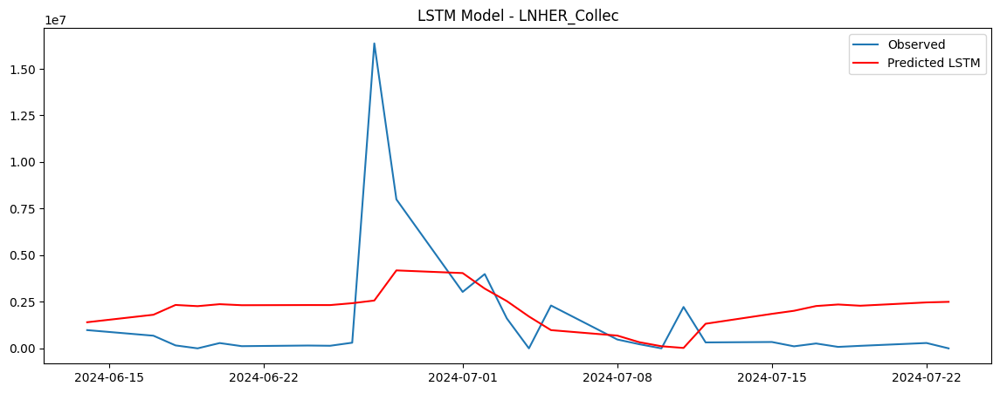

Training CNN model for LNHER_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
RMSE for LNHER_Collec using CNN: 9.763595104259366e+20


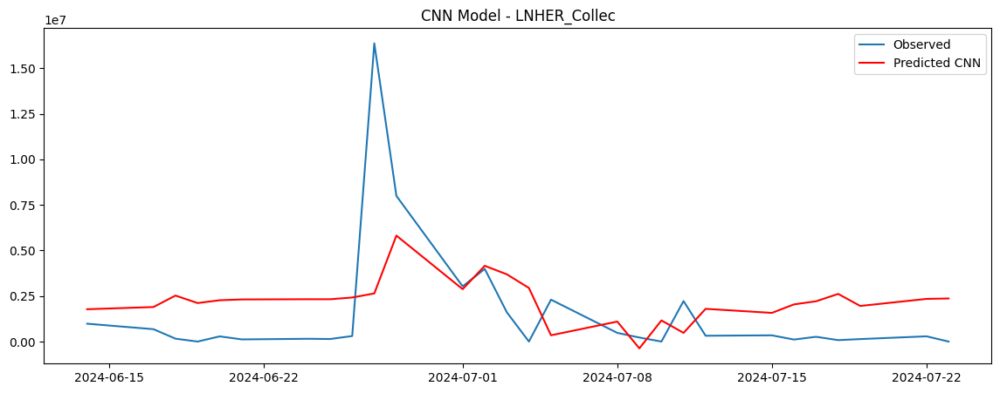

Training GRU model for LNHER_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
RMSE for LNHER_Collec using GRU: 1.5979388545010489e+28


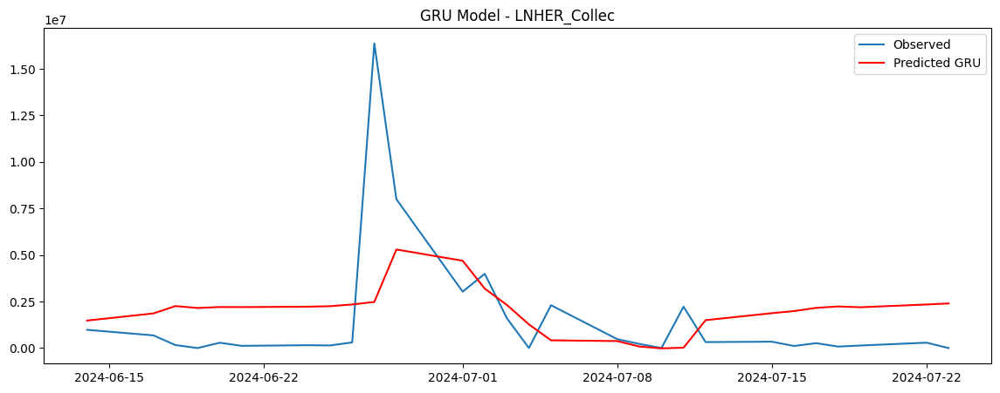

Processing series: LNLOA_Collec
Training MLP model for LNLOA_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNLOA_Collec using MLP: 0.0


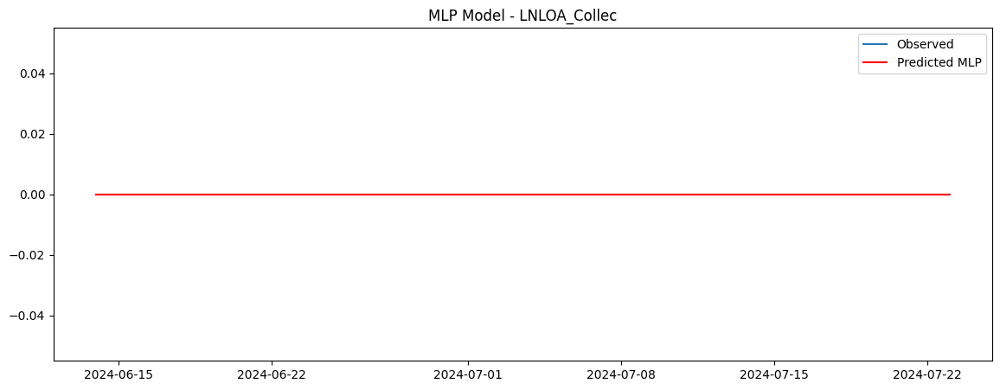

Training LSTM model for LNLOA_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
RMSE for LNLOA_Collec using LSTM: 0.0


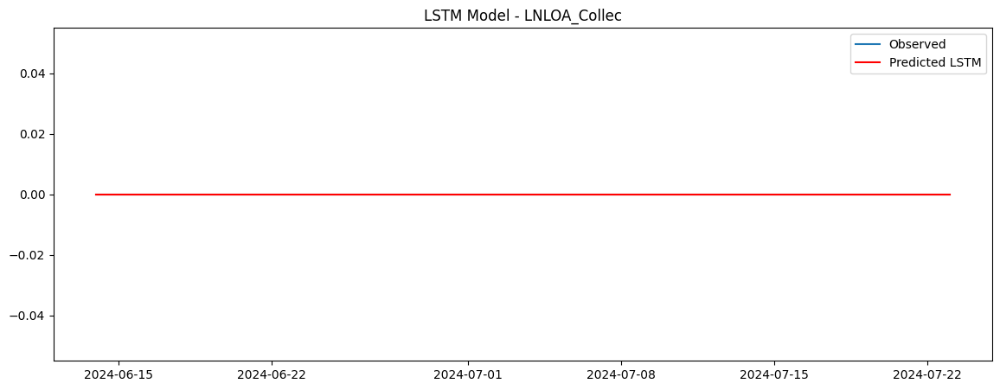

Training CNN model for LNLOA_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
RMSE for LNLOA_Collec using CNN: 0.0


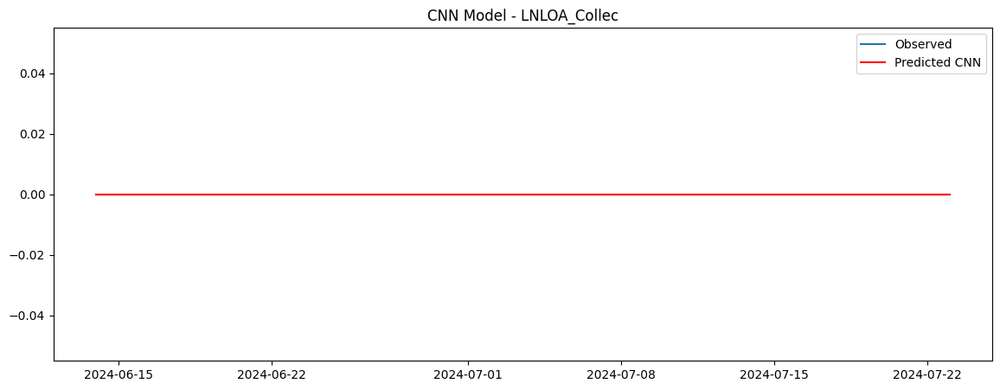

Training GRU model for LNLOA_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
RMSE for LNLOA_Collec using GRU: 0.0


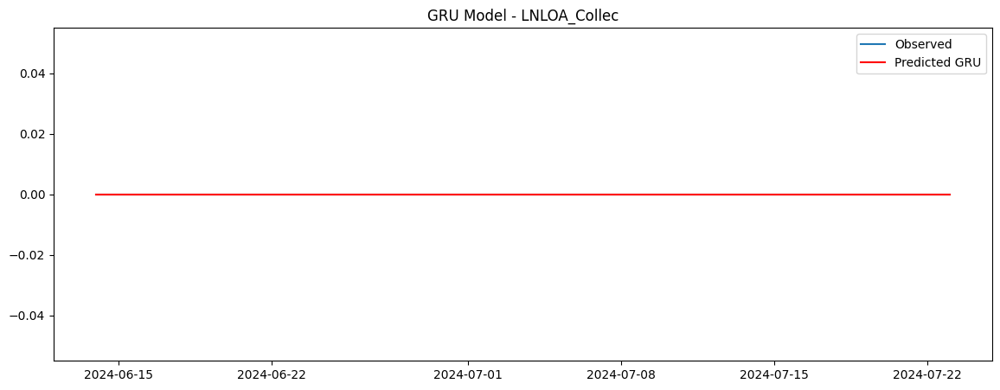

Processing series: LNTI2_Collec
Training MLP model for LNTI2_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNTI2_Collec using MLP: 0.0


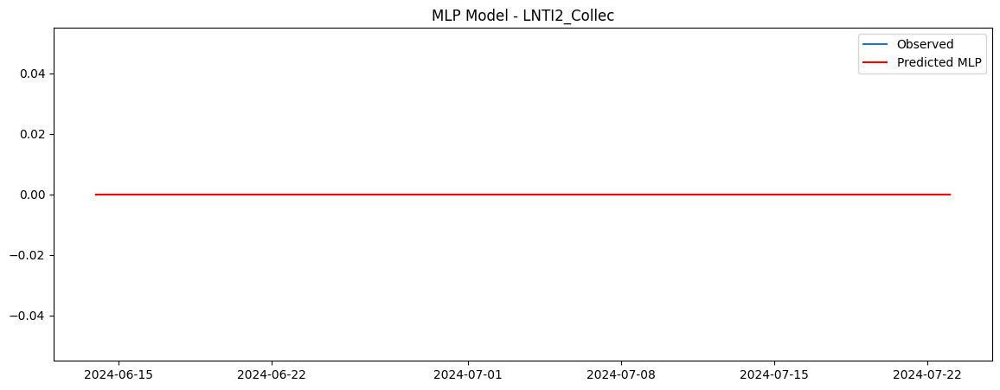

Training LSTM model for LNTI2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
RMSE for LNTI2_Collec using LSTM: 0.0


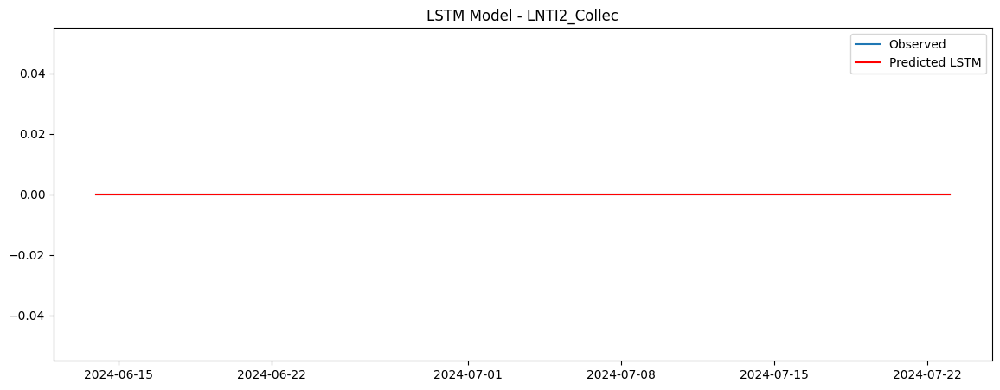

Training CNN model for LNTI2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
RMSE for LNTI2_Collec using CNN: 0.0


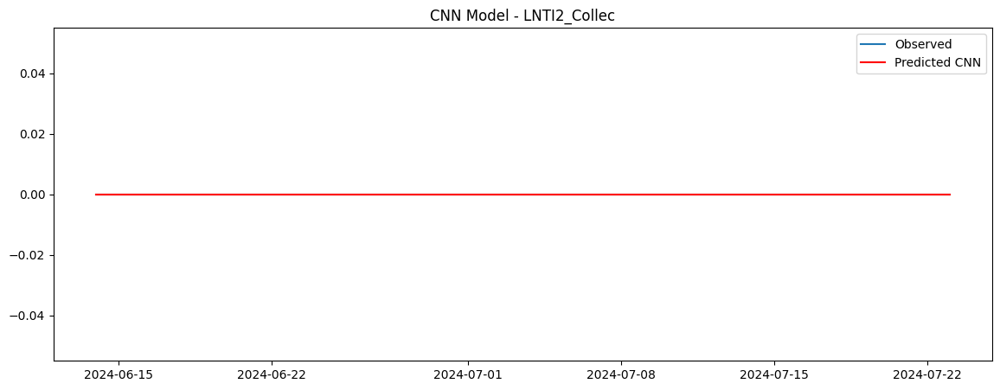

Training GRU model for LNTI2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
RMSE for LNTI2_Collec using GRU: 0.0


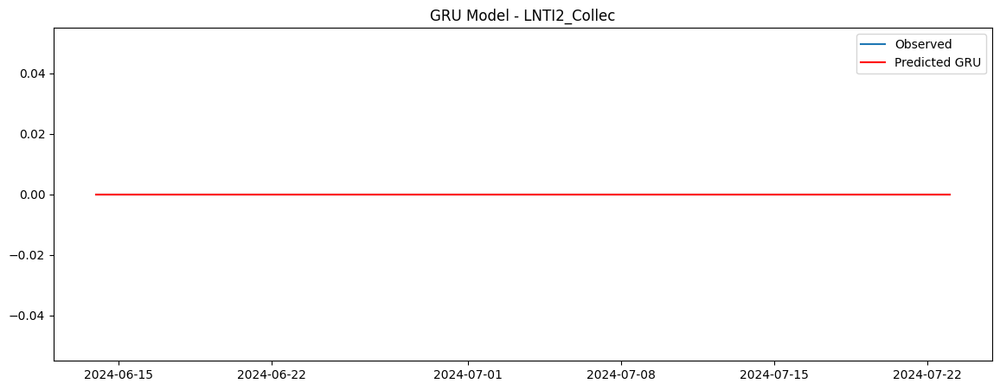

Processing series: LNT2N_Collec
Training MLP model for LNT2N_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
RMSE for LNT2N_Collec using MLP: 49503679.339286394


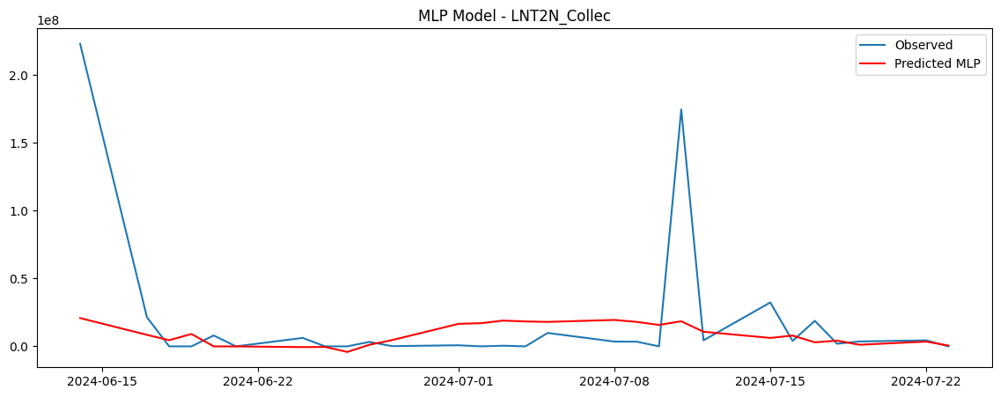

Training LSTM model for LNT2N_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
RMSE for LNT2N_Collec using LSTM: 1.3882169255358878e+16


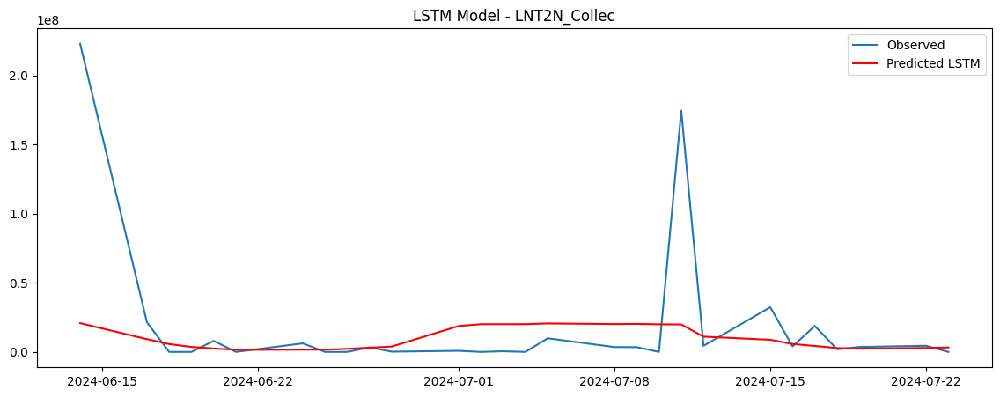

Training CNN model for LNT2N_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
RMSE for LNT2N_Collec using CNN: 3.554221634208649e+24


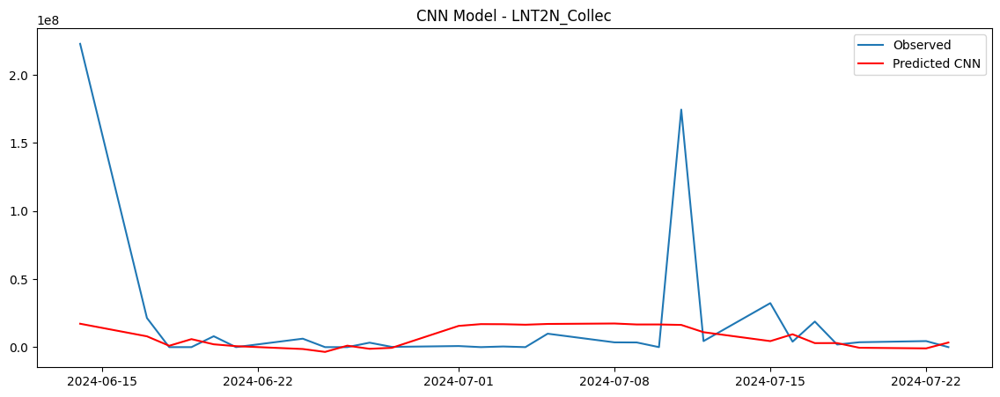

Training GRU model for LNT2N_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
RMSE for LNT2N_Collec using GRU: 9.09979642749096e+32


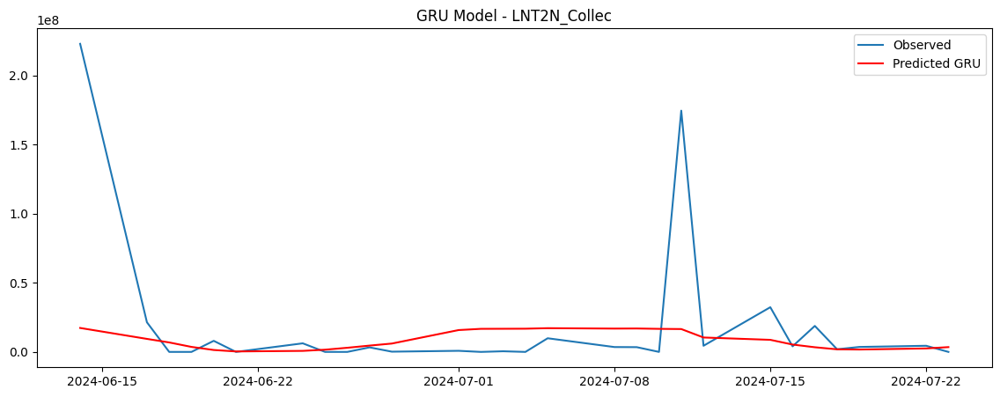

Processing series: LNT2E_Collec
Training MLP model for LNT2E_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNT2E_Collec using MLP: 0.0


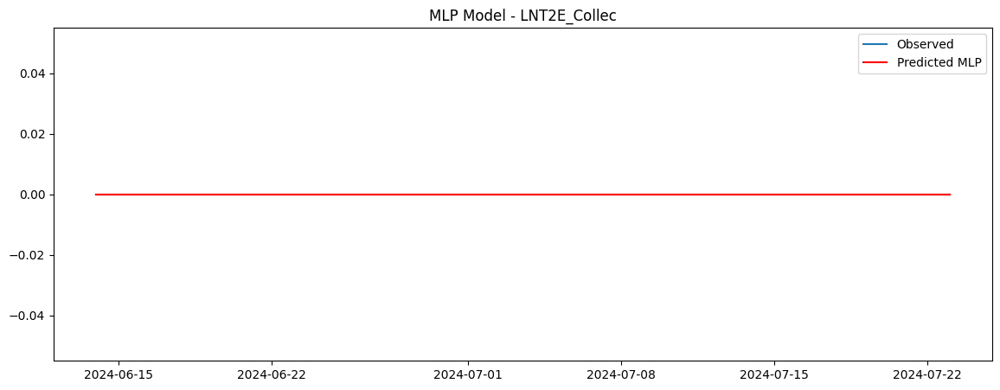

Training LSTM model for LNT2E_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
RMSE for LNT2E_Collec using LSTM: 0.0


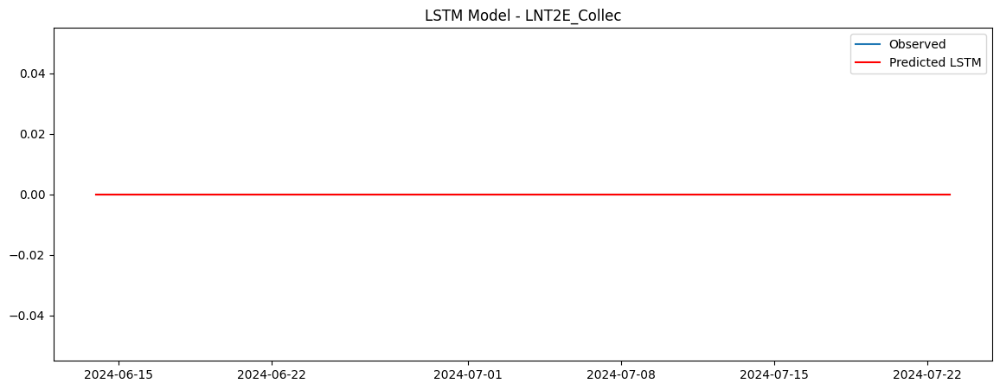

Training CNN model for LNT2E_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
RMSE for LNT2E_Collec using CNN: 0.0


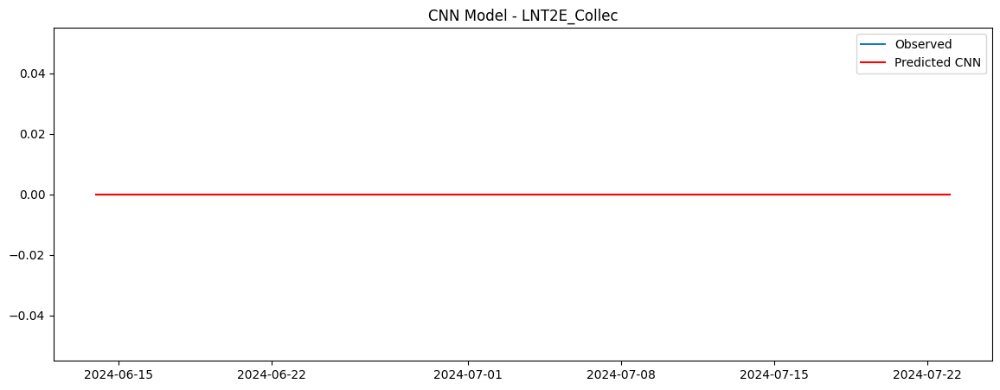

Training GRU model for LNT2E_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
RMSE for LNT2E_Collec using GRU: 0.0


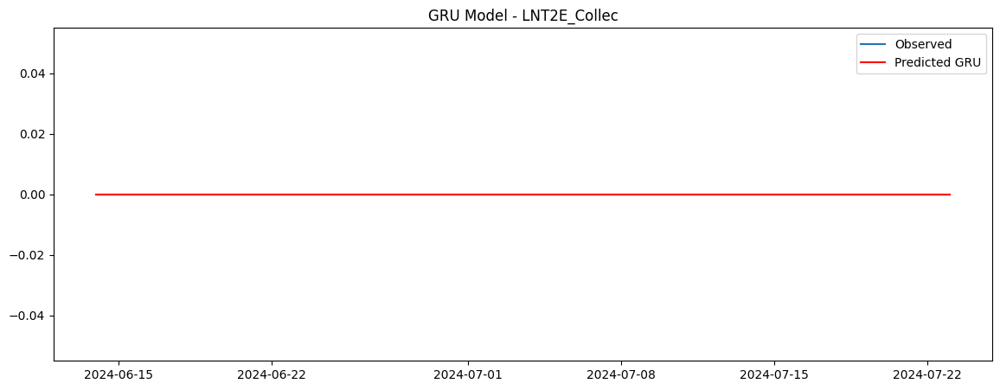

Processing series: LNTI3_Collec
Training MLP model for LNTI3_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
RMSE for LNTI3_Collec using MLP: 10879059.360548686


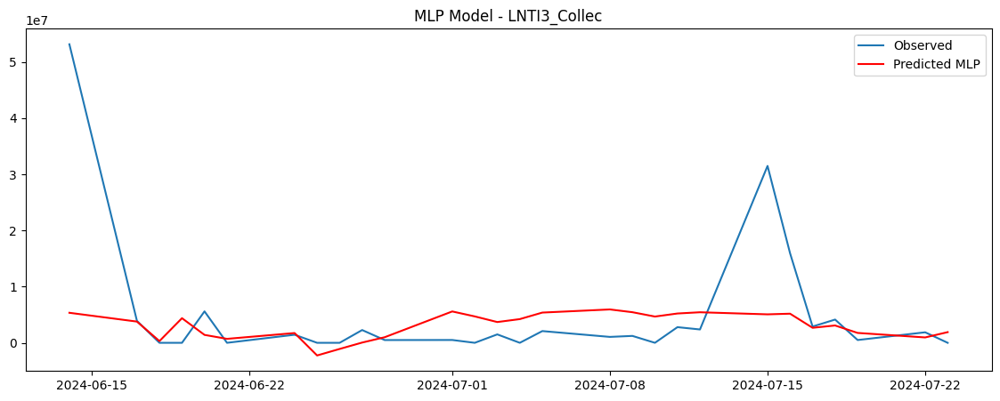

Training LSTM model for LNTI3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
RMSE for LNTI3_Collec using LSTM: 749282157063091.5


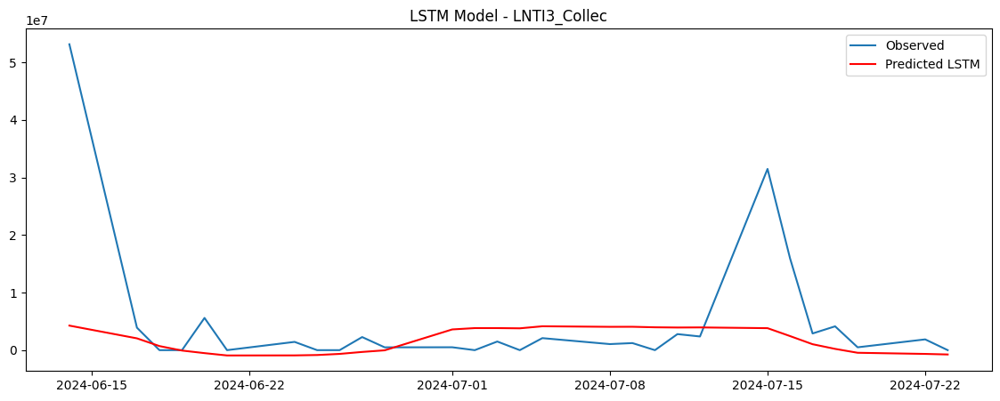

Training CNN model for LNTI3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
RMSE for LNTI3_Collec using CNN: 4.597744208196681e+22


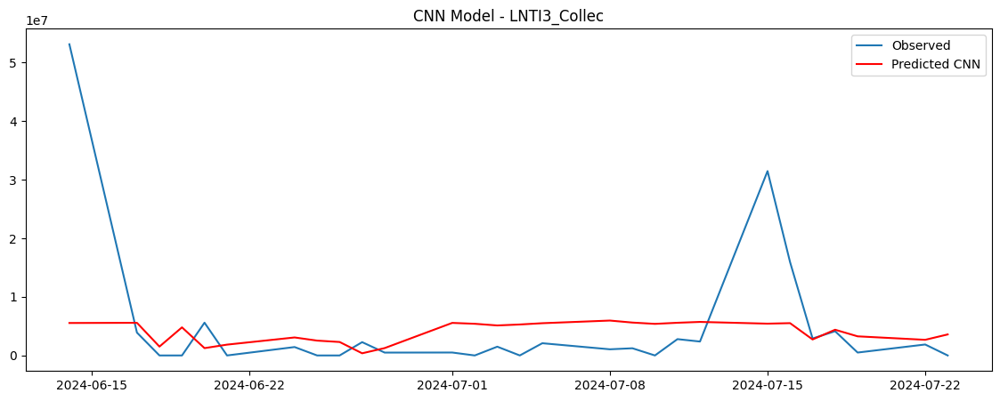

Training GRU model for LNTI3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
RMSE for LNTI3_Collec using GRU: 2.821267204706223e+30


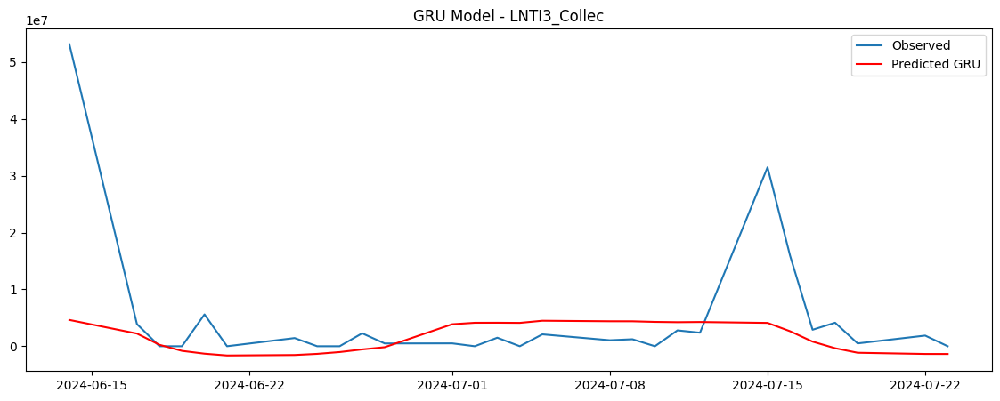

Processing series: LNTIC_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNTIC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNTIC_Collec using MLP: 2280814.14097118


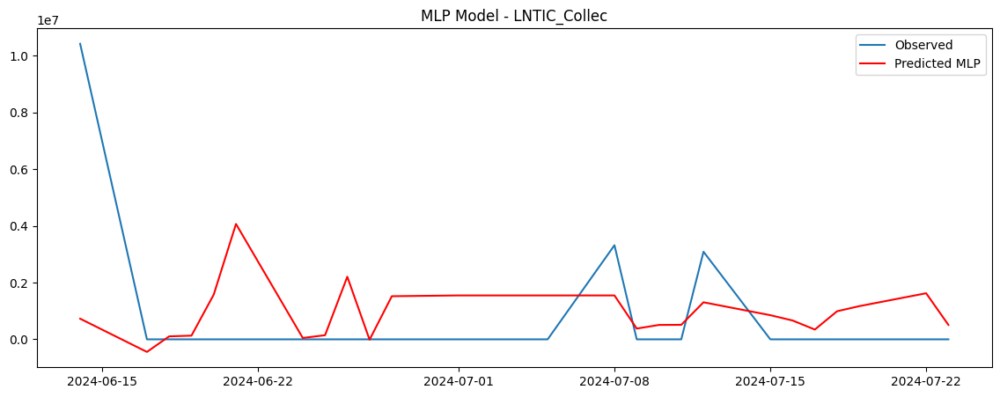

Training LSTM model for LNTIC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
RMSE for LNTIC_Collec using LSTM: 26762210074466.5


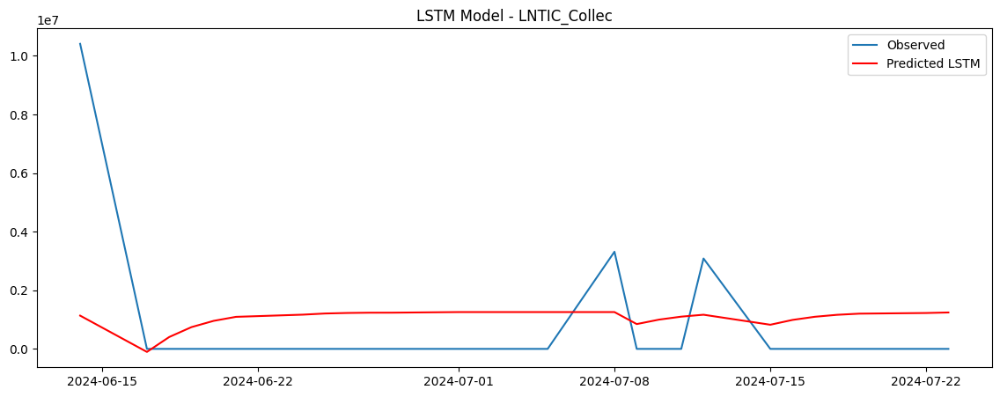

Training CNN model for LNTIC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
RMSE for LNTIC_Collec using CNN: 3.337757213503835e+20


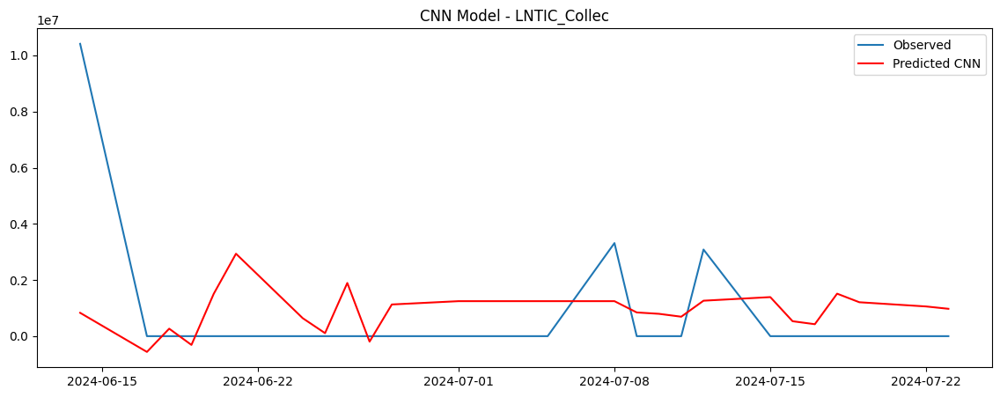

Training GRU model for LNTIC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
RMSE for LNTIC_Collec using GRU: 4.162818784252551e+27


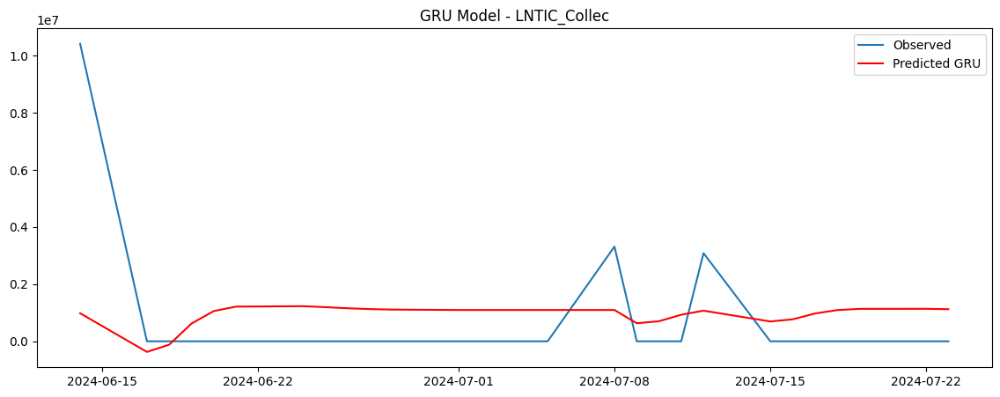


Comparison of RMSE across different models and series:

                           RMSE
LNACT_Collec MLP   4.070134e+06
             LSTM  9.357518e+13
             CNN   2.035369e+21
             GRU   4.427164e+28
LNAAE_Collec MLP   9.646465e+05
...                         ...
LNTI3_Collec GRU   2.821267e+30
LNTIC_Collec MLP   2.280814e+06
             LSTM  2.676221e+13
             CNN   3.337757e+20
             GRU   4.162819e+27

[140 rows x 1 columns]


In [60]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Conv1D, Flatten, GRU

# Define the look-back period
look_back = 10

# Function to create the dataset with look-back
def create_dataset(series, look_back=1):
    X, Y = [], []
    for i in range(len(series) - look_back):
        X.append(series[i:(i + look_back)])
        Y.append(series[i + look_back])
    return np.array(X), np.array(Y)

# Initialize MinMaxScaler to normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))

# Store RMSE results
rmse_results = {}

# Iterate over each series in the data_series_it DataFrame
for series_name in data_series_it.columns:
    print(f"Processing series: {series_name}")

    # Define the series to be processed
    series = data_series_it[series_name].dropna()

    # Normalize the series
    series_scaled = scaler.fit_transform(series.values.reshape(-1, 1))

    # Create the dataset
    X, y = create_dataset(series_scaled, look_back)

    # Reshape input for LSTM, CNN, and GRU
    X_reshaped = X.reshape(X.shape[0], X.shape[1], 1)

    # Split into train and test sets (70% train, 30% test)
    train_size = int(len(X) * 0.7)
    X_train, X_test = X[:train_size], X[train_size:]
    X_train_reshaped, X_test_reshaped = X_reshaped[:train_size], X_reshaped[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Models Dictionary
    models = {}

    # Simple Feedforward Neural Network (MLP)
    model_mlp = Sequential([
        Dense(100, activation='relu', input_shape=(look_back,)),
        Dropout(0.2),
        Dense(50, activation='relu'),
        Dense(1)
    ])
    models['MLP'] = model_mlp

    # LSTM Model
    model_lstm = Sequential([
        LSTM(100, input_shape=(look_back, 1)),
        Dropout(0.2),
        Dense(1)
    ])
    models['LSTM'] = model_lstm

    # CNN Model
    model_cnn = Sequential([
        Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(look_back, 1)),
        Dropout(0.2),
        Flatten(),
        Dense(1)
    ])
    models['CNN'] = model_cnn

    # GRU Model
    model_gru = Sequential([
        GRU(100, input_shape=(look_back, 1)),
        Dropout(0.2),
        Dense(1)
    ])
    models['GRU'] = model_gru

    # Compile, train, and evaluate each model
    for model_name, model in models.items():
        print(f"Training {model_name} model for {series_name}...")
        model.compile(optimizer='adam', loss='mean_squared_error')

        if model_name == 'MLP':
            model.fit(X_train, y_train, epochs=20, batch_size=10, verbose=0)
            predictions = model.predict(X_test)
        else:
            model.fit(X_train_reshaped, y_train, epochs=20, batch_size=10, verbose=0)
            predictions = model.predict(X_test_reshaped)

        # Inverse transform predictions and y_test
        predictions = scaler.inverse_transform(predictions)
        y_test = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Calculate RMSE
        rmse = np.sqrt(mean_squared_error(y_test, predictions))
        print(f'RMSE for {series_name} using {model_name}: {rmse}')
        rmse_results[(series_name, model_name)] = rmse

        # Plot results
        plt.figure(figsize=(14, 5))
        plt.plot(series.iloc[train_size + look_back:], label='Observed')
        plt.plot(series.index[train_size + look_back:], predictions, color='red', label=f'Predicted {model_name}')
        plt.title(f'{model_name} Model - {series_name}')
        plt.legend()
        plt.show()

# Compare RMSE results across models and series
rmse_df = pd.DataFrame(rmse_results, index=['RMSE']).T
print("\nComparison of RMSE across different models and series:\n")
print(rmse_df)


Processing series: LNACT_Collec
Training MLP model for LNACT_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNACT_Collec using MLP: 3951262.2631004867


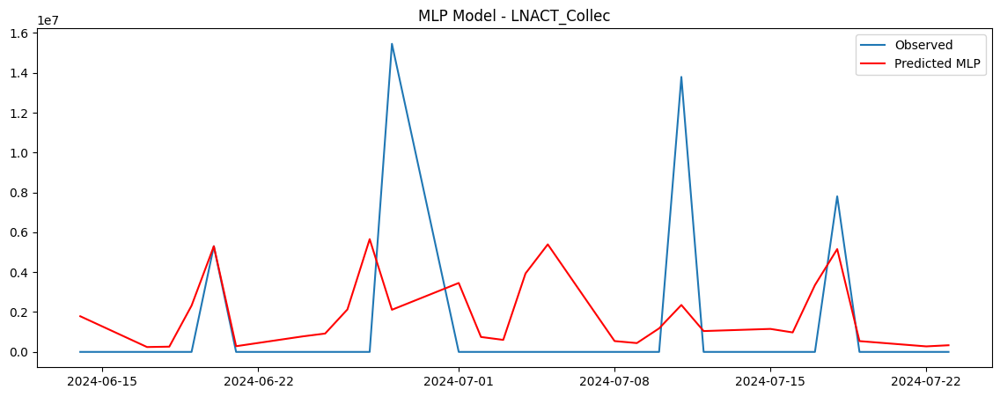

Training LSTM model for LNACT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
RMSE for LNACT_Collec using LSTM: 93575174913339.67


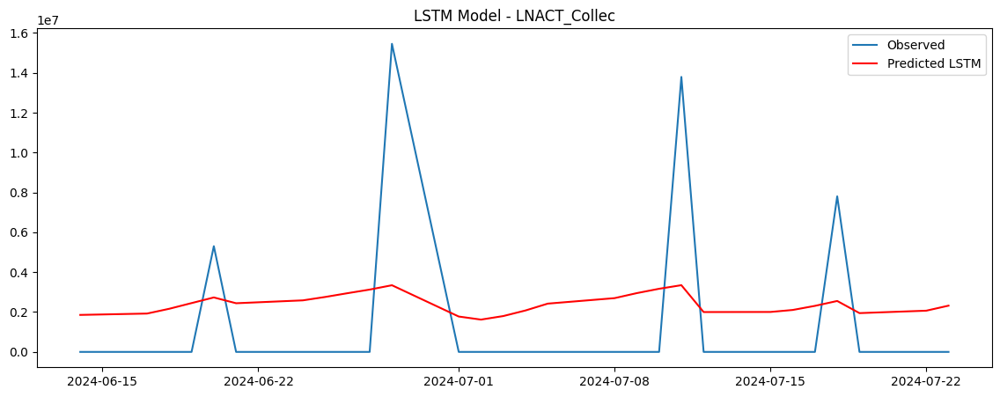

Training CNN model for LNACT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNACT_Collec using CNN: 2.0353688313253452e+21


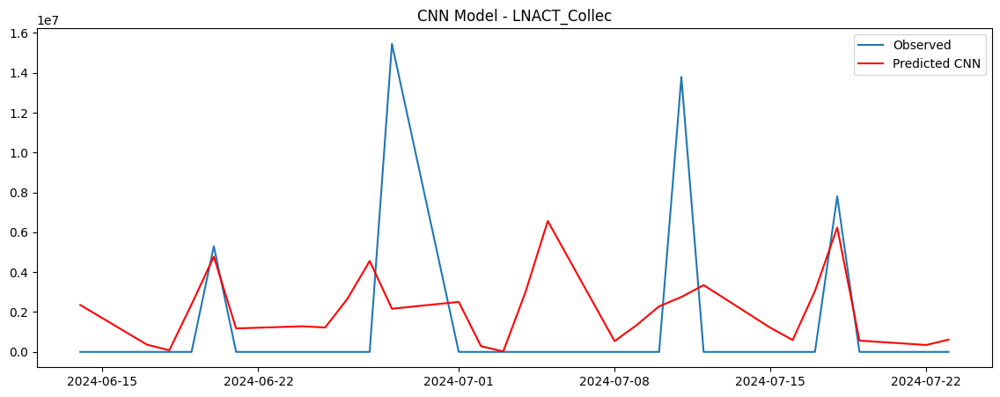

Training GRU model for LNACT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
RMSE for LNACT_Collec using GRU: 4.427163758698206e+28


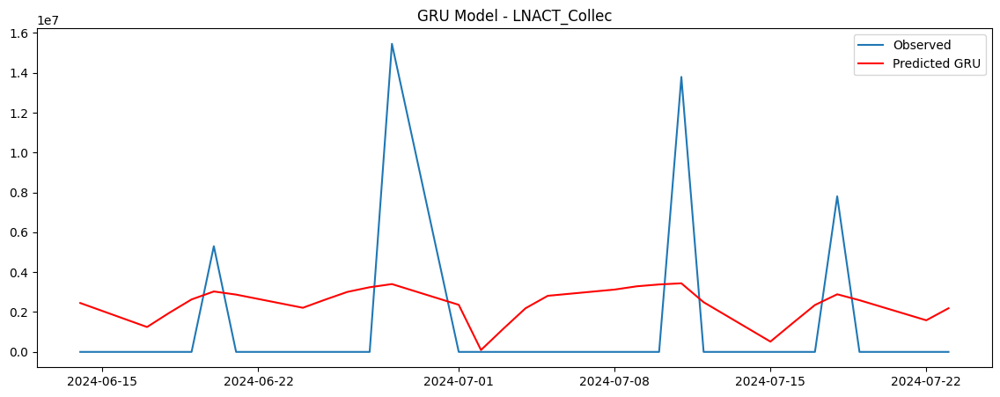

Processing series: LNAAE_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNAAE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNAAE_Collec using MLP: 910355.4649113066


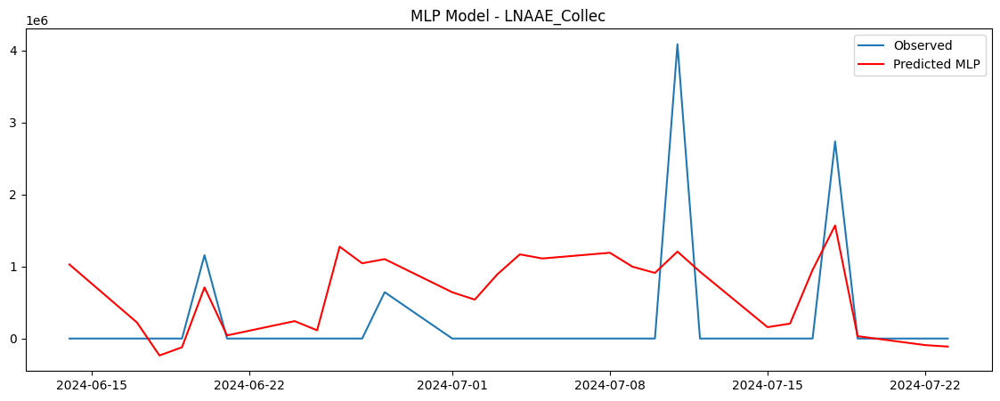

Training LSTM model for LNAAE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
RMSE for LNAAE_Collec using LSTM: 7213696917255.4795


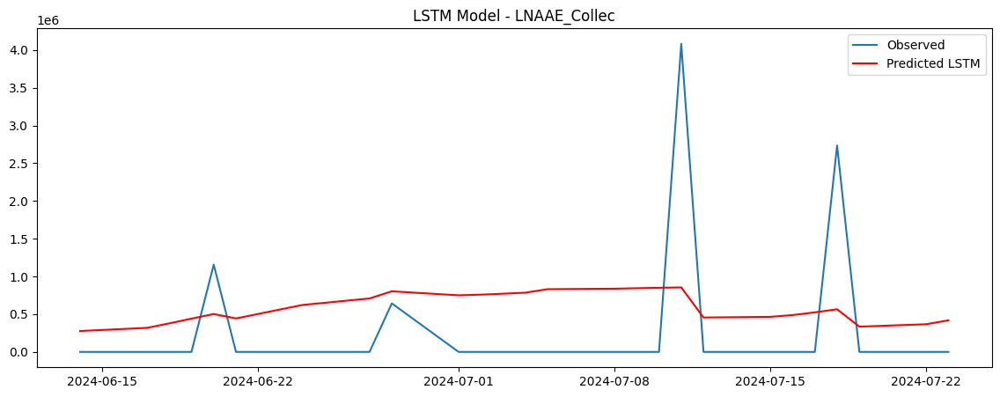

Training CNN model for LNAAE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
RMSE for LNAAE_Collec using CNN: 5.4100400944207176e+19


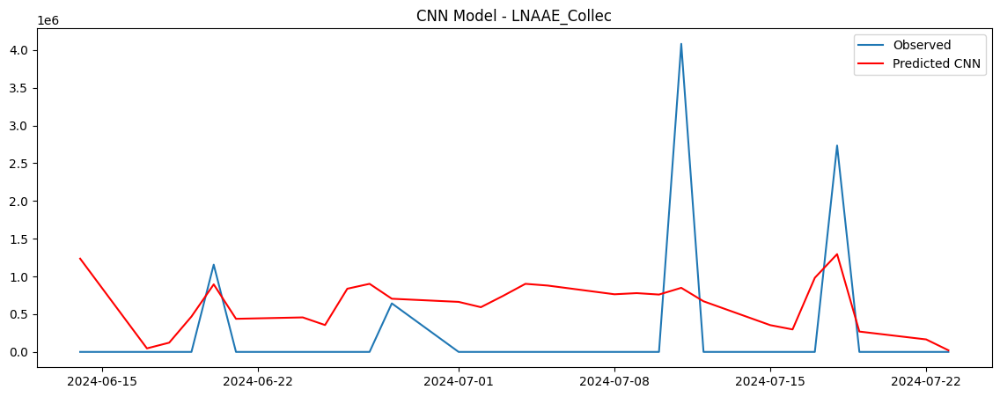

Training GRU model for LNAAE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
RMSE for LNAAE_Collec using GRU: 4.057355505051835e+26


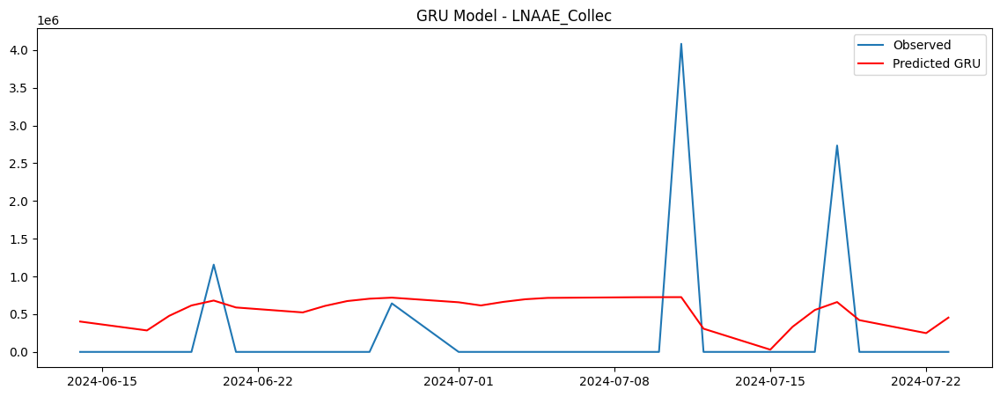

Processing series: LNATO_Collec
Training MLP model for LNATO_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNATO_Collec using MLP: 3268088.0320118903


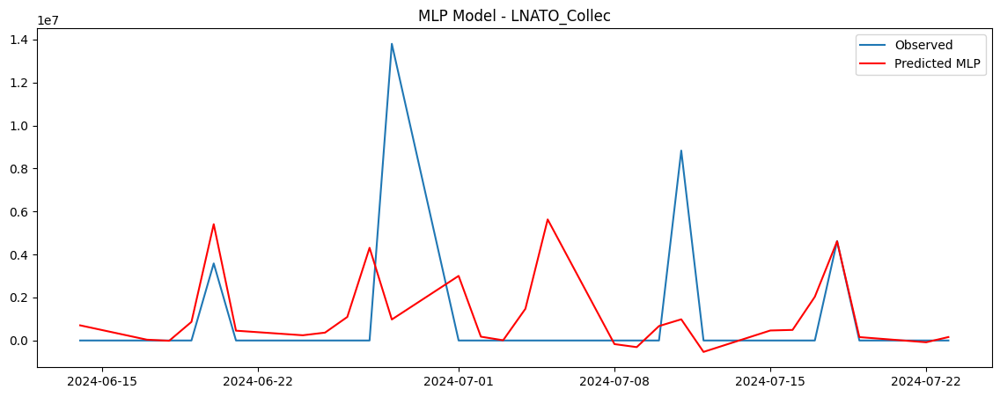

Training LSTM model for LNATO_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
RMSE for LNATO_Collec using LSTM: 49185396721791.19


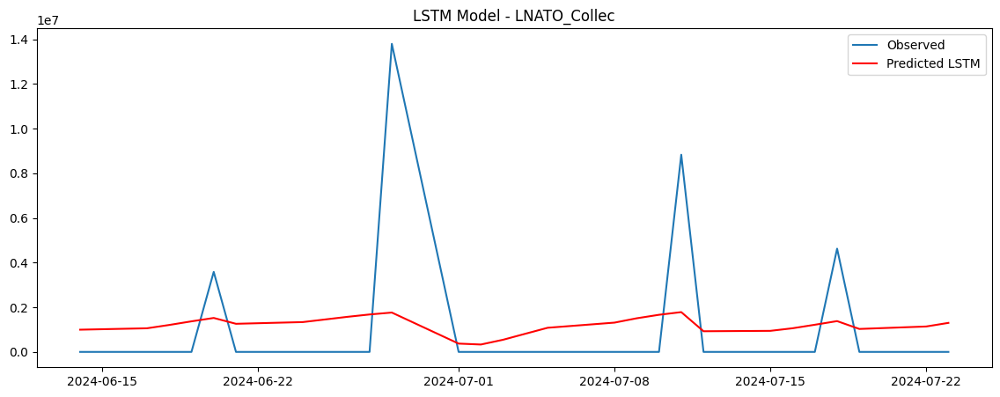

Training CNN model for LNATO_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
RMSE for LNATO_Collec using CNN: 7.359996673273199e+20


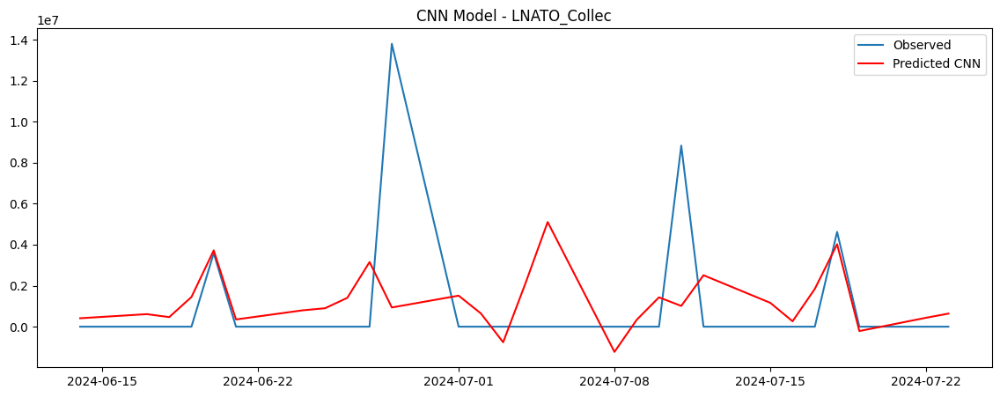

Training GRU model for LNATO_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
RMSE for LNATO_Collec using GRU: 1.101334014163784e+28


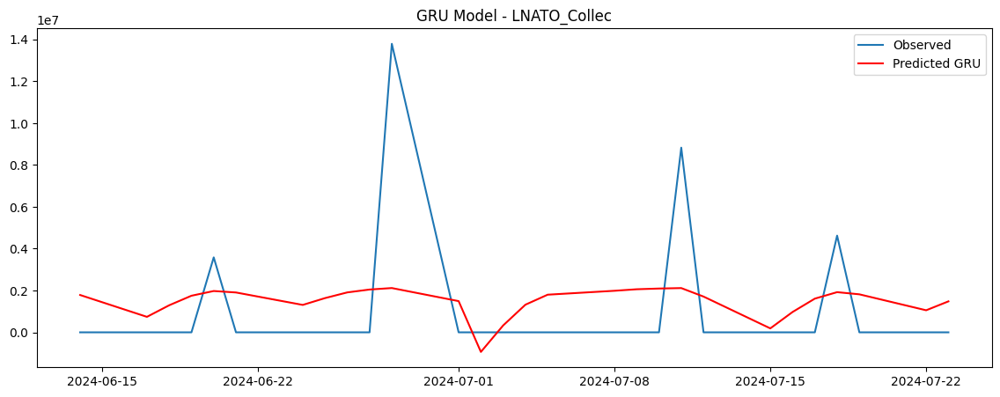

Processing series: LNAT2_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNAT2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
RMSE for LNAT2_Collec using MLP: 291511.4937387136


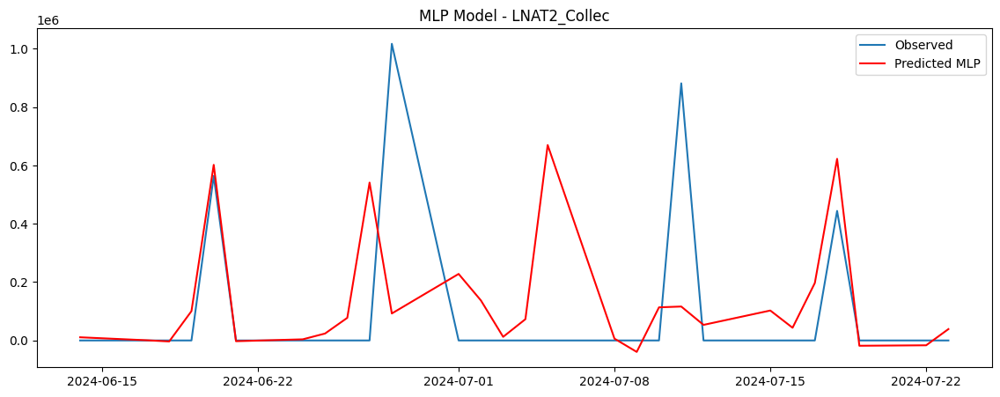

Training LSTM model for LNAT2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
RMSE for LNAT2_Collec using LSTM: 351457529180.2472


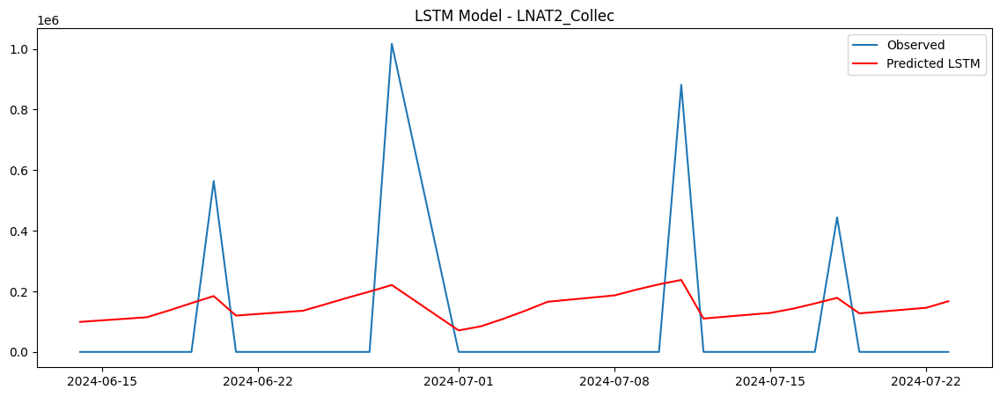

Training CNN model for LNAT2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
RMSE for LNAT2_Collec using CNN: 4.284664094838242e+17


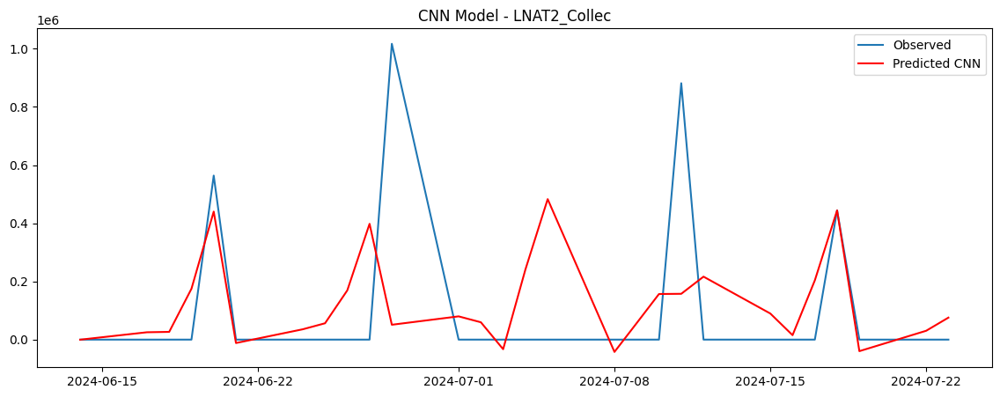

Training GRU model for LNAT2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
RMSE for LNAT2_Collec using GRU: 5.2234881561724206e+23


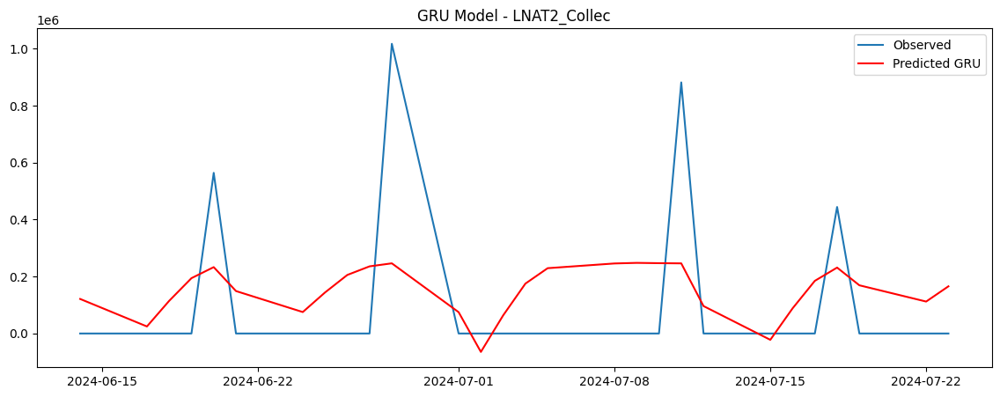

Processing series: LNACC_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNACC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNACC_Collec using MLP: 8626472.464428488


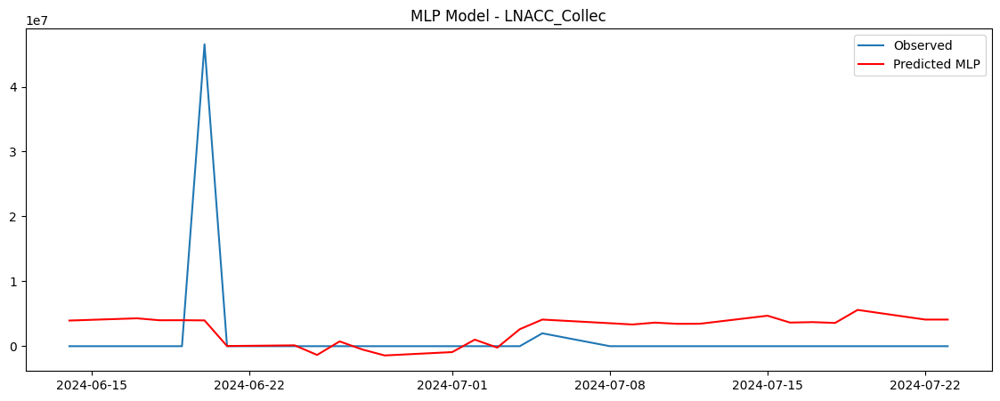

Training LSTM model for LNACC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
RMSE for LNACC_Collec using LSTM: 416851740535729.5


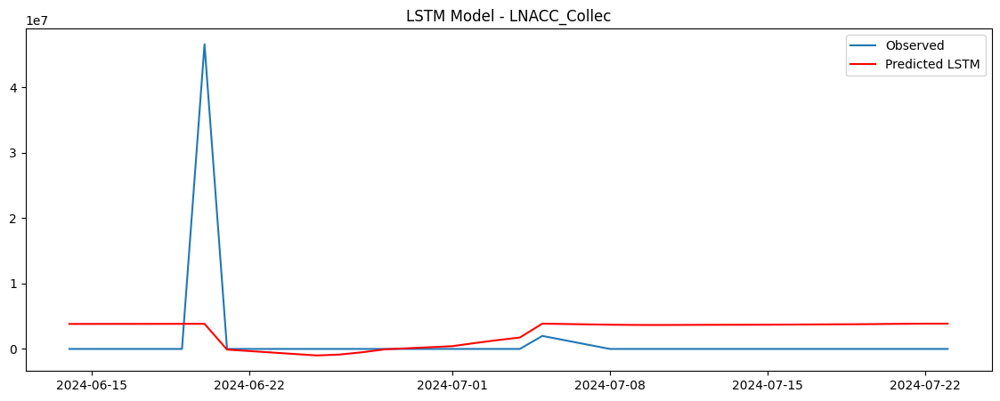

Training CNN model for LNACC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
RMSE for LNACC_Collec using CNN: 1.9736529411673294e+22


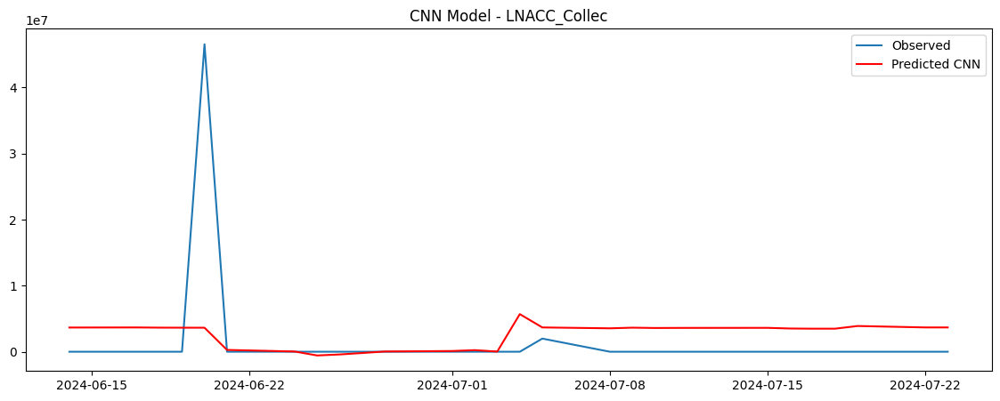

Training GRU model for LNACC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
RMSE for LNACC_Collec using GRU: 9.344583568512134e+29


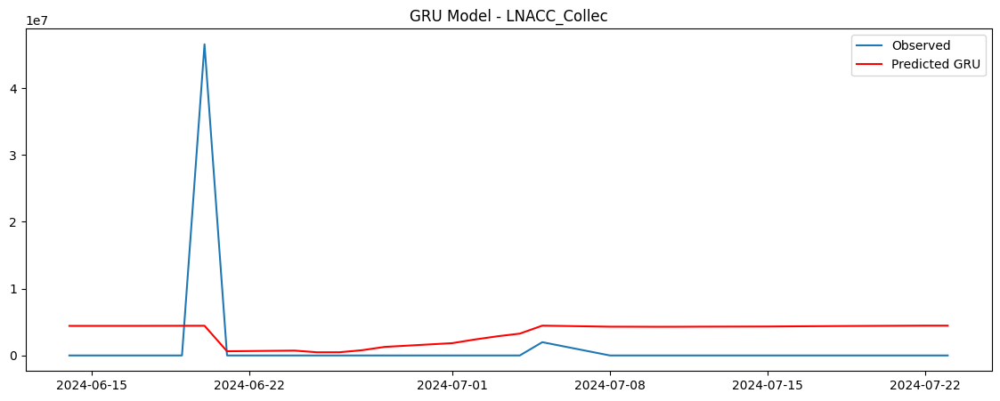

Processing series: LNACE_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNACE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
RMSE for LNACE_Collec using MLP: 0.0


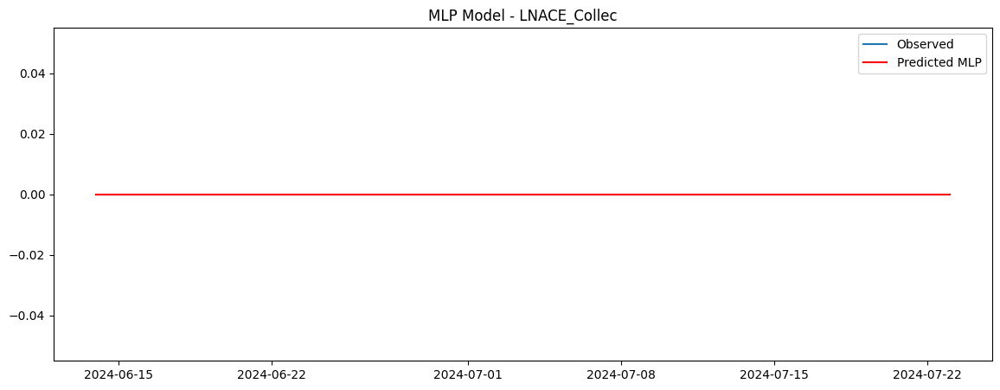

Training LSTM model for LNACE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
RMSE for LNACE_Collec using LSTM: 0.0


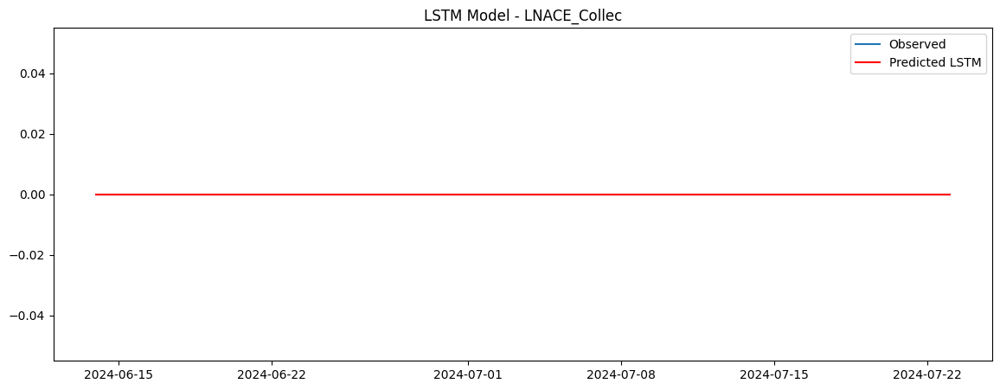

Training CNN model for LNACE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
RMSE for LNACE_Collec using CNN: 0.0


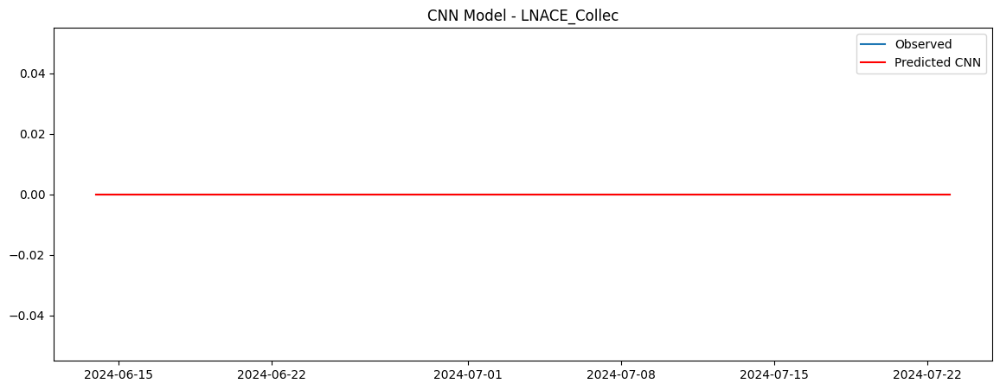

Training GRU model for LNACE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
RMSE for LNACE_Collec using GRU: 0.0


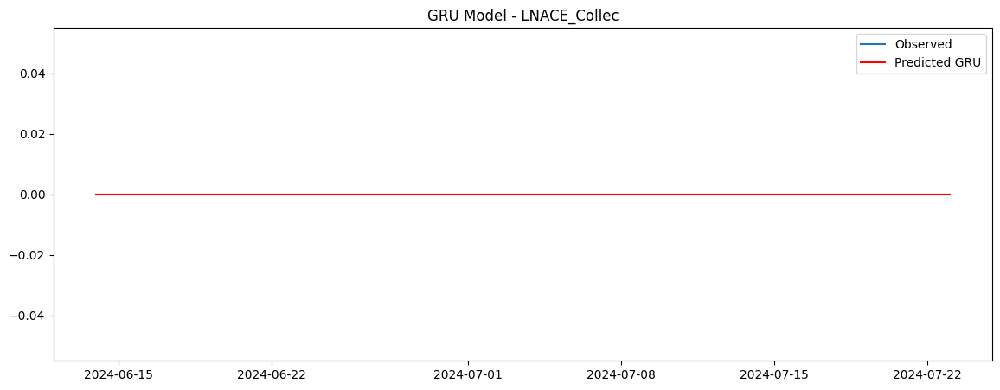

Processing series: LNAC3_Collec
Training MLP model for LNAC3_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
RMSE for LNAC3_Collec using MLP: 0.0


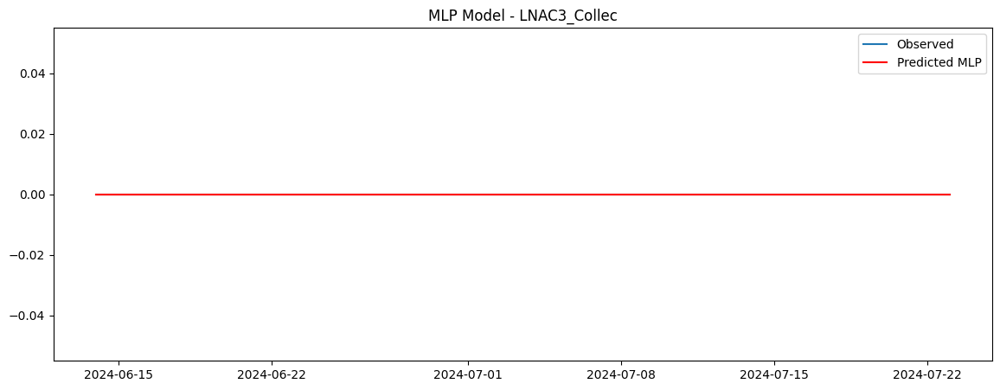

Training LSTM model for LNAC3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
RMSE for LNAC3_Collec using LSTM: 0.0


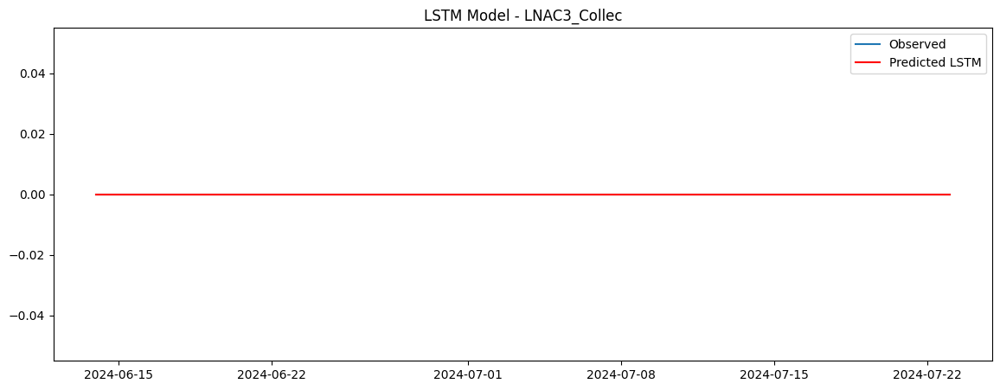

Training CNN model for LNAC3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNAC3_Collec using CNN: 0.0


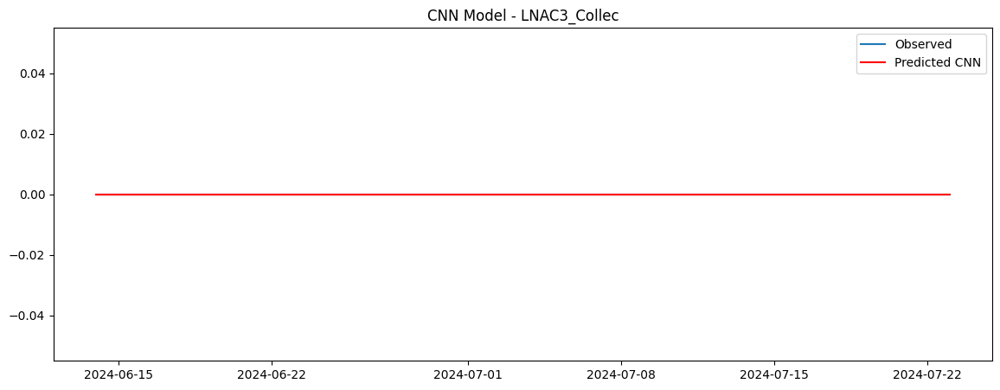

Training GRU model for LNAC3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
RMSE for LNAC3_Collec using GRU: 0.0


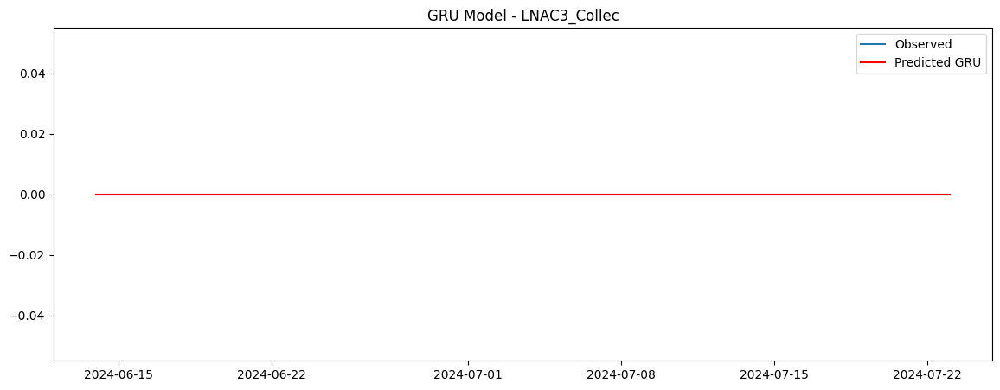

Processing series: LNAC4_Collec
Training MLP model for LNAC4_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
RMSE for LNAC4_Collec using MLP: 0.0


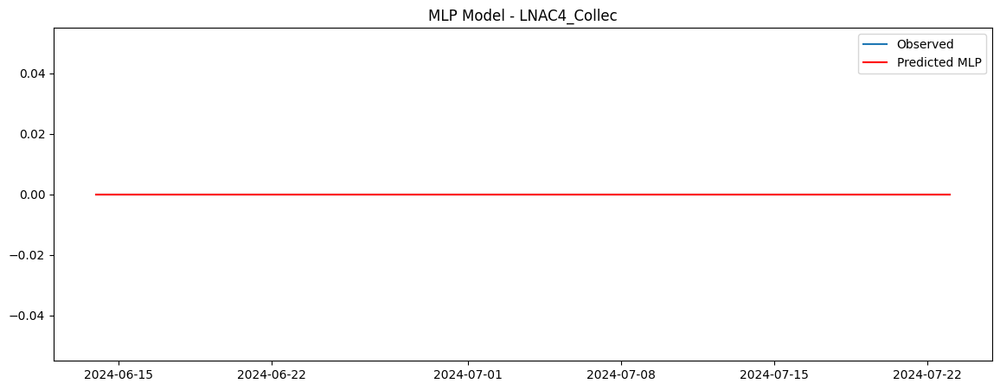

Training LSTM model for LNAC4_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
RMSE for LNAC4_Collec using LSTM: 0.0


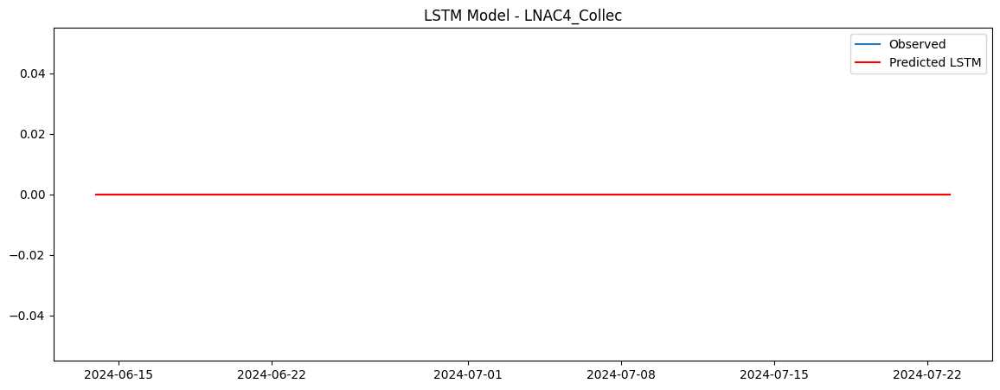

Training CNN model for LNAC4_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
RMSE for LNAC4_Collec using CNN: 0.0


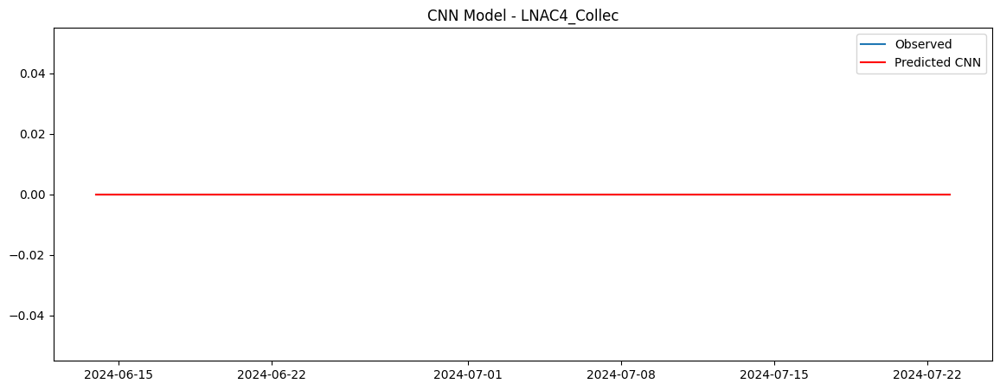

Training GRU model for LNAC4_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
RMSE for LNAC4_Collec using GRU: 0.0


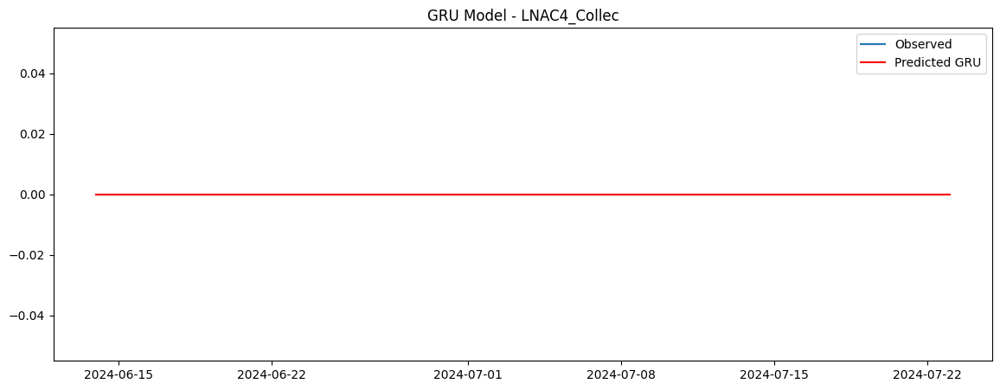

Processing series: LNAC6_Collec
Training MLP model for LNAC6_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
RMSE for LNAC6_Collec using MLP: 9557.411477929387


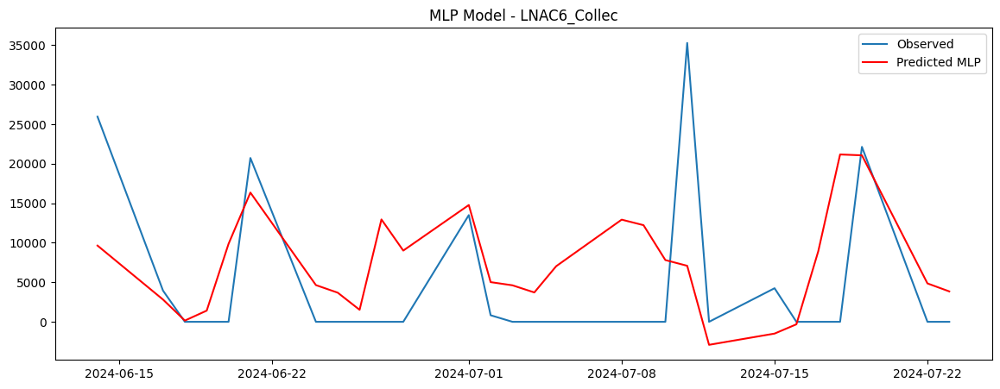

Training LSTM model for LNAC6_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
RMSE for LNAC6_Collec using LSTM: 824299659.8618461


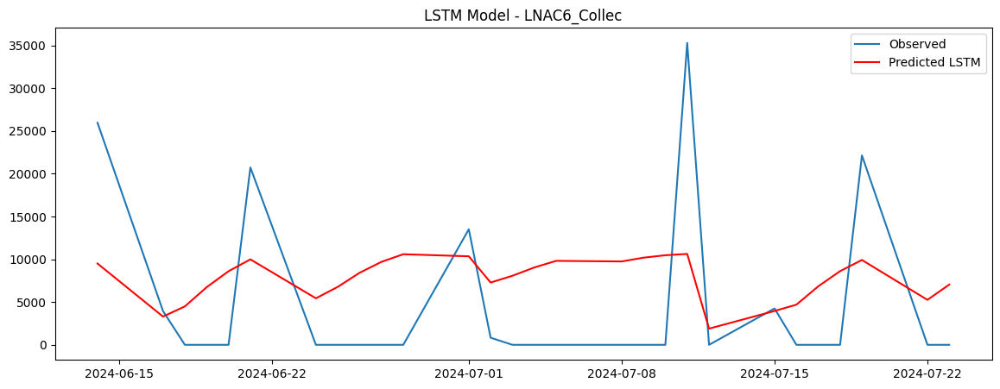

Training CNN model for LNAC6_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
RMSE for LNAC6_Collec using CNN: 65049748206460.984


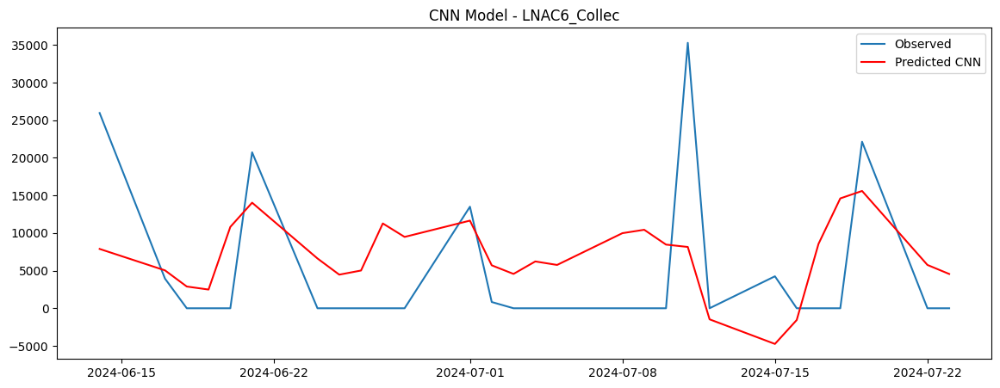

Training GRU model for LNAC6_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
RMSE for LNAC6_Collec using GRU: 5.133385918618845e+18


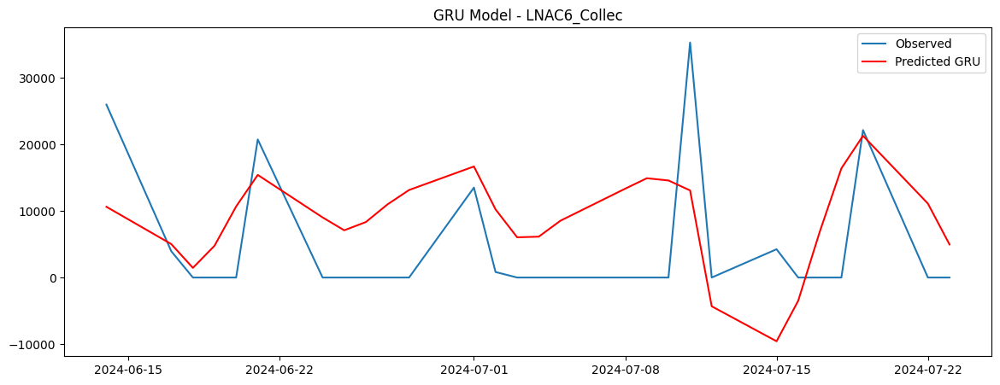

Processing series: LNDOL_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNDOL_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNDOL_Collec using MLP: 1445774.6904132778


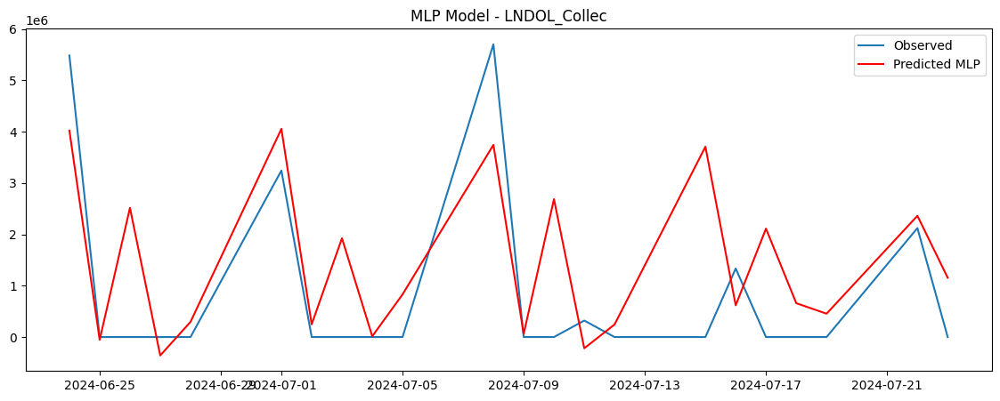

Training LSTM model for LNDOL_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
RMSE for LNDOL_Collec using LSTM: 20988157845693.414


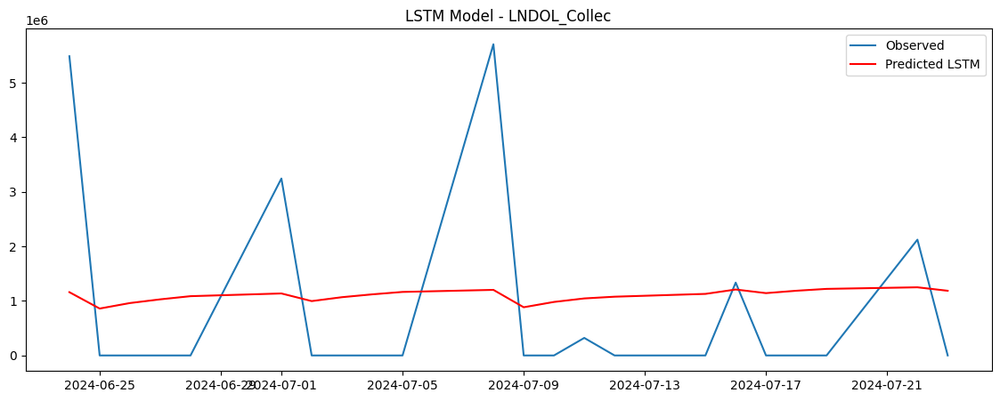

Training CNN model for LNDOL_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNDOL_Collec using CNN: 2.3168946407616237e+20


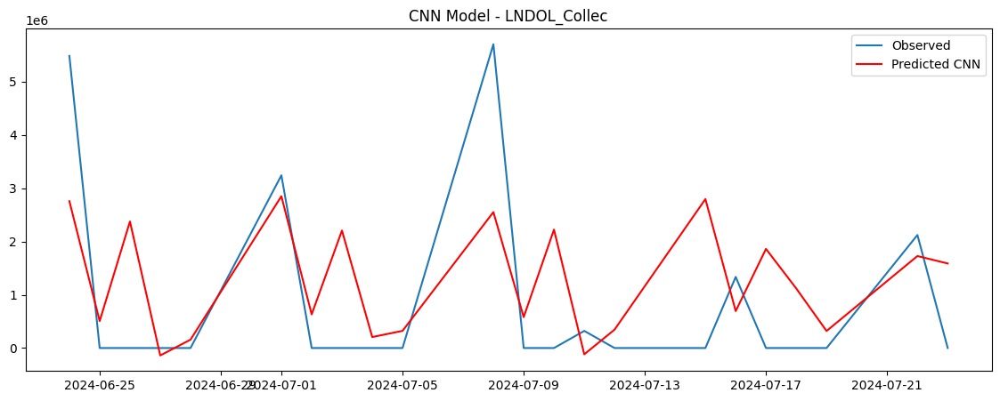

Training GRU model for LNDOL_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
RMSE for LNDOL_Collec using GRU: 2.557633063539436e+27


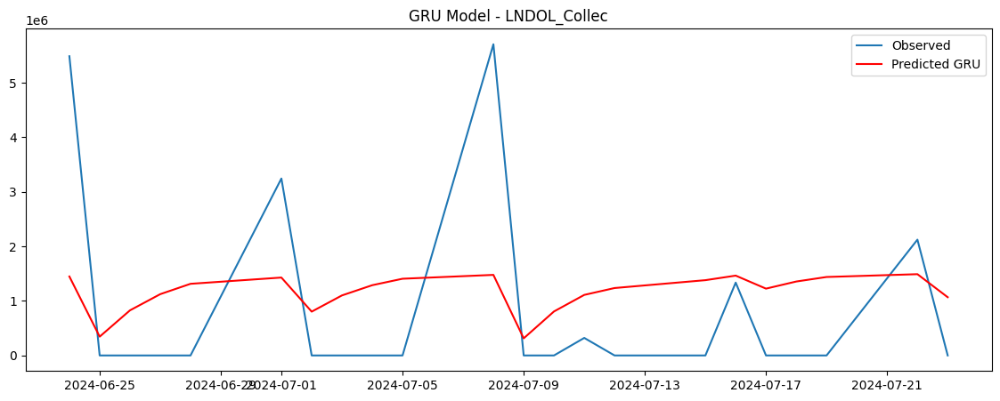

Processing series: LNEDI_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNEDI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
RMSE for LNEDI_Collec using MLP: 7239592.414902105


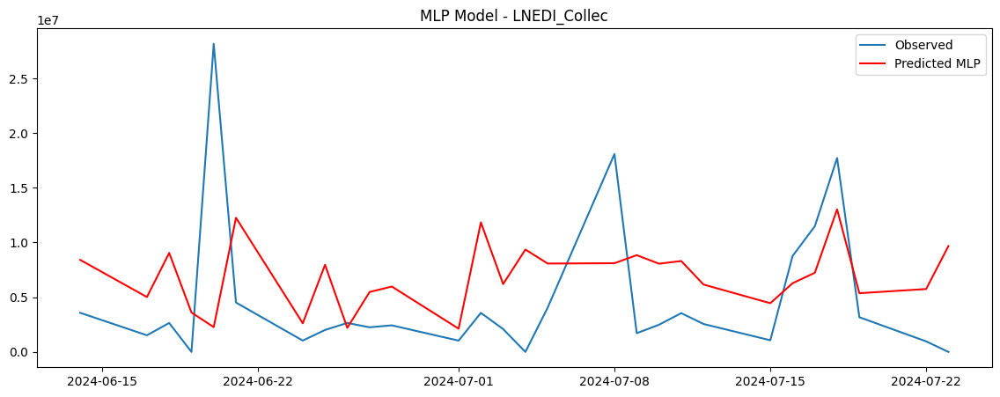

Training LSTM model for LNEDI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
RMSE for LNEDI_Collec using LSTM: 353821057678339.5


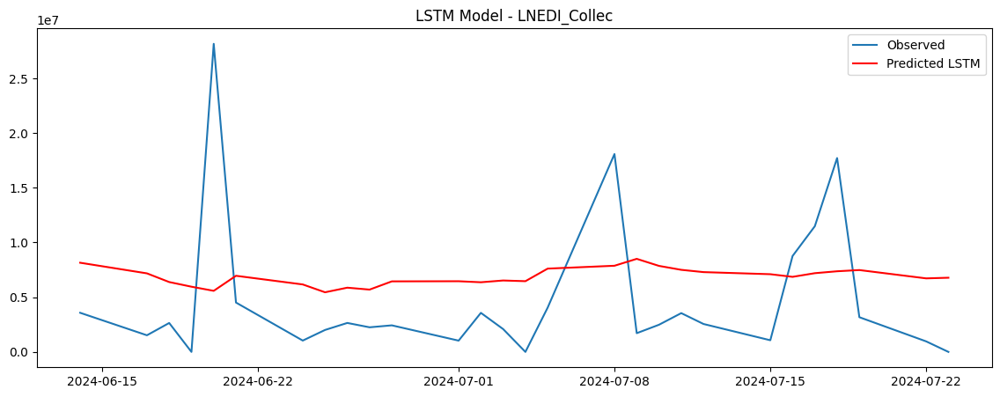

Training CNN model for LNEDI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
RMSE for LNEDI_Collec using CNN: 1.568822913653225e+22


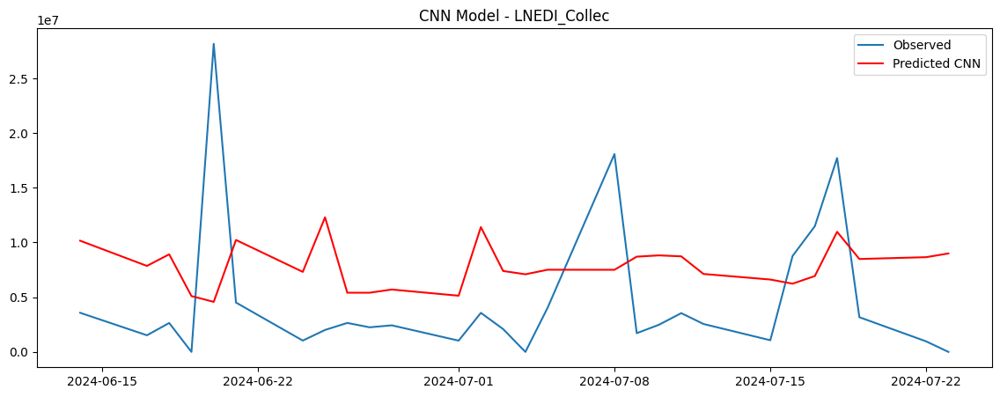

Training GRU model for LNEDI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
RMSE for LNEDI_Collec using GRU: 6.95607356474029e+29


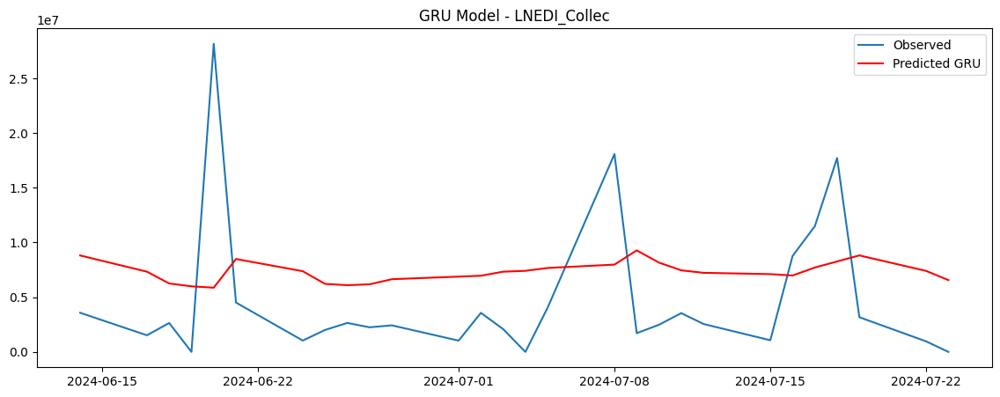

Processing series: LNEDN_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNEDN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
RMSE for LNEDN_Collec using MLP: 3902271.2136292714


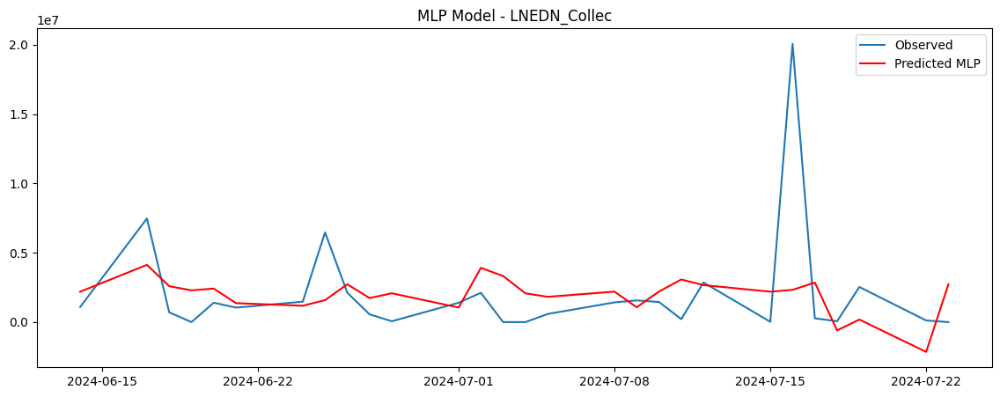

Training LSTM model for LNEDN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
RMSE for LNEDN_Collec using LSTM: 88079946599500.8


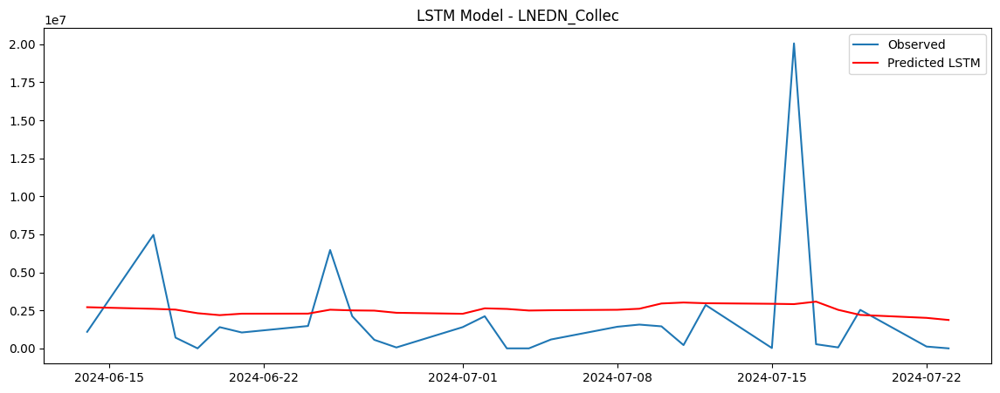

Training CNN model for LNEDN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNEDN_Collec using CNN: 1.7670068824350416e+21


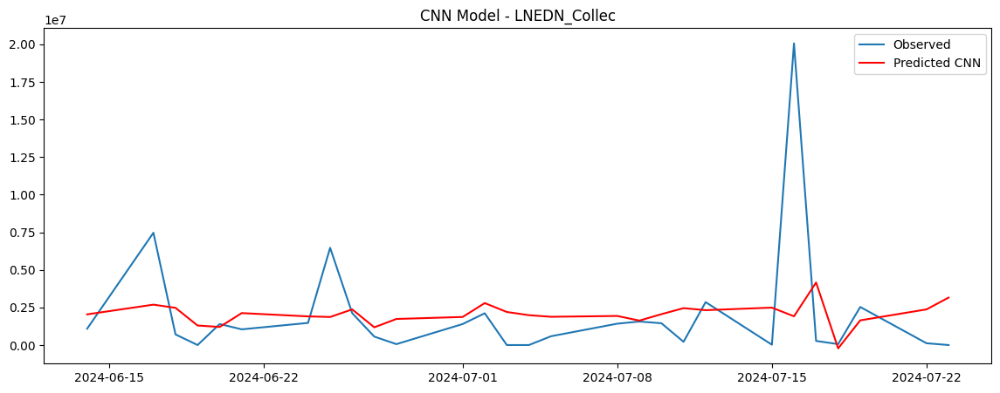

Training GRU model for LNEDN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
RMSE for LNEDN_Collec using GRU: 3.544862819590805e+28


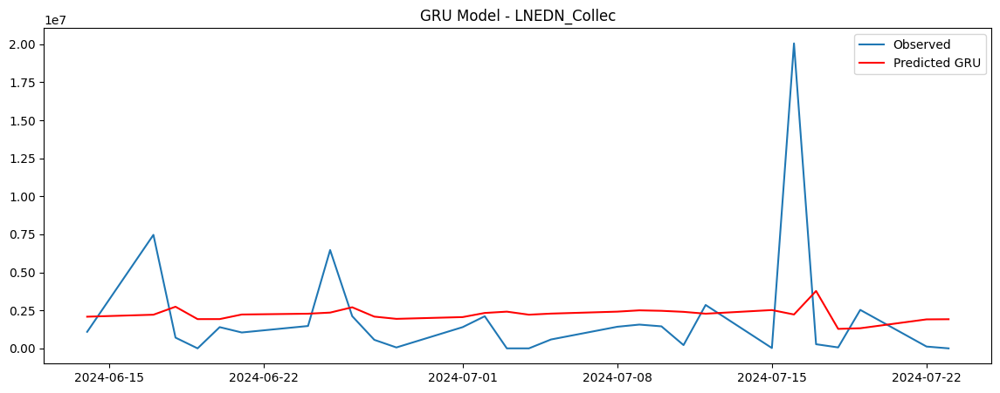

Processing series: LNENT_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNENT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
RMSE for LNENT_Collec using MLP: 25568912.159701448


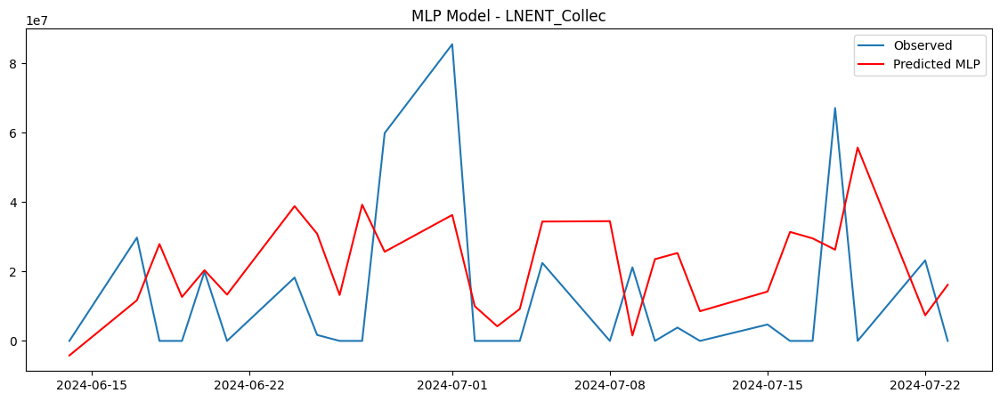

Training LSTM model for LNENT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
RMSE for LNENT_Collec using LSTM: 4238186547596150.5


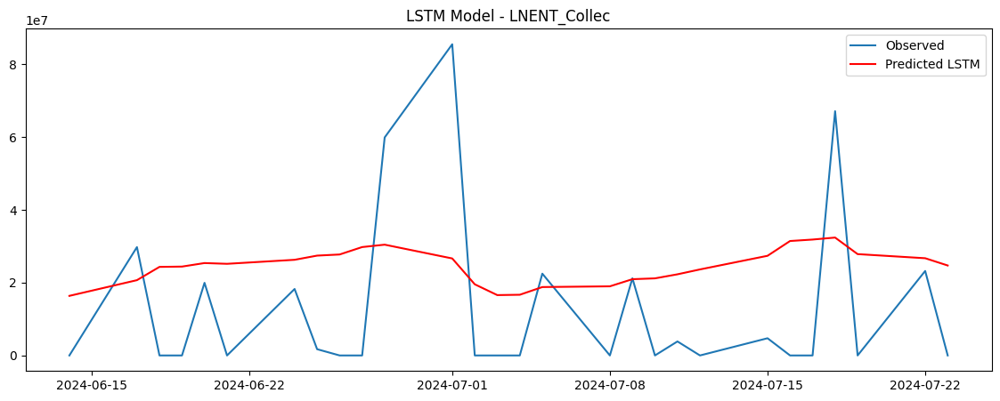

Training CNN model for LNENT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
RMSE for LNENT_Collec using CNN: 6.974532514632128e+23


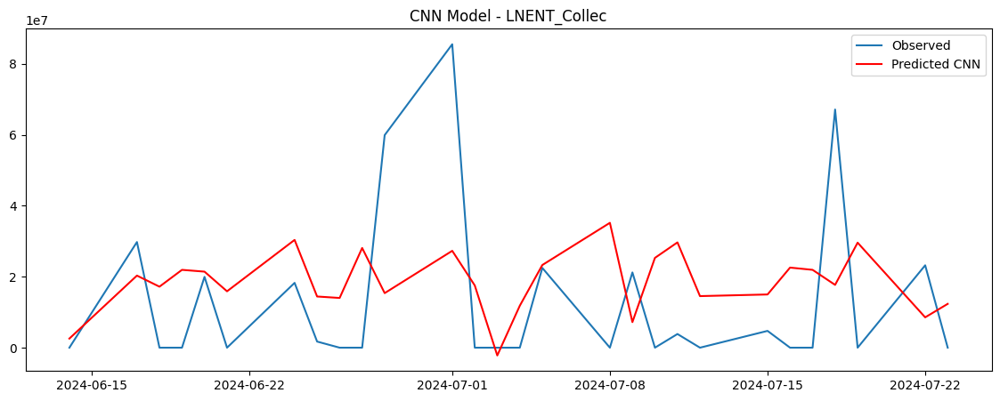

Training GRU model for LNENT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
RMSE for LNENT_Collec using GRU: 1.1477574924555676e+32


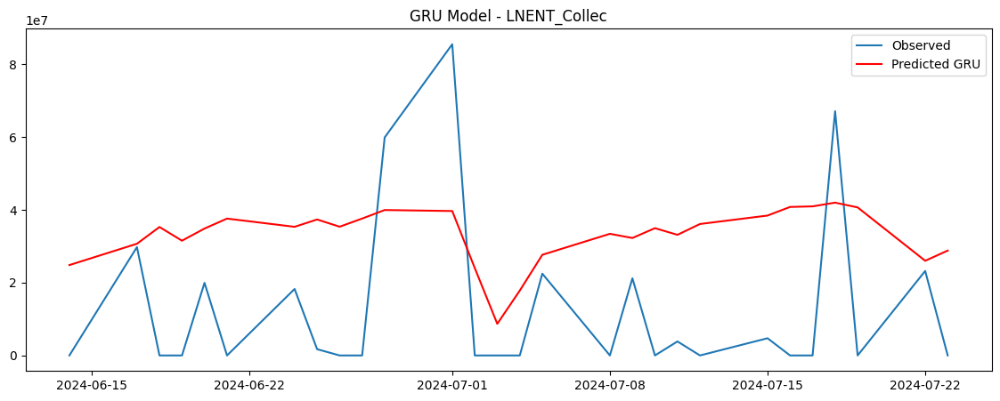

Processing series: LNENE_Collec
Training MLP model for LNENE_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
RMSE for LNENE_Collec using MLP: 19556069.14407425


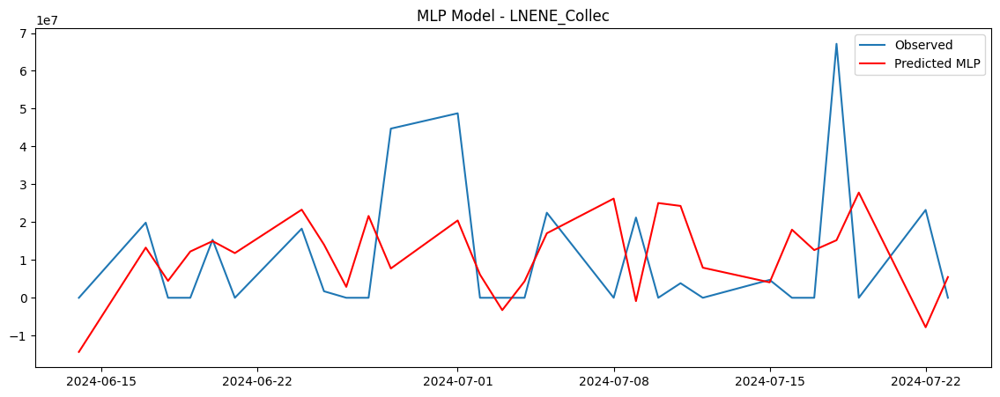

Training LSTM model for LNENE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
RMSE for LNENE_Collec using LSTM: 1698699191144733.0


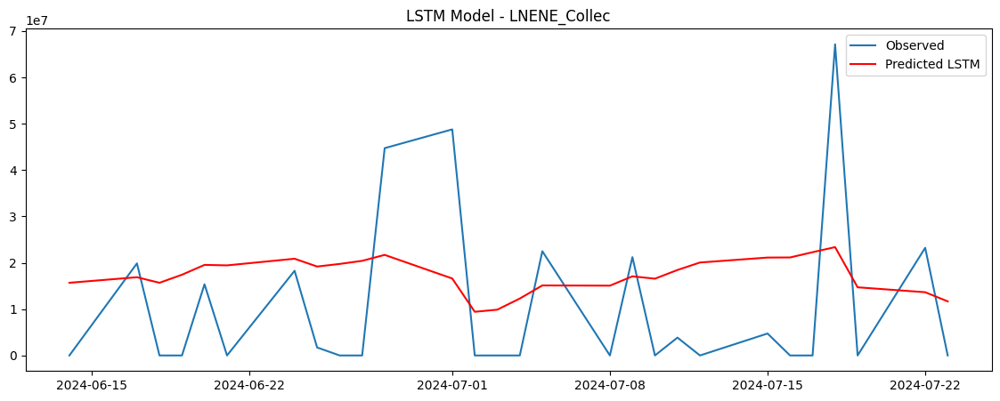

Training CNN model for LNENE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
RMSE for LNENE_Collec using CNN: 1.4308769480333297e+23


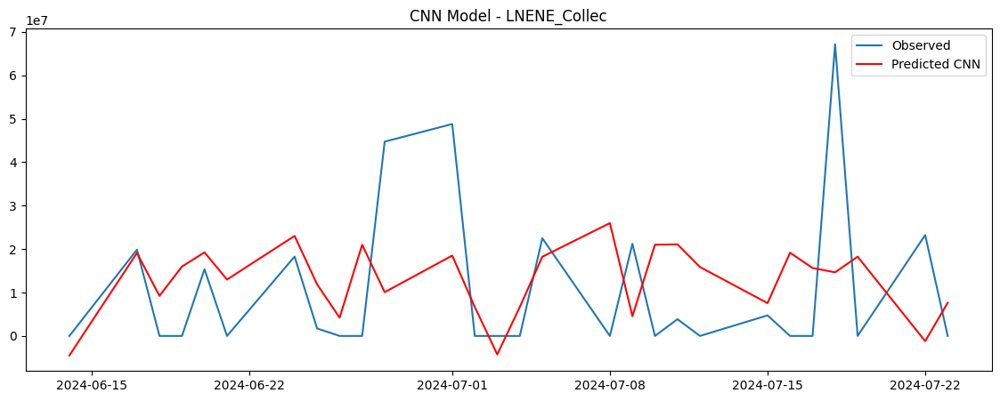

Training GRU model for LNENE_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
RMSE for LNENE_Collec using GRU: 1.2052803928771996e+31


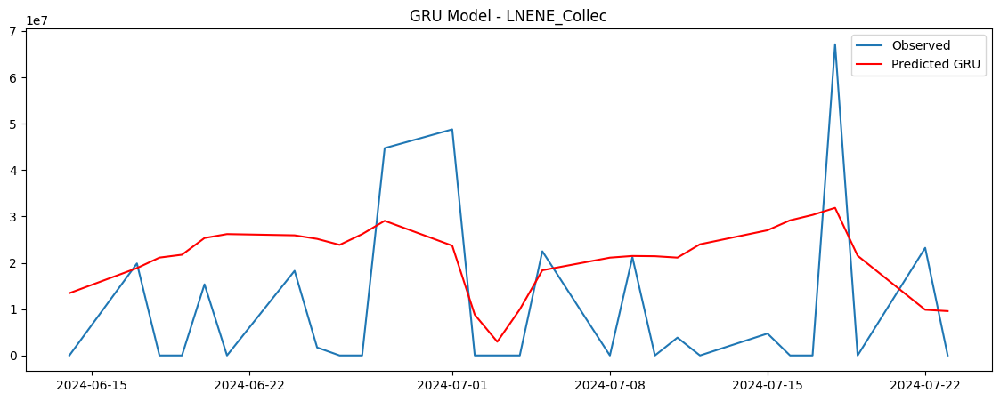

Processing series: LNENM_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNENM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
RMSE for LNENM_Collec using MLP: 10523016.729036417


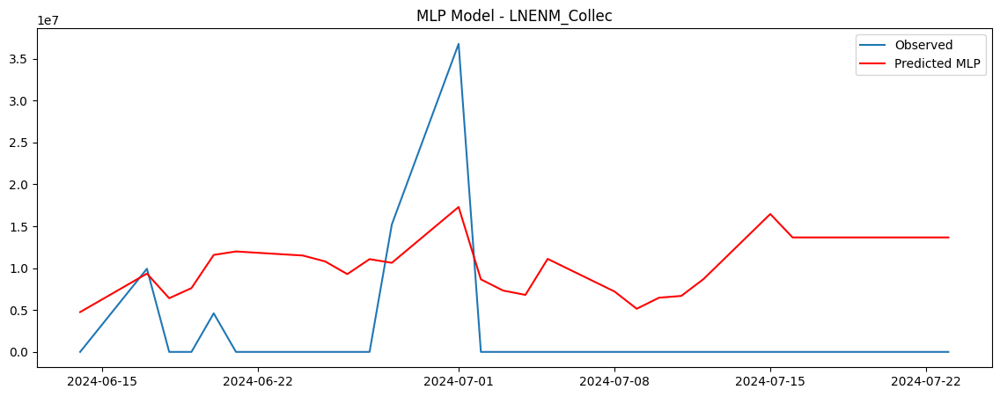

Training LSTM model for LNENM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
RMSE for LNENM_Collec using LSTM: 626352870430114.5


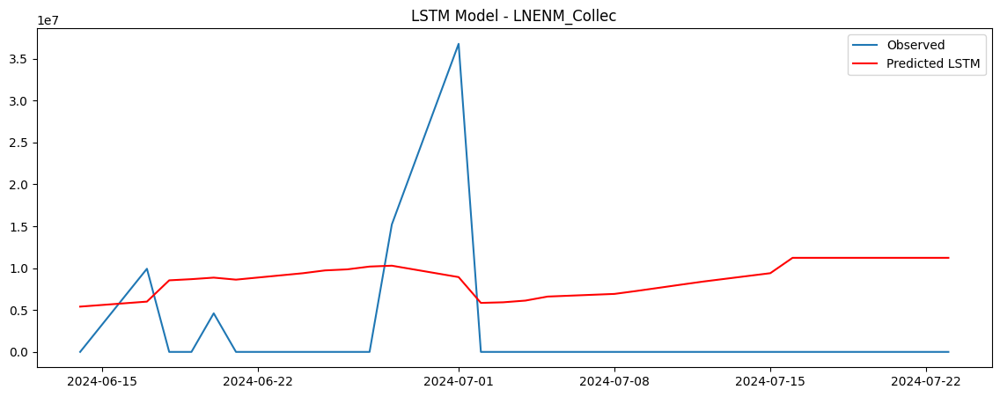

Training CNN model for LNENM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNENM_Collec using CNN: 5.0315170117262445e+22


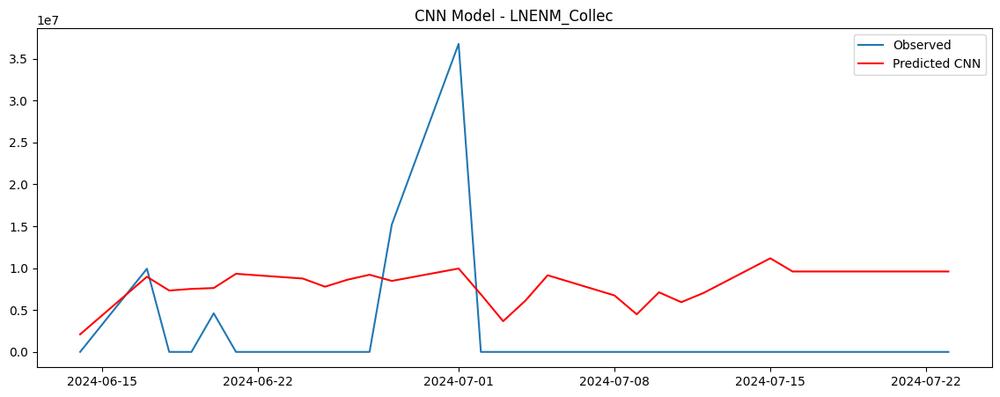

Training GRU model for LNENM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
RMSE for LNENM_Collec using GRU: 4.041837201705964e+30


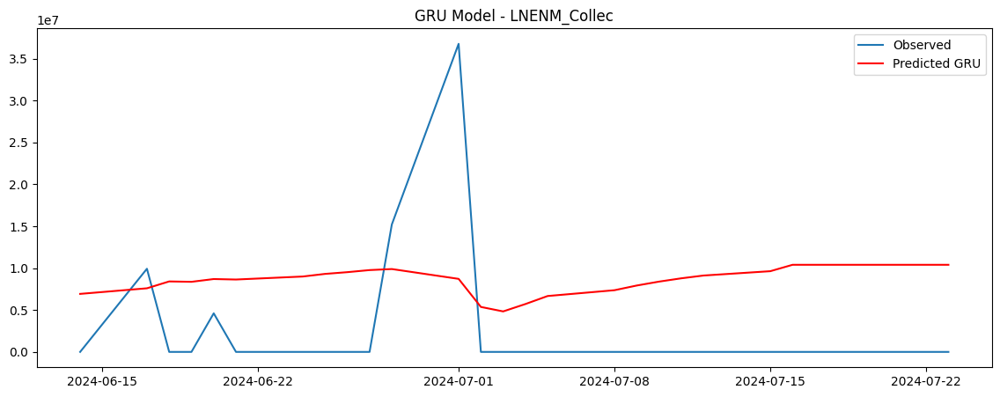

Processing series: LNEFM_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNEFM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
RMSE for LNEFM_Collec using MLP: 26218917.025492635


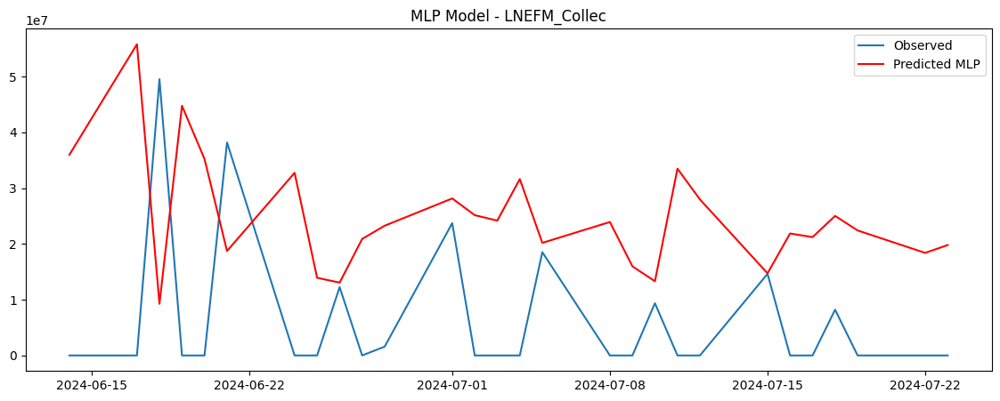

Training LSTM model for LNEFM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
RMSE for LNEFM_Collec using LSTM: 7090258328230862.0


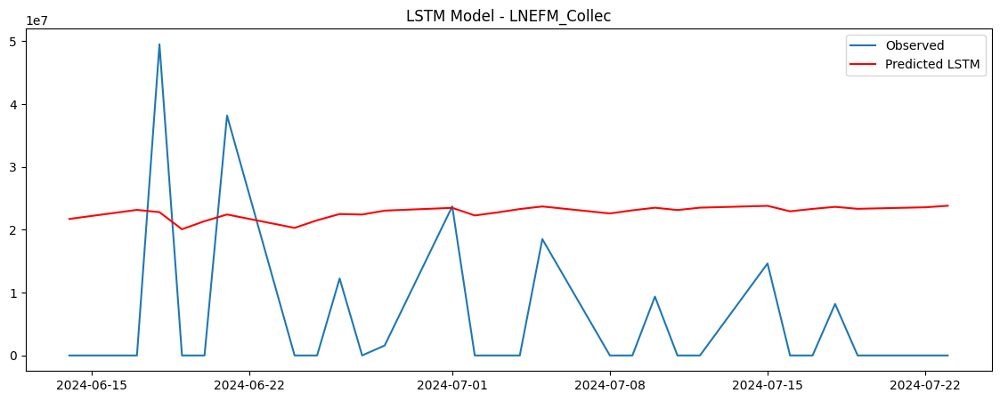

Training CNN model for LNEFM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
RMSE for LNEFM_Collec using CNN: 3.641168726238225e+24


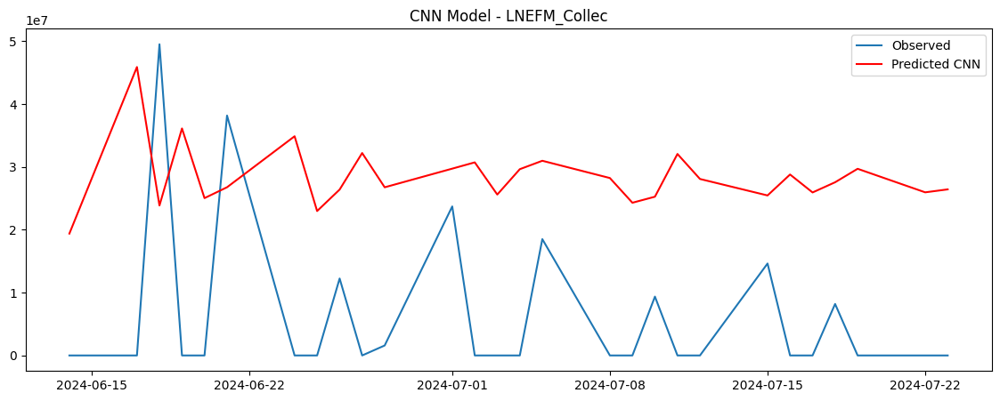

Training GRU model for LNEFM_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
RMSE for LNEFM_Collec using GRU: 1.8699050245493458e+33


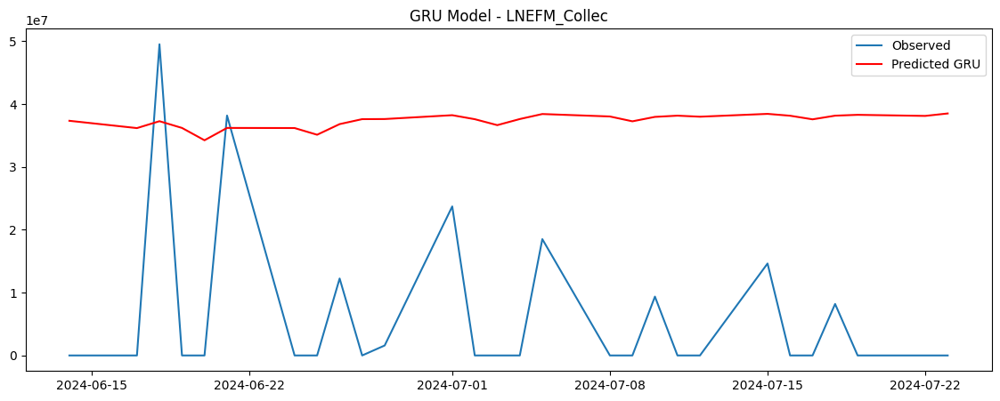

Processing series: LNENP_Collec
Training MLP model for LNENP_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
RMSE for LNENP_Collec using MLP: 5573677.065081276


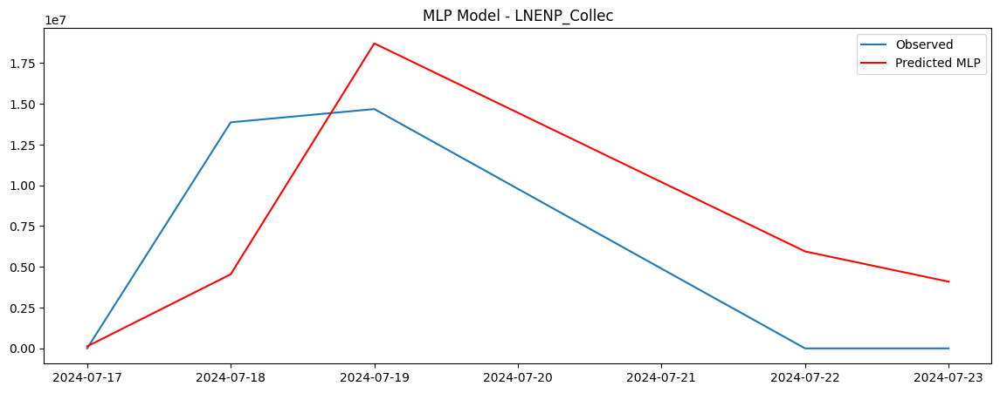

Training LSTM model for LNENP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
RMSE for LNENP_Collec using LSTM: 2941474223053272.0


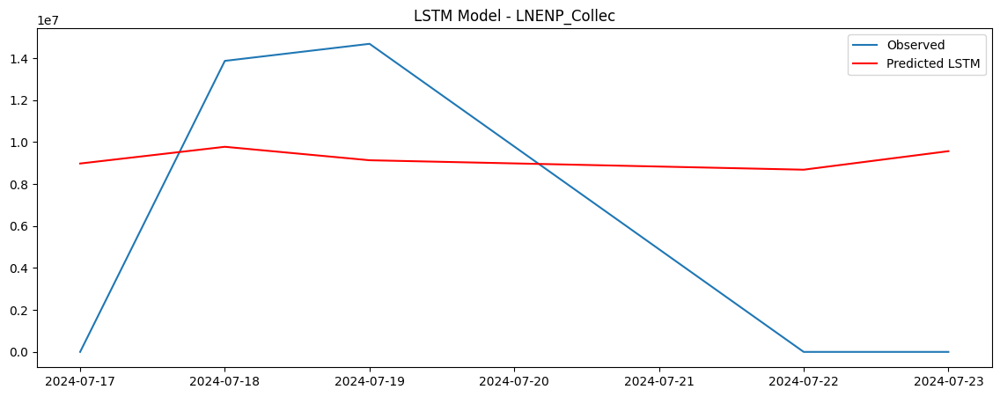

Training CNN model for LNENP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
RMSE for LNENP_Collec using CNN: 9.579758270542544e+23


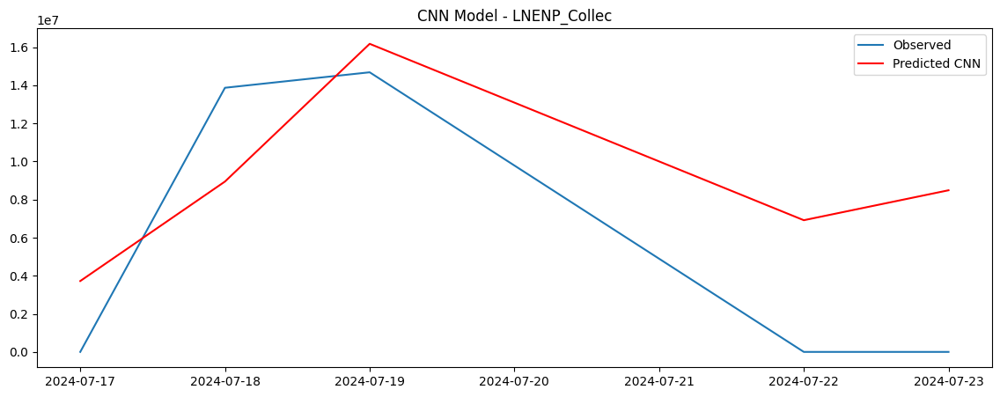

Training GRU model for LNENP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
RMSE for LNENP_Collec using GRU: 3.1199242752665123e+32


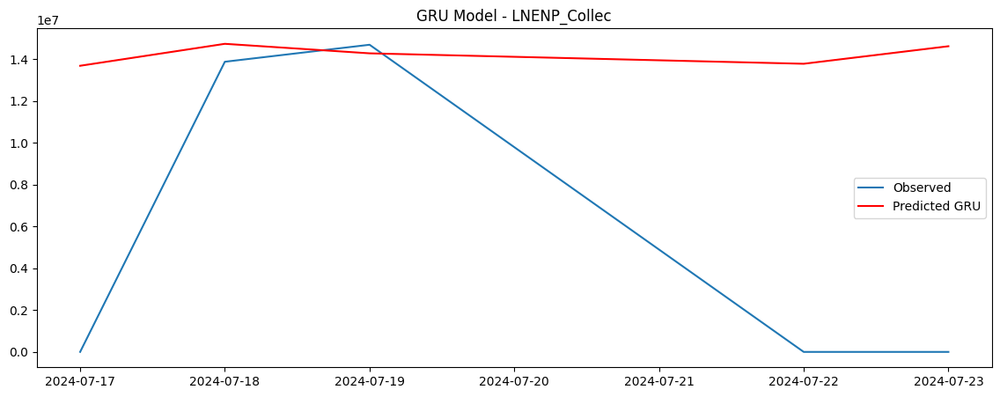

Processing series: LNENG_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNENG_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
RMSE for LNENG_Collec using MLP: 6310961.637848868


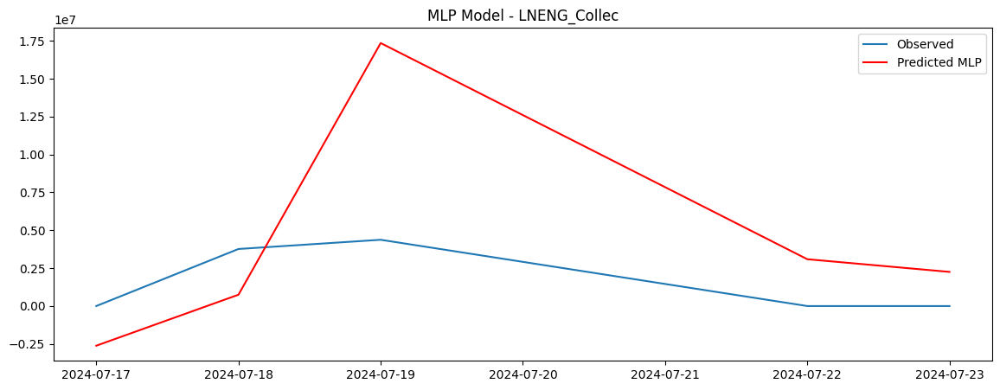

Training LSTM model for LNENG_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
RMSE for LNENG_Collec using LSTM: 187999838970193.25


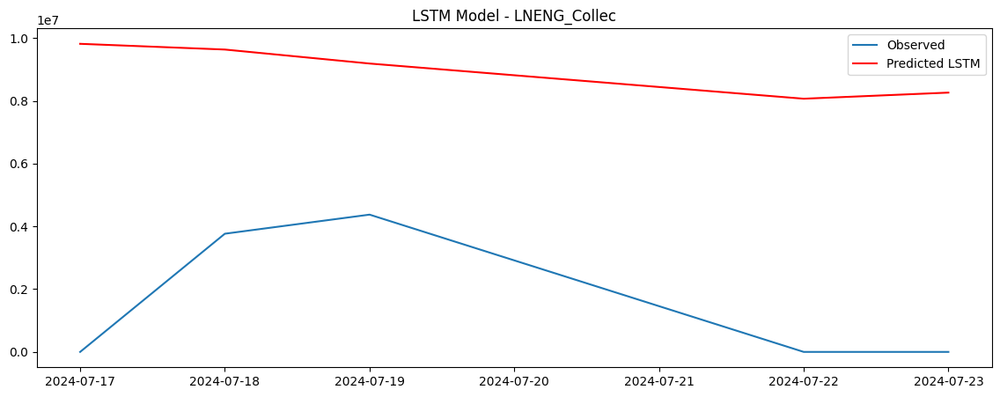

Training CNN model for LNENG_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
RMSE for LNENG_Collec using CNN: 1.3694071145271308e+22


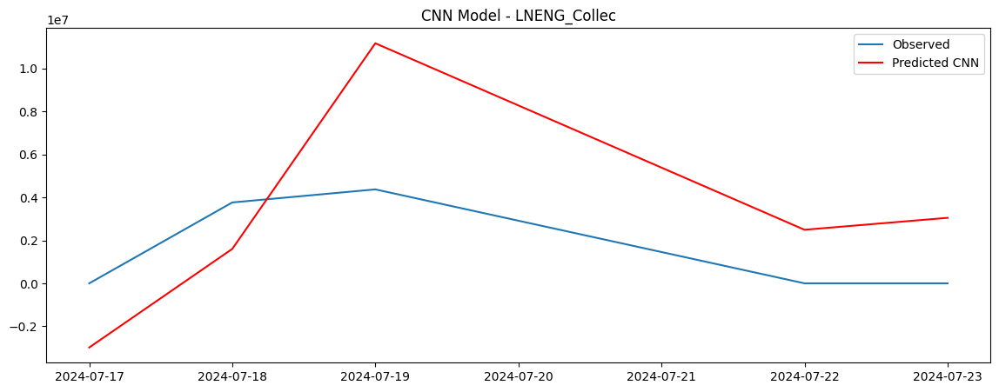

Training GRU model for LNENG_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
RMSE for LNENG_Collec using GRU: 9.974879747206763e+29


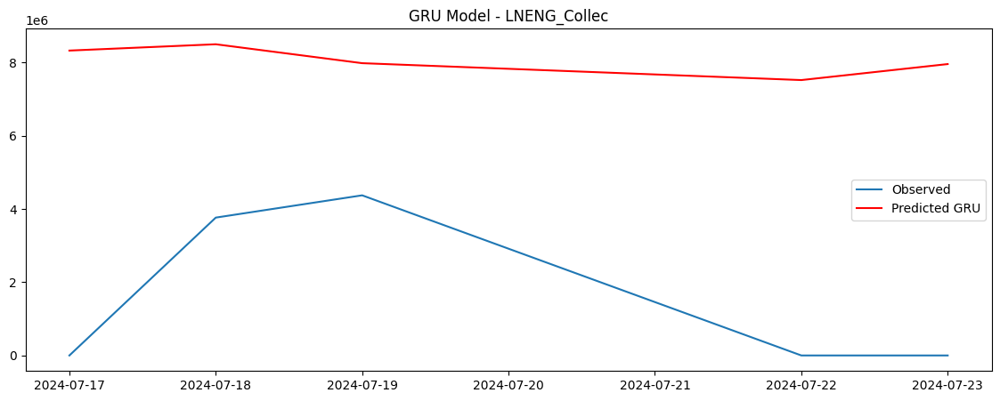

Processing series: LNSEN_Collec
Training MLP model for LNSEN_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
RMSE for LNSEN_Collec using MLP: 0.0


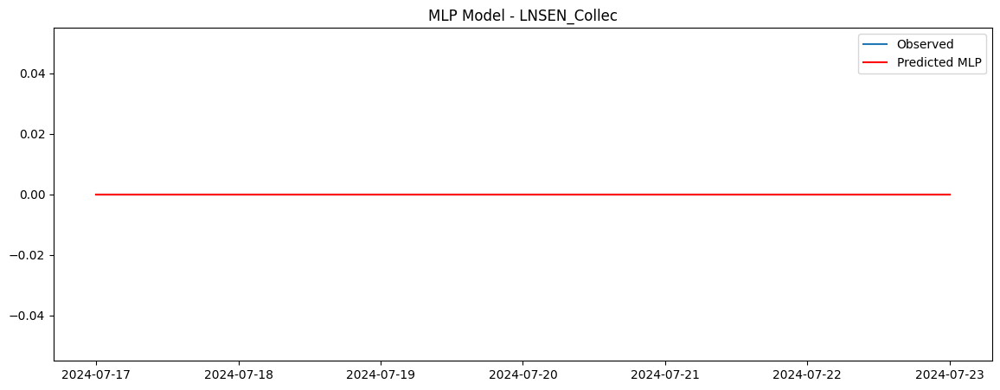

Training LSTM model for LNSEN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
RMSE for LNSEN_Collec using LSTM: 0.0


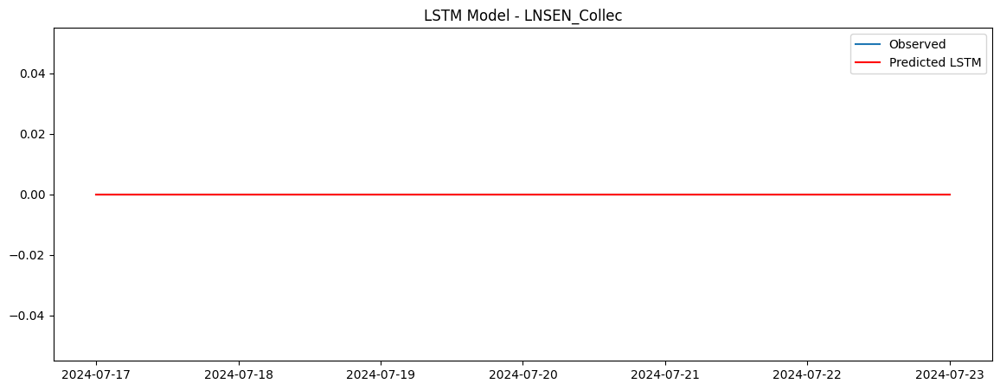

Training CNN model for LNSEN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
RMSE for LNSEN_Collec using CNN: 0.0


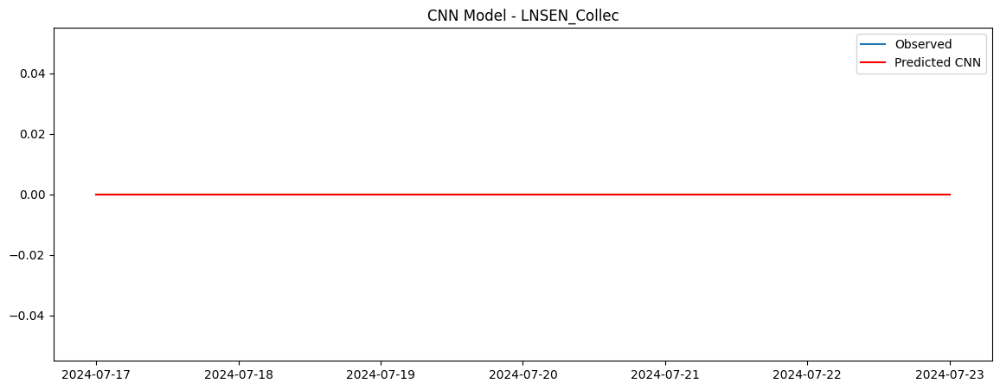

Training GRU model for LNSEN_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
RMSE for LNSEN_Collec using GRU: 0.0


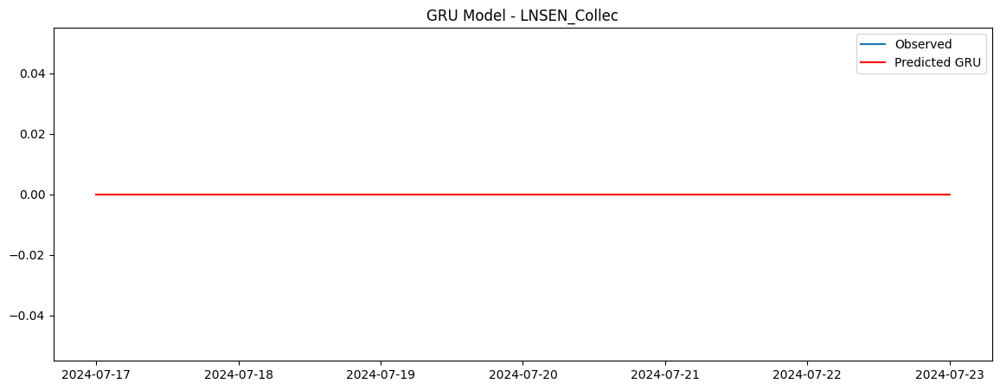

Processing series: LNENI_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNENI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNENI_Collec using MLP: 9335533.46490941


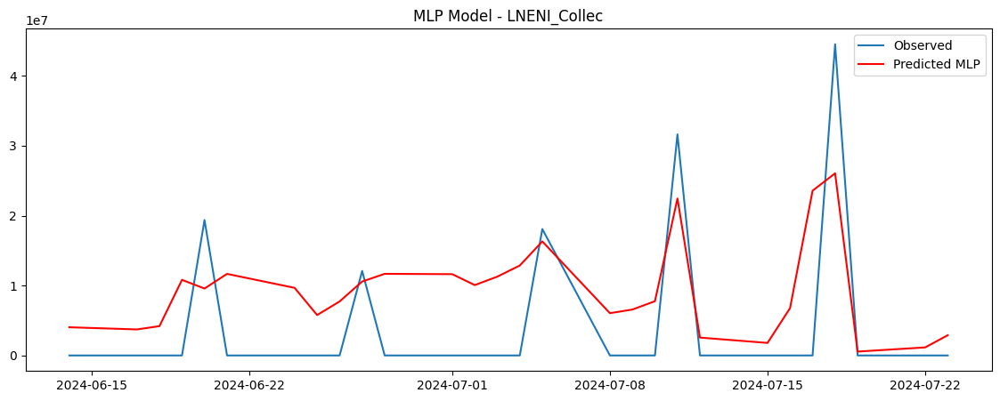

Training LSTM model for LNENI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
RMSE for LNENI_Collec using LSTM: 959790580895857.1


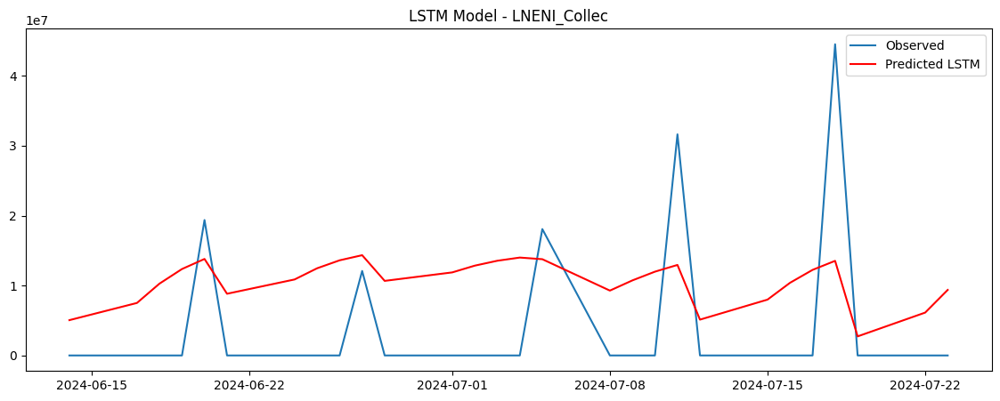

Training CNN model for LNENI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNENI_Collec using CNN: 7.876120894398928e+22


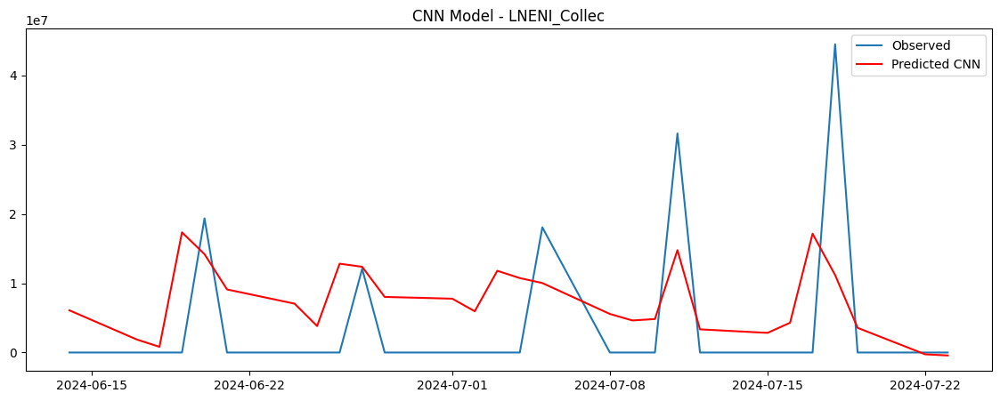

Training GRU model for LNENI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
RMSE for LNENI_Collec using GRU: 6.463209917047581e+30


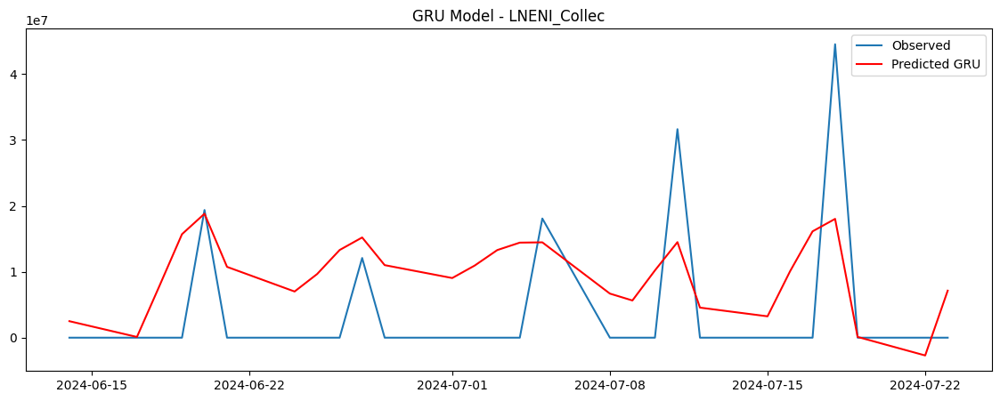

Processing series: LNENC_Collec
Training MLP model for LNENC_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
RMSE for LNENC_Collec using MLP: 41.26803970336914


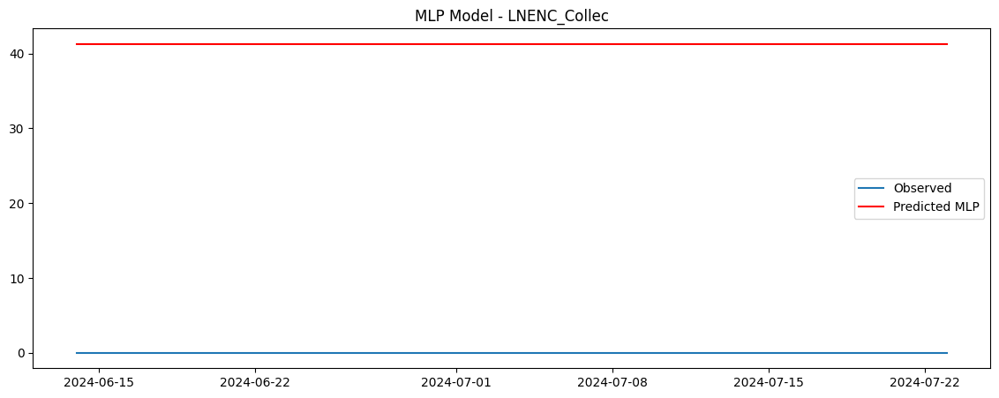

Training LSTM model for LNENC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
RMSE for LNENC_Collec using LSTM: 31.56980323791504


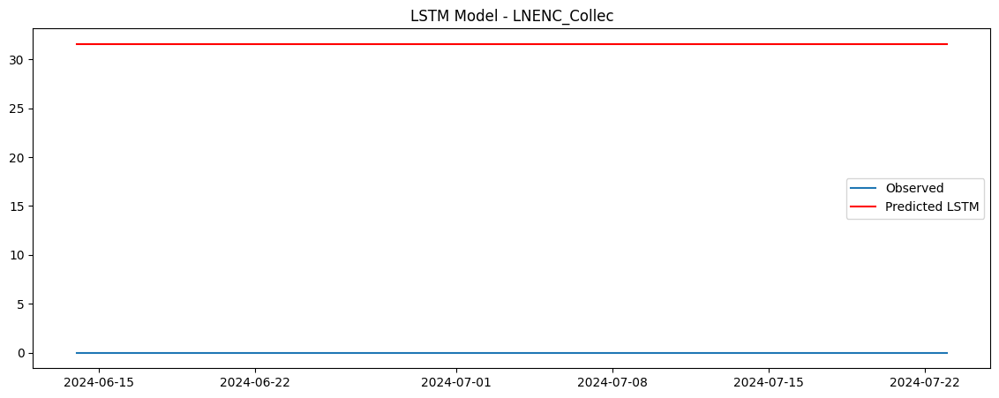

Training CNN model for LNENC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNENC_Collec using CNN: 31.387035369873047


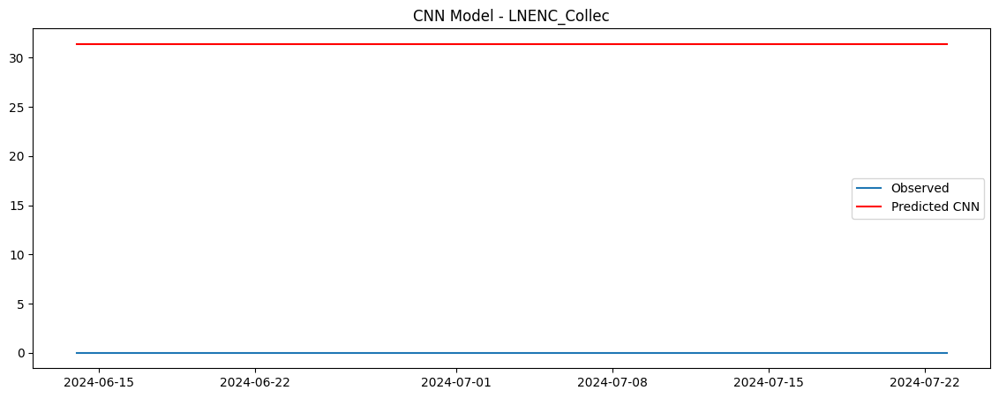

Training GRU model for LNENC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
RMSE for LNENC_Collec using GRU: 34.887054443359375


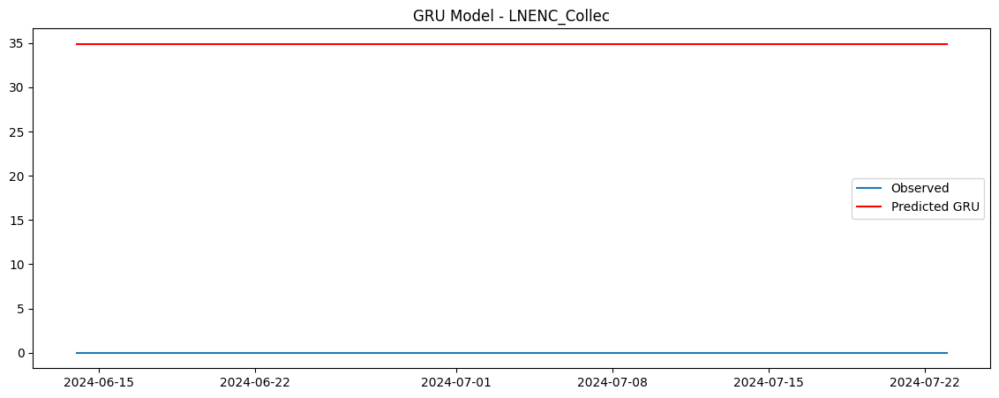

Processing series: LNEN3_Collec
Training MLP model for LNEN3_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
RMSE for LNEN3_Collec using MLP: 8.92809772491455


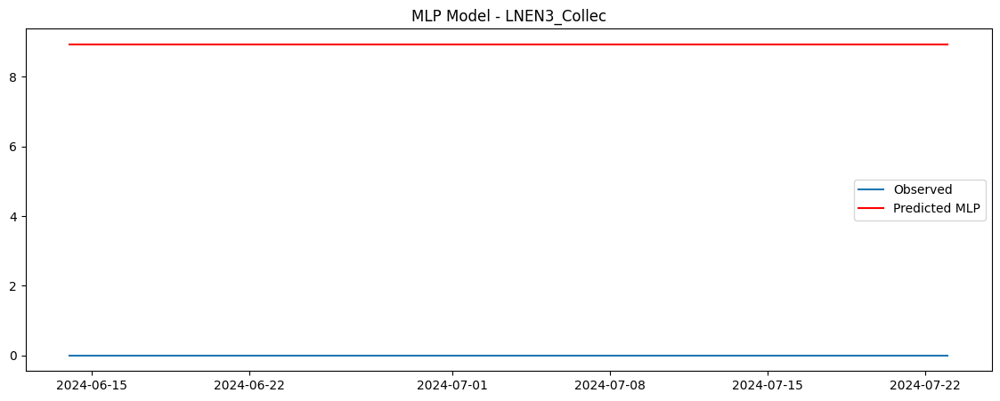

Training LSTM model for LNEN3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
RMSE for LNEN3_Collec using LSTM: 9.269327163696289


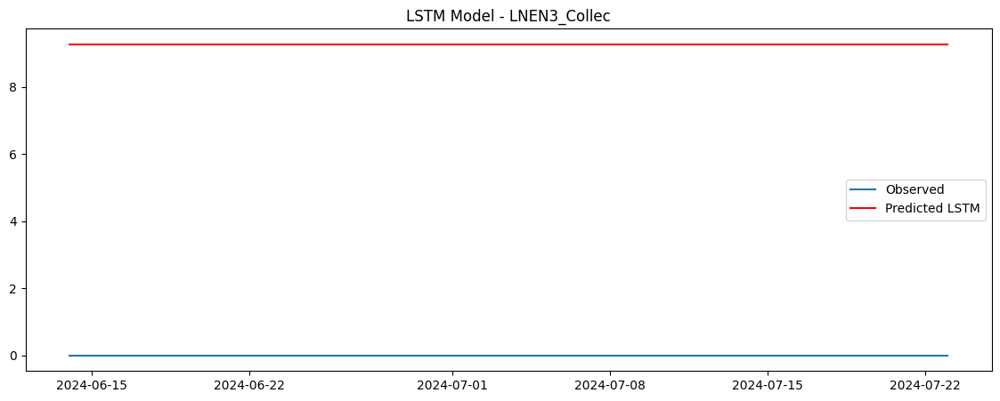

Training CNN model for LNEN3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNEN3_Collec using CNN: 7.614274978637695


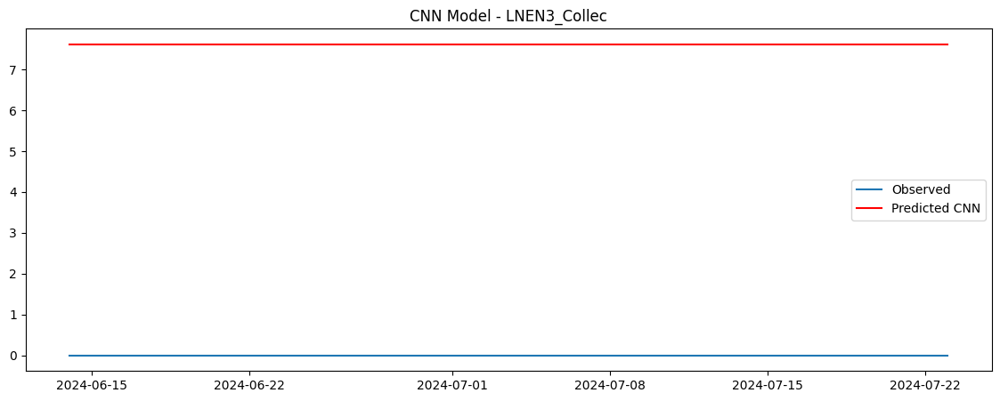

Training GRU model for LNEN3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
RMSE for LNEN3_Collec using GRU: 10.955612182617188


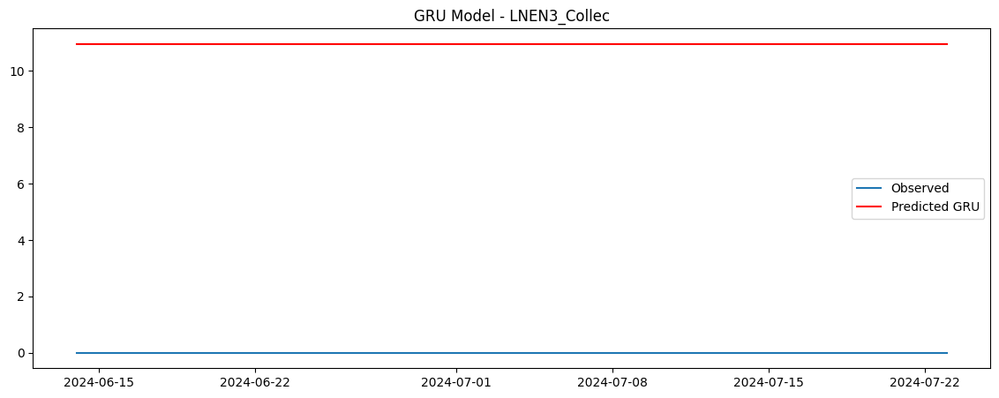

Processing series: LNGIV_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNGIV_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
RMSE for LNGIV_Collec using MLP: 965910.6852236537


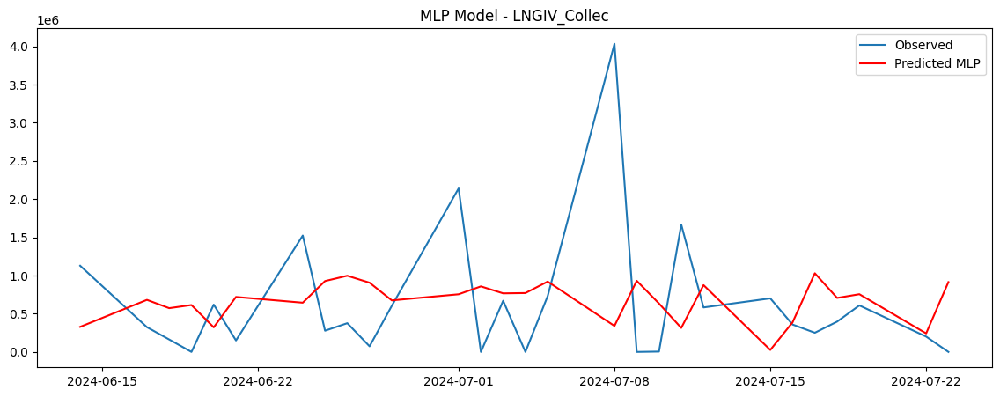

Training LSTM model for LNGIV_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
RMSE for LNGIV_Collec using LSTM: 8110877128543.904


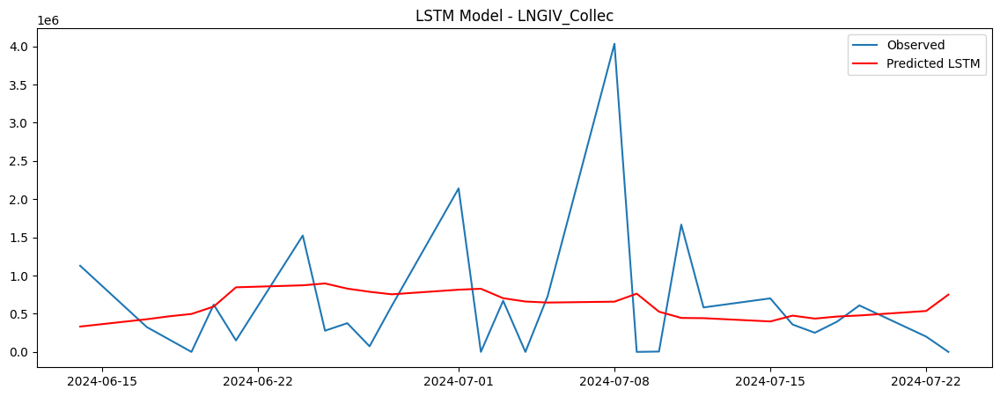

Training CNN model for LNGIV_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
RMSE for LNGIV_Collec using CNN: 6.262069670510603e+19


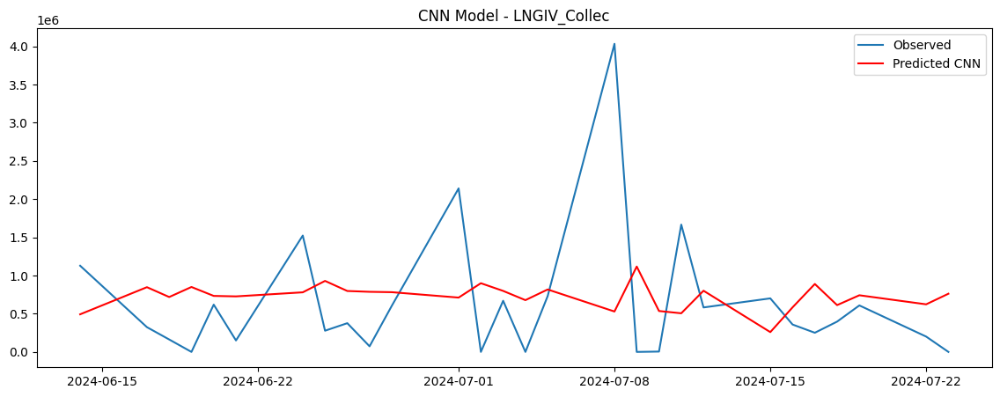

Training GRU model for LNGIV_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
RMSE for LNGIV_Collec using GRU: 4.834682382116641e+26


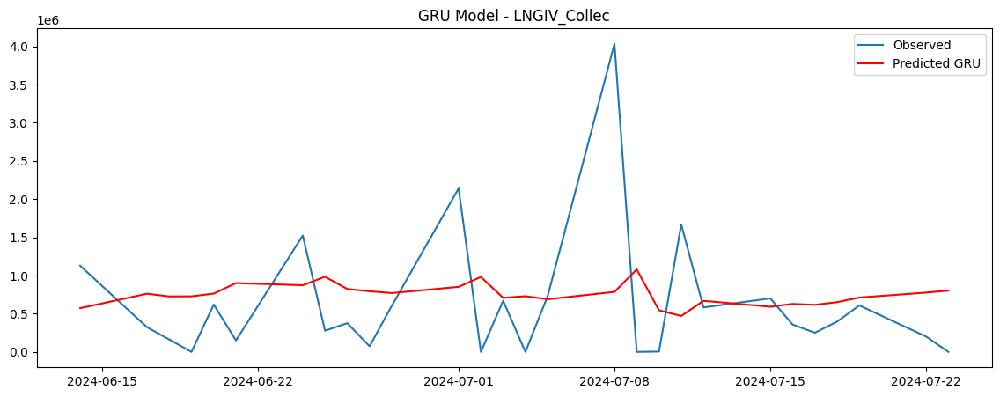

Processing series: LNGSI_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNGSI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
RMSE for LNGSI_Collec using MLP: 5659760.300931329


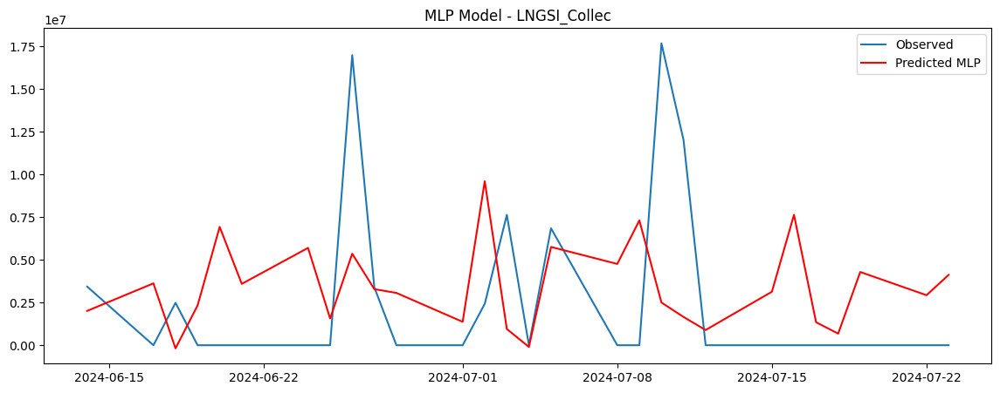

Training LSTM model for LNGSI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
RMSE for LNGSI_Collec using LSTM: 153641244444343.03


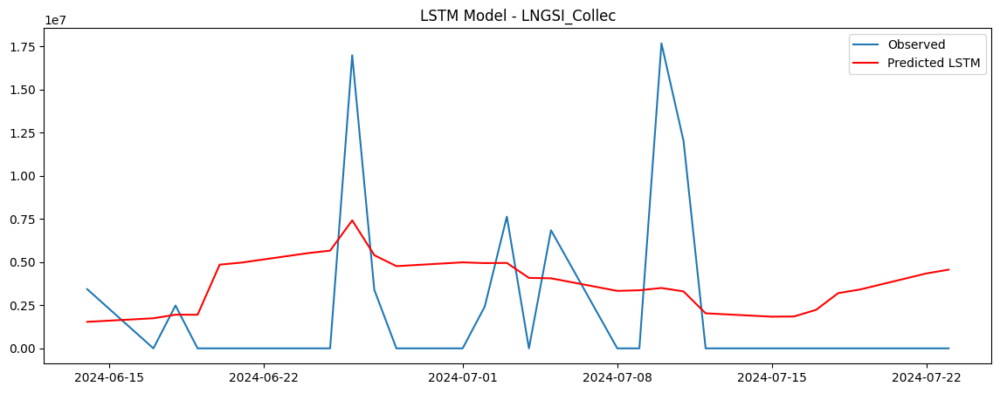

Training CNN model for LNGSI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
RMSE for LNGSI_Collec using CNN: 4.1953077378202285e+21


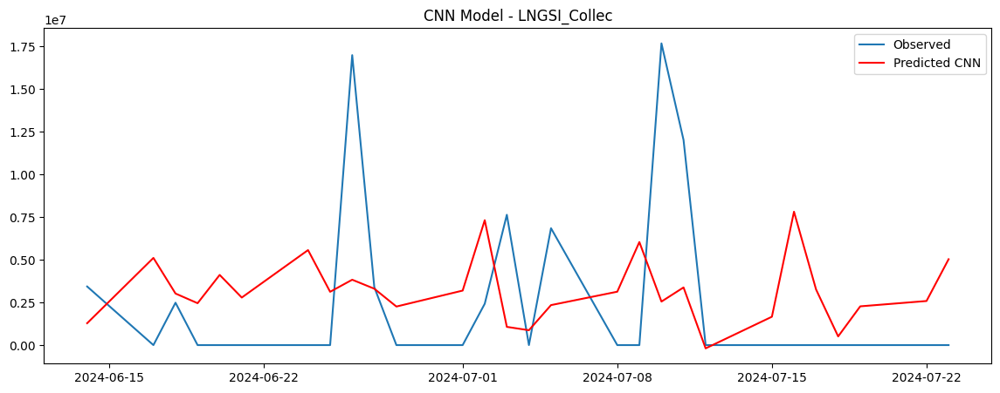

Training GRU model for LNGSI_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
RMSE for LNGSI_Collec using GRU: 1.1455652312602783e+29


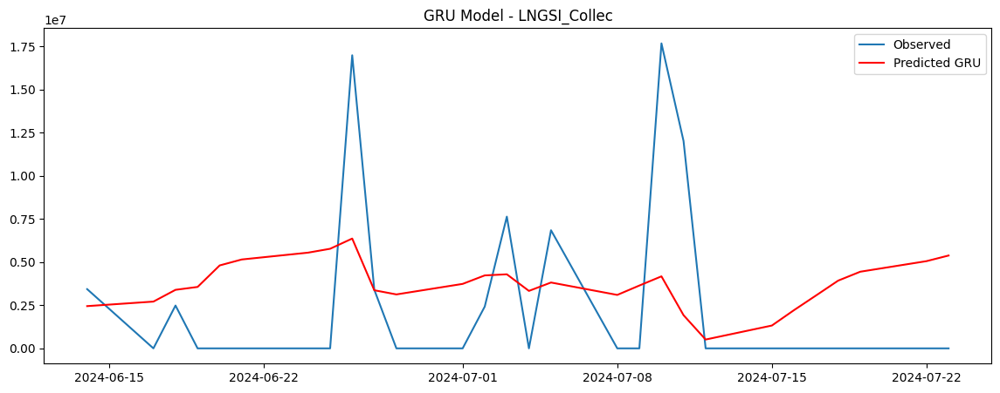

Processing series: LNIGT_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNIGT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNIGT_Collec using MLP: 0.0


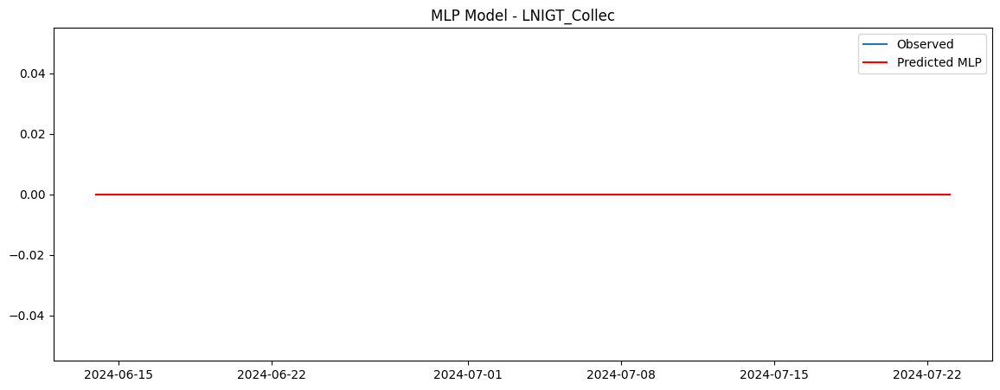

Training LSTM model for LNIGT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
RMSE for LNIGT_Collec using LSTM: 0.0


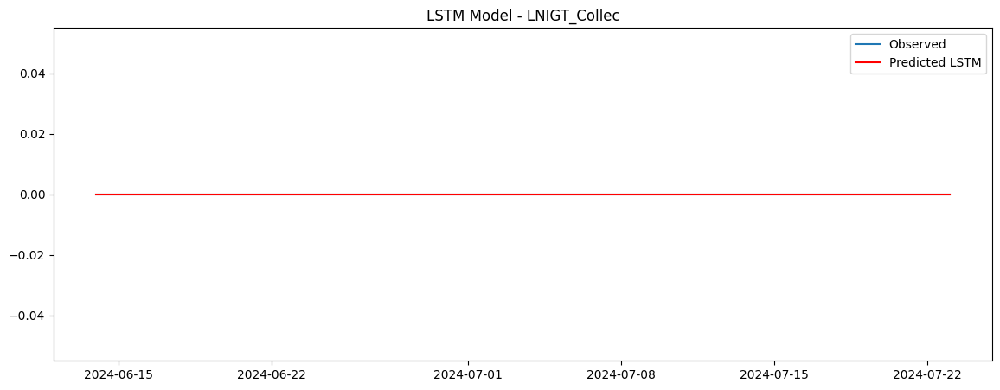

Training CNN model for LNIGT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
RMSE for LNIGT_Collec using CNN: 0.0


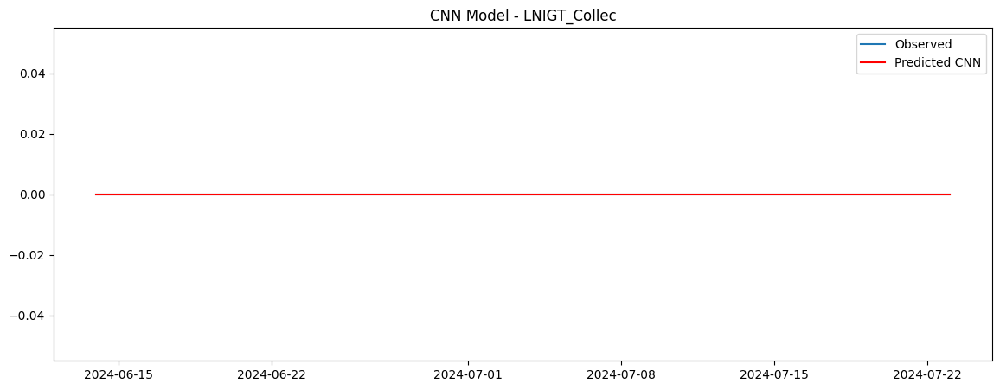

Training GRU model for LNIGT_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
RMSE for LNIGT_Collec using GRU: 0.0


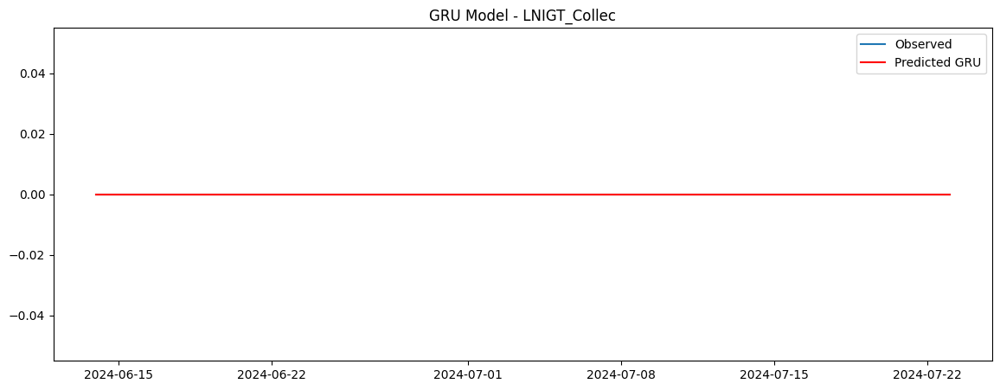

Processing series: LNHET_Collec
Training MLP model for LNHET_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
RMSE for LNHET_Collec using MLP: 62268.192751382834


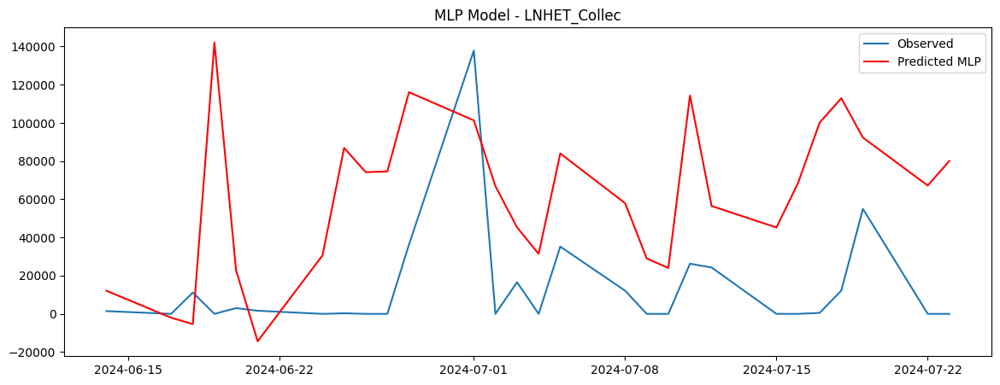

Training LSTM model for LNHET_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
RMSE for LNHET_Collec using LSTM: 18543924221.275963


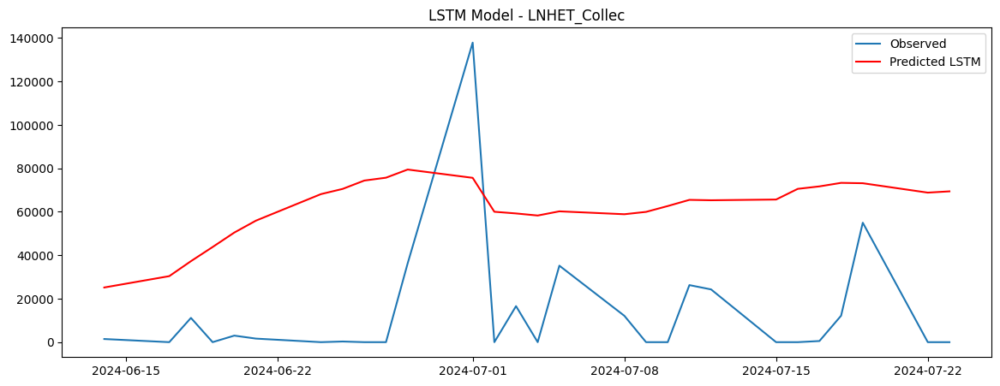

Training CNN model for LNHET_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNHET_Collec using CNN: 1.1160510070468504e+16


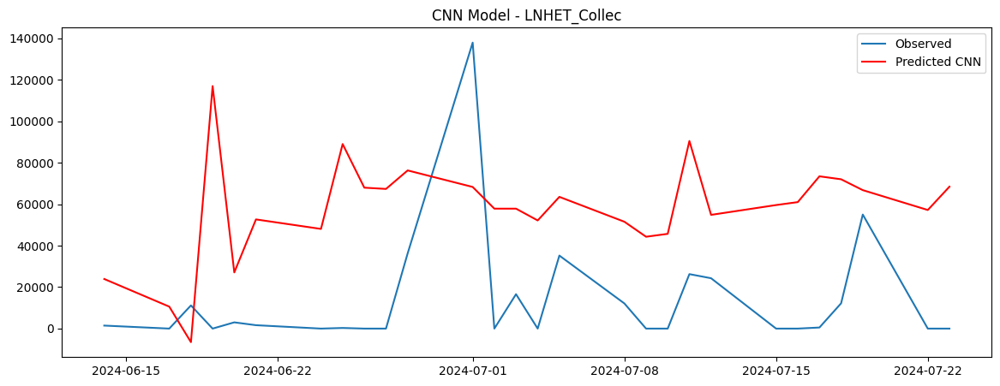

Training GRU model for LNHET_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
RMSE for LNHET_Collec using GRU: 6.716851313681785e+21


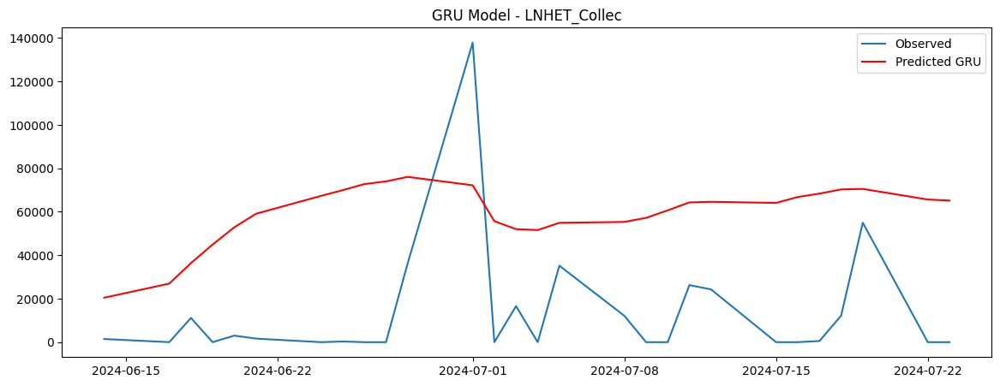

Processing series: LNHEC_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNHEC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
RMSE for LNHEC_Collec using MLP: 46903.05231021556


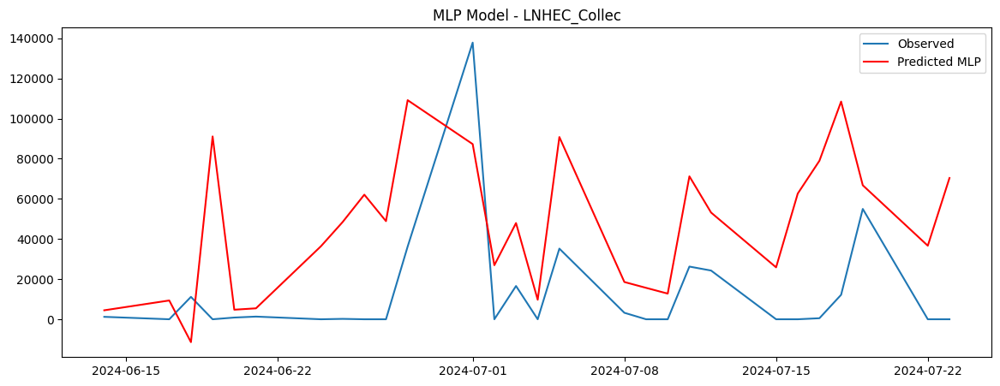

Training LSTM model for LNHEC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
RMSE for LNHEC_Collec using LSTM: 18492758283.299007


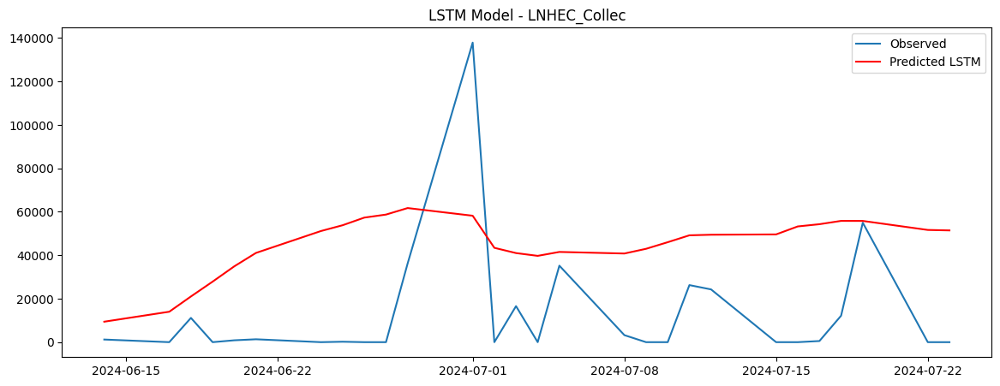

Training CNN model for LNHEC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
RMSE for LNHEC_Collec using CNN: 1.1129711500385164e+16


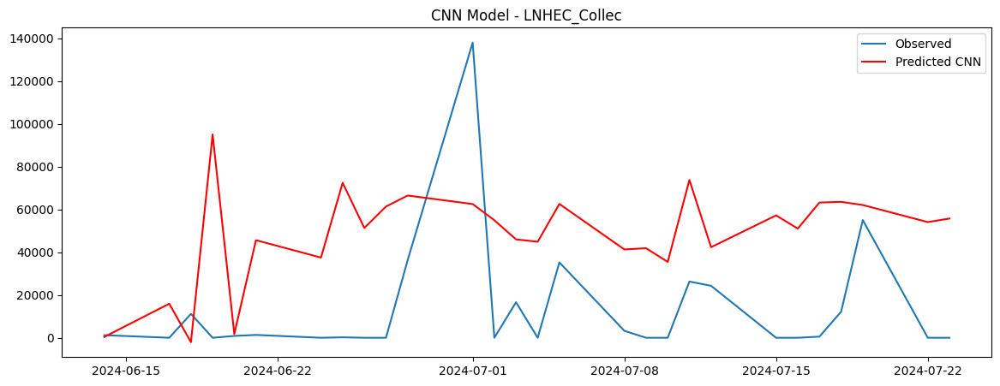

Training GRU model for LNHEC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
RMSE for LNHEC_Collec using GRU: 6.698315474849983e+21


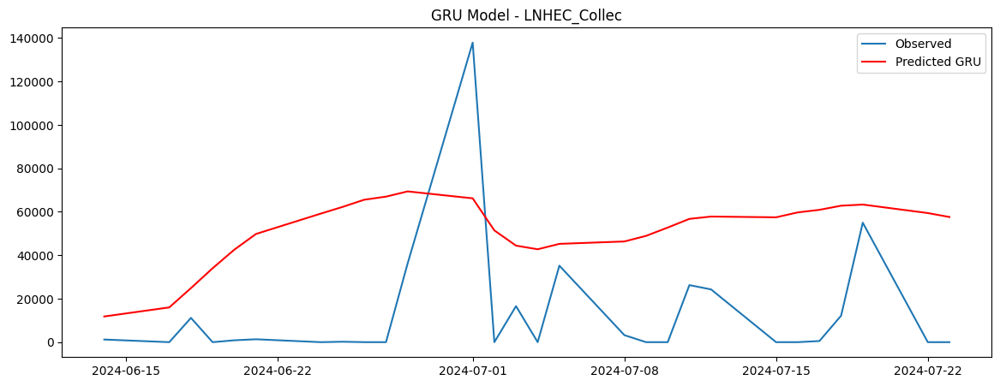

Processing series: LNHEP_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNHEP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
RMSE for LNHEP_Collec using MLP: 4148.076047554853


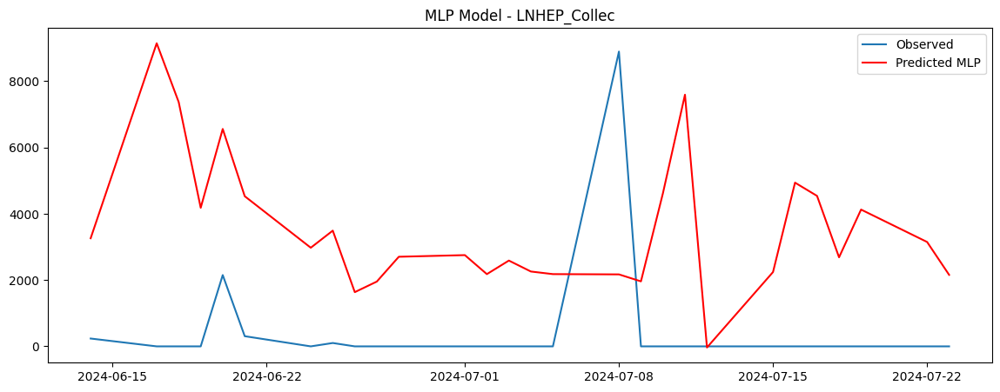

Training LSTM model for LNHEP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
RMSE for LNHEP_Collec using LSTM: 206622335.30878887


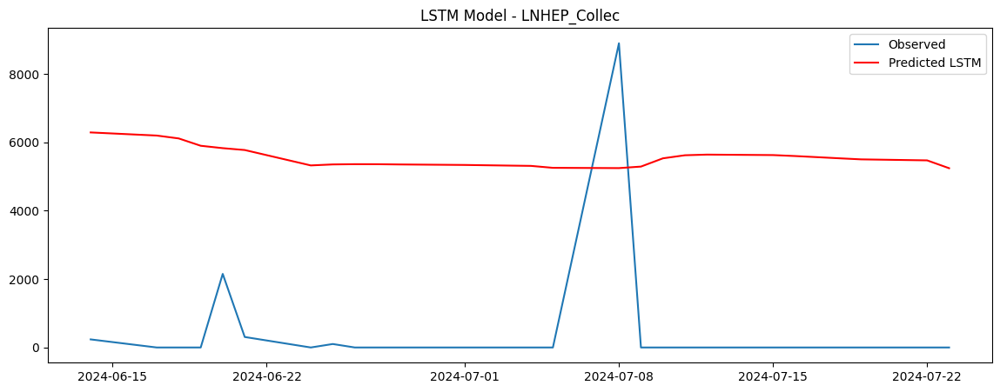

Training CNN model for LNHEP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
RMSE for LNHEP_Collec using CNN: 24665074453256.082


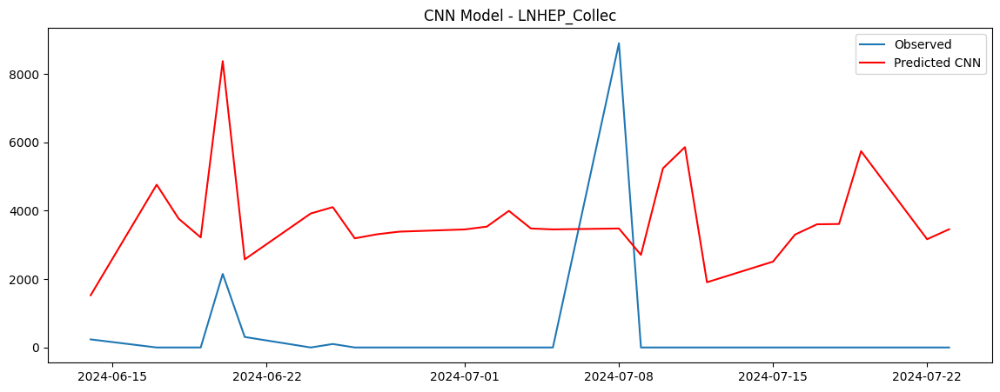

Training GRU model for LNHEP_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
RMSE for LNHEP_Collec using GRU: 2.944319021107777e+18


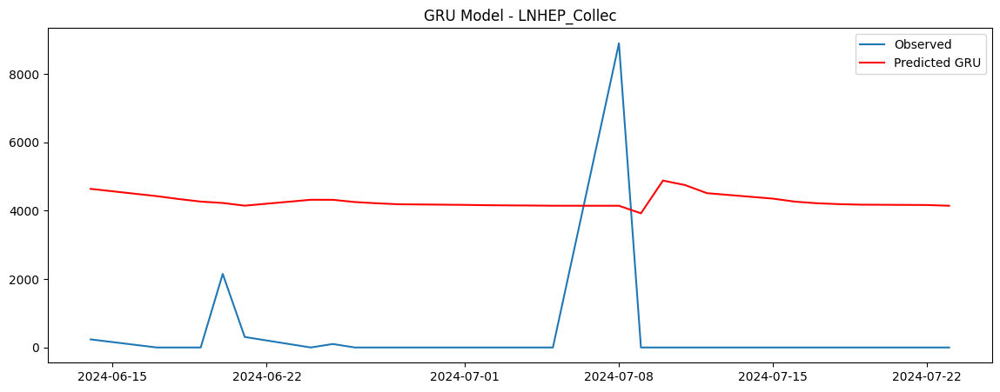

Processing series: LNHER_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNHER_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
RMSE for LNHER_Collec using MLP: 3194036.897235216


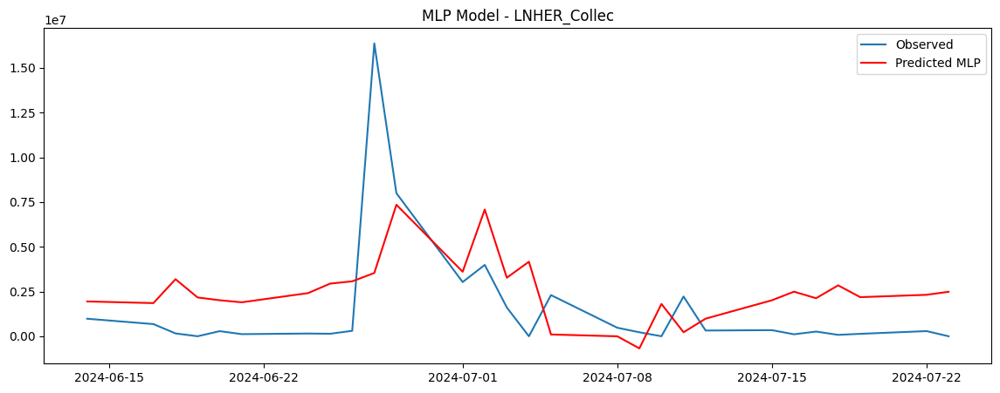

Training LSTM model for LNHER_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
RMSE for LNHER_Collec using LSTM: 59656717686393.96


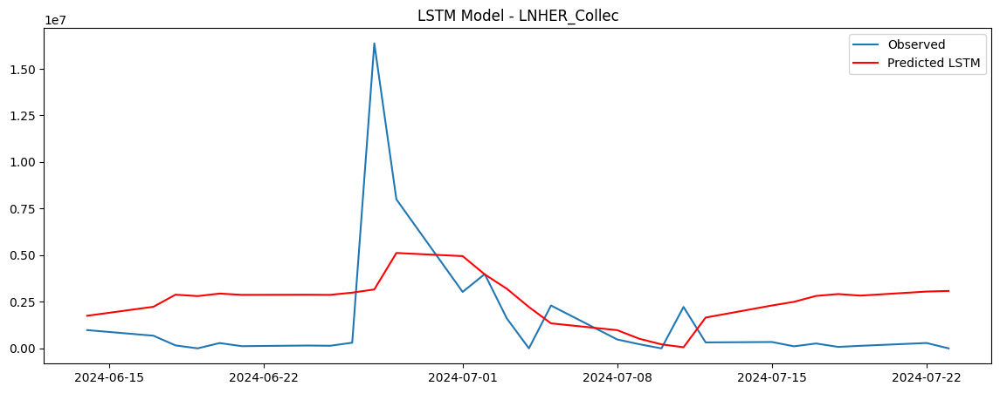

Training CNN model for LNHER_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
RMSE for LNHER_Collec using CNN: 9.763595104259366e+20


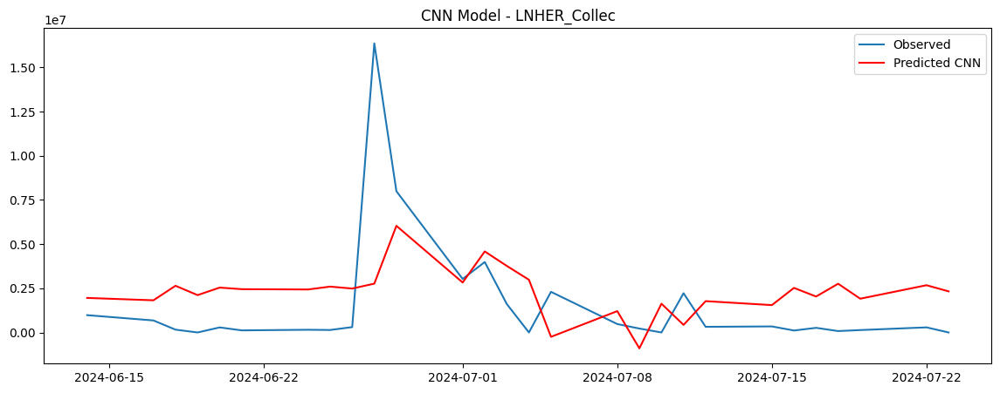

Training GRU model for LNHER_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
RMSE for LNHER_Collec using GRU: 1.5979388545010489e+28


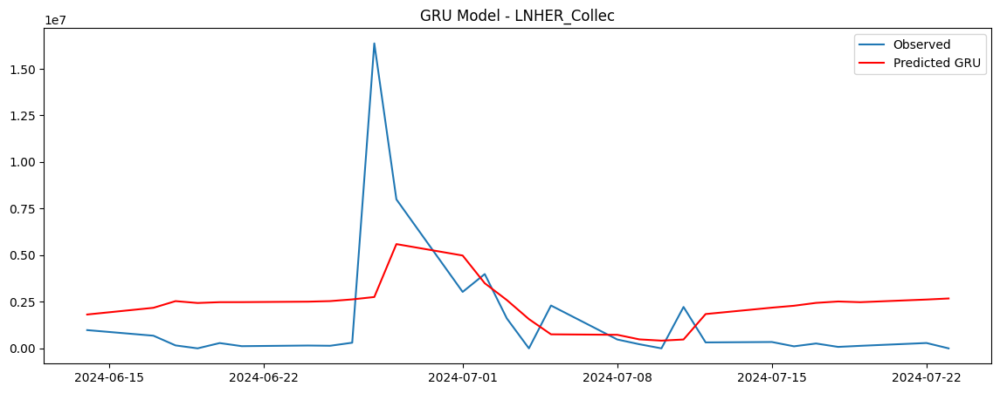

Processing series: LNLOA_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNLOA_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNLOA_Collec using MLP: 0.0


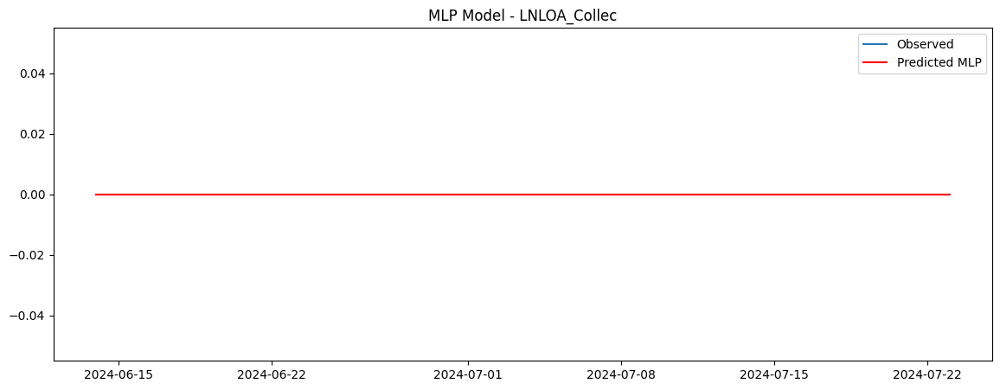

Training LSTM model for LNLOA_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
RMSE for LNLOA_Collec using LSTM: 0.0


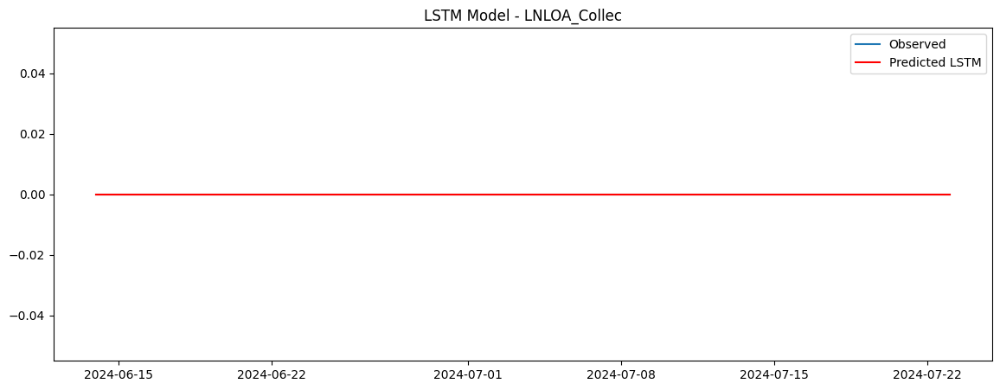

Training CNN model for LNLOA_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNLOA_Collec using CNN: 0.0


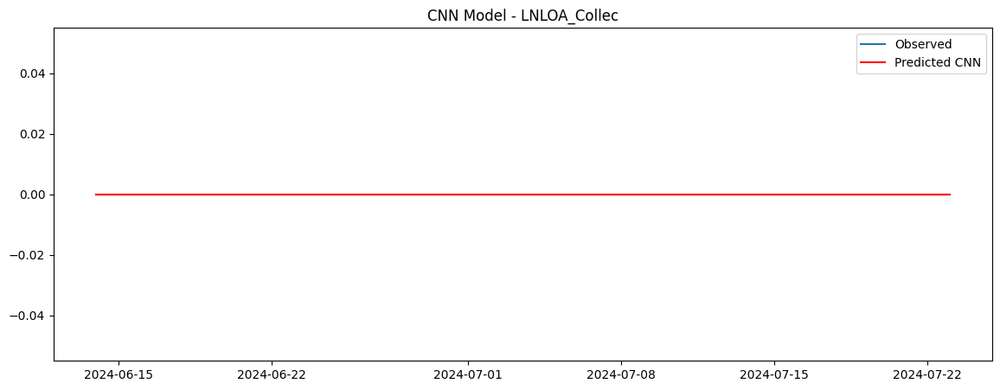

Training GRU model for LNLOA_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
RMSE for LNLOA_Collec using GRU: 0.0


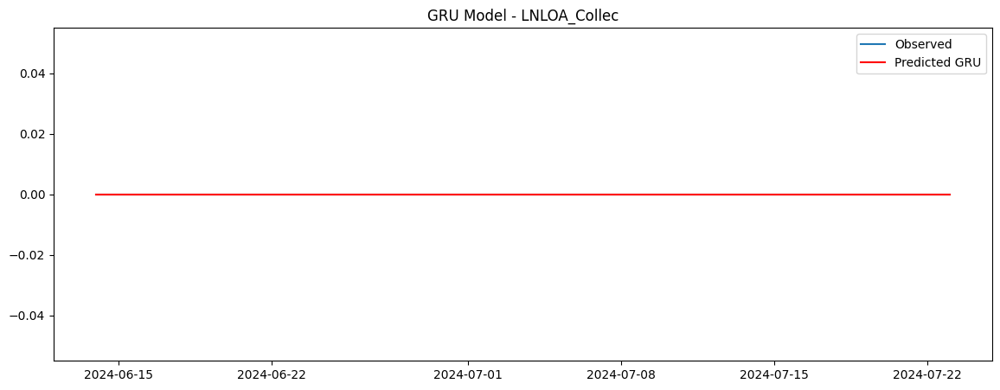

Processing series: LNTI2_Collec
Training MLP model for LNTI2_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
RMSE for LNTI2_Collec using MLP: 0.0


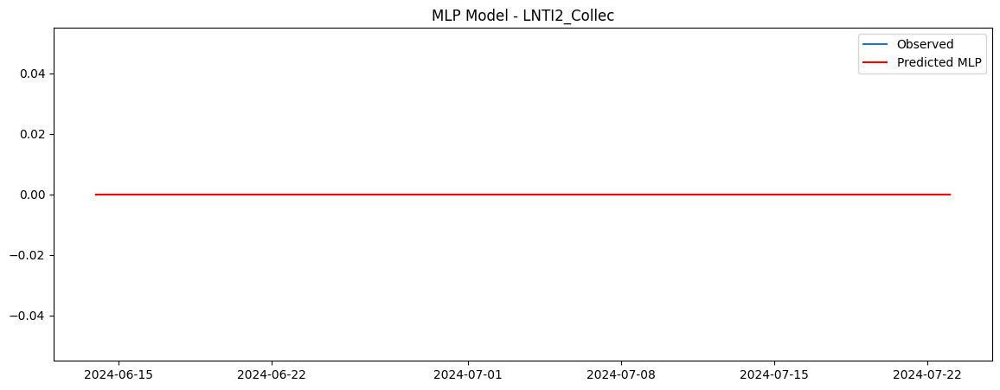

Training LSTM model for LNTI2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
RMSE for LNTI2_Collec using LSTM: 0.0


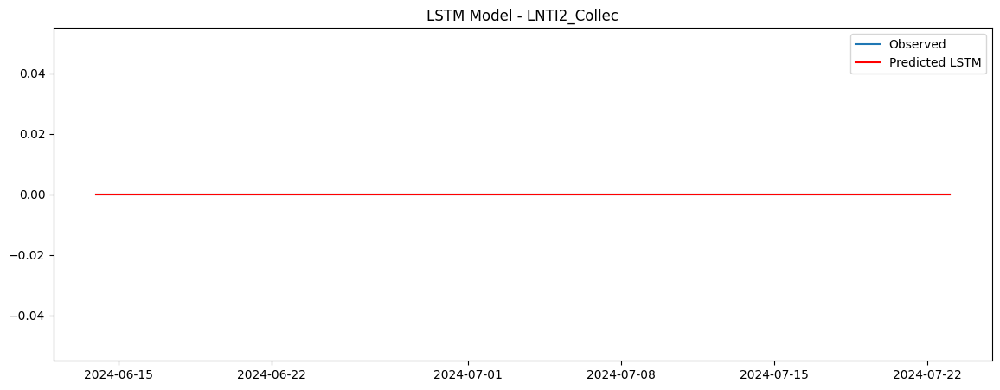

Training CNN model for LNTI2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
RMSE for LNTI2_Collec using CNN: 0.0


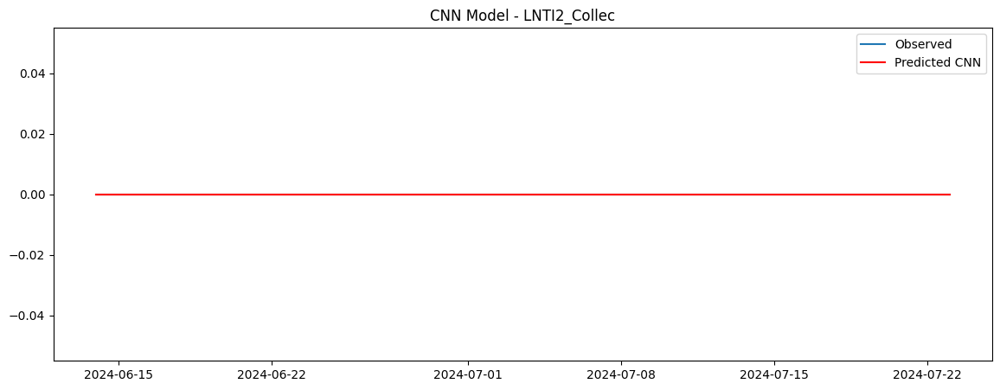

Training GRU model for LNTI2_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
RMSE for LNTI2_Collec using GRU: 0.0


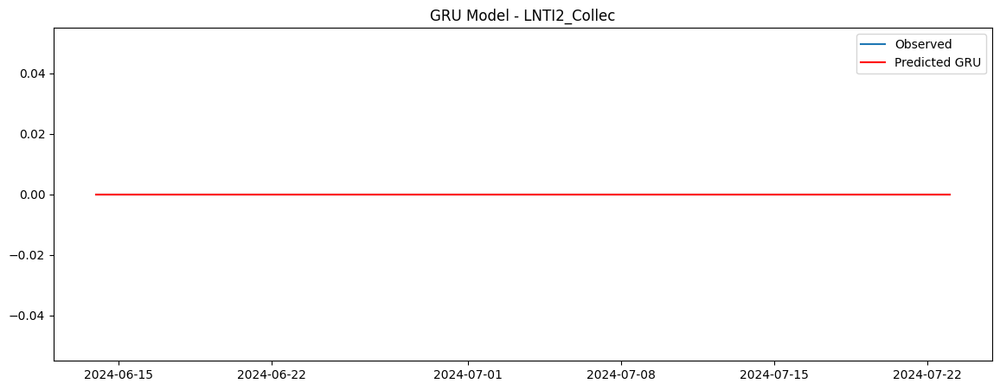

Processing series: LNT2N_Collec
Training MLP model for LNT2N_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
RMSE for LNT2N_Collec using MLP: 49402299.61354238


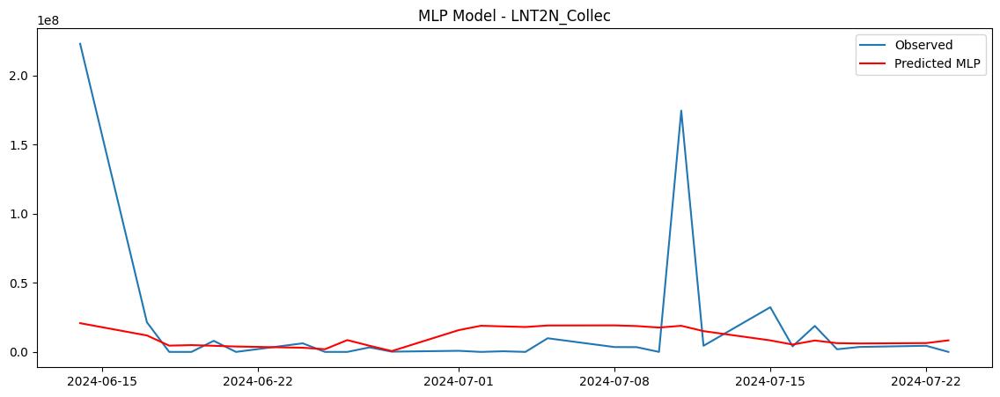

Training LSTM model for LNT2N_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
RMSE for LNT2N_Collec using LSTM: 1.388216925619741e+16


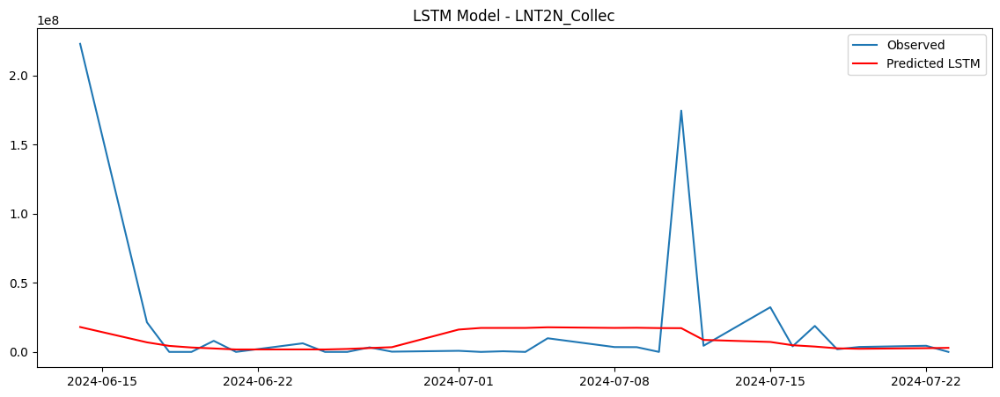

Training CNN model for LNT2N_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNT2N_Collec using CNN: 3.554221634208649e+24


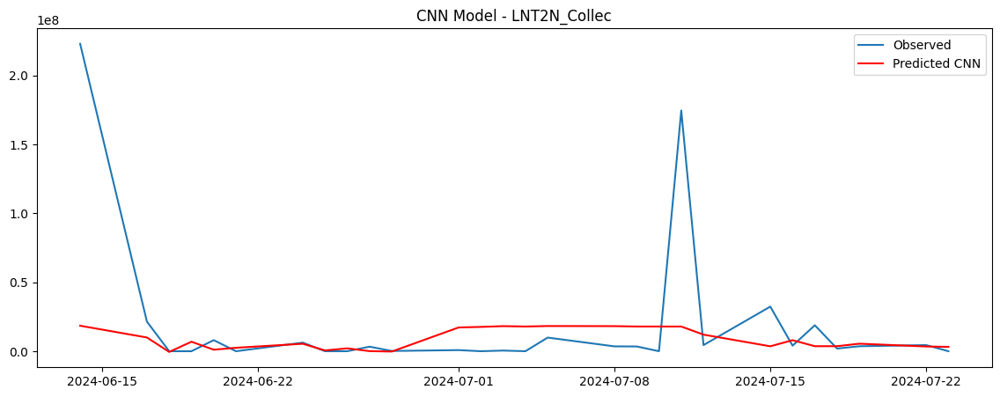

Training GRU model for LNT2N_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
RMSE for LNT2N_Collec using GRU: 9.09979642749096e+32


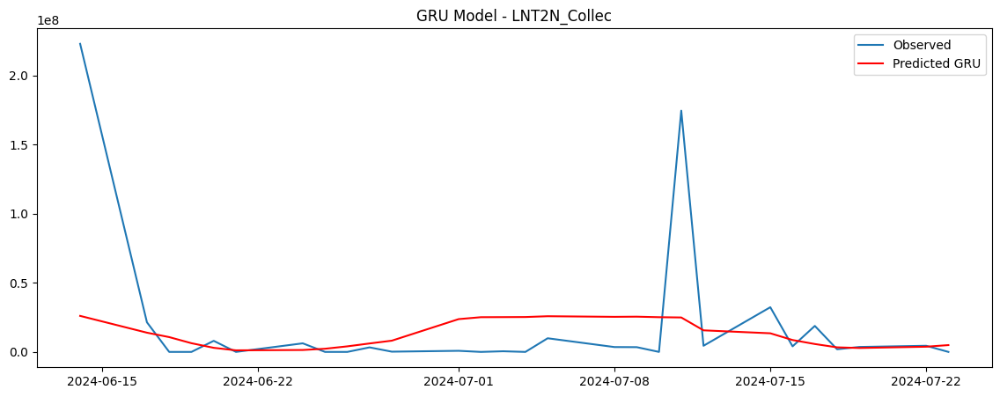

Processing series: LNT2E_Collec
Training MLP model for LNT2E_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
RMSE for LNT2E_Collec using MLP: 0.0


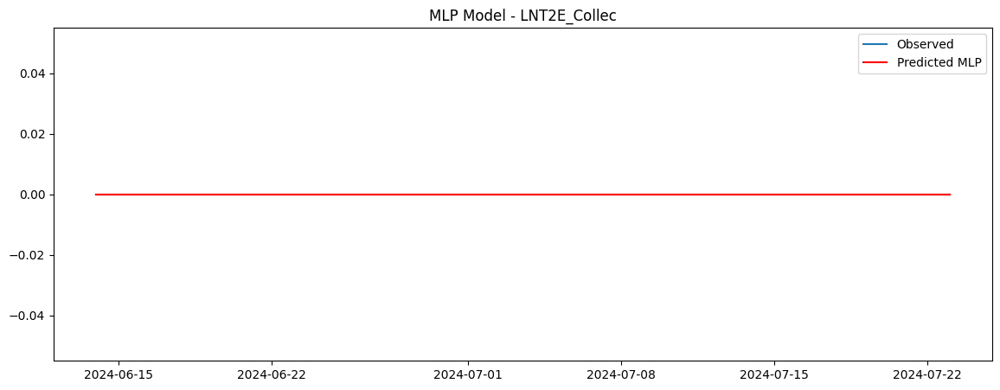

Training LSTM model for LNT2E_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
RMSE for LNT2E_Collec using LSTM: 0.0


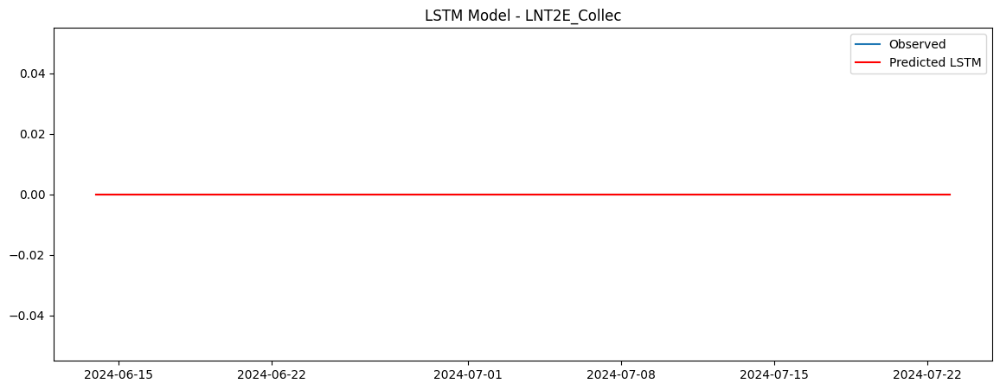

Training CNN model for LNT2E_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
RMSE for LNT2E_Collec using CNN: 0.0


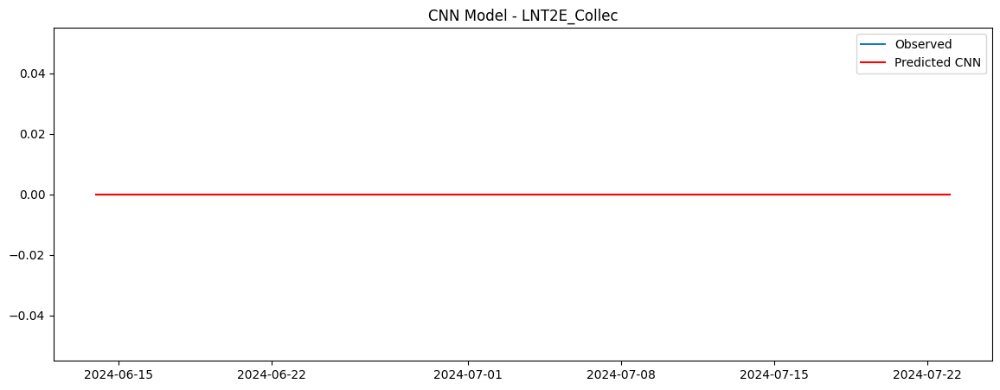

Training GRU model for LNT2E_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
RMSE for LNT2E_Collec using GRU: 0.0


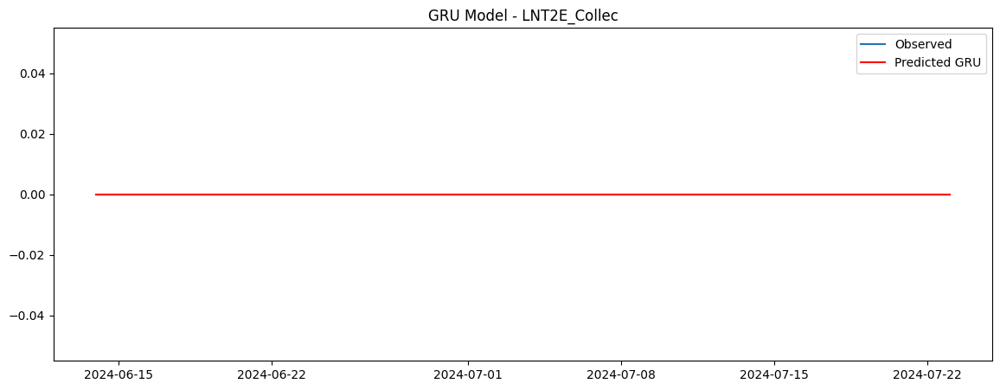

Processing series: LNTI3_Collec
Training MLP model for LNTI3_Collec...


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
RMSE for LNTI3_Collec using MLP: 10924558.7501495


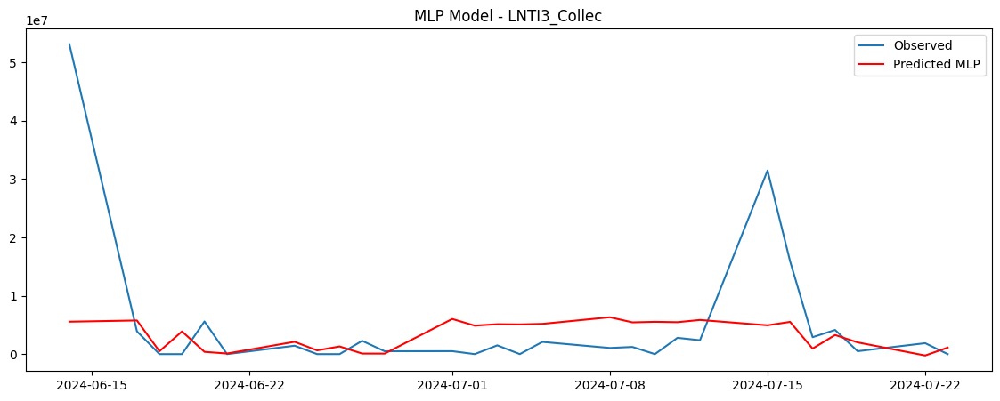

Training LSTM model for LNTI3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
RMSE for LNTI3_Collec using LSTM: 749282156434246.6


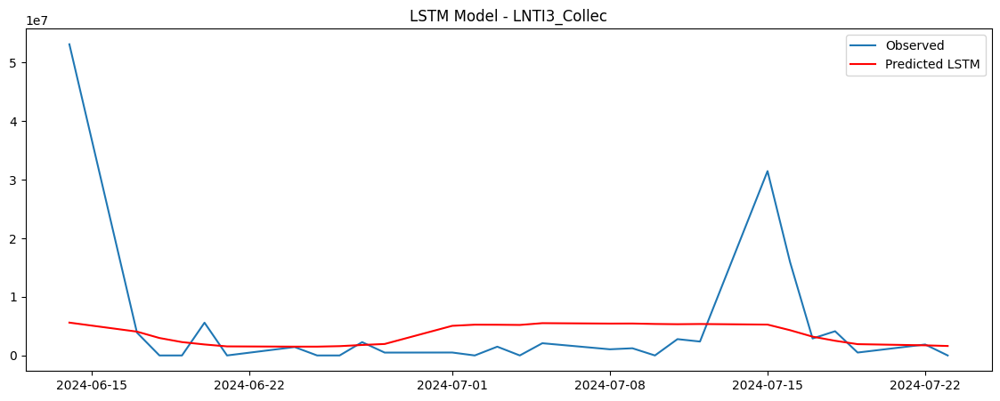

Training CNN model for LNTI3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
RMSE for LNTI3_Collec using CNN: 4.597744208196681e+22


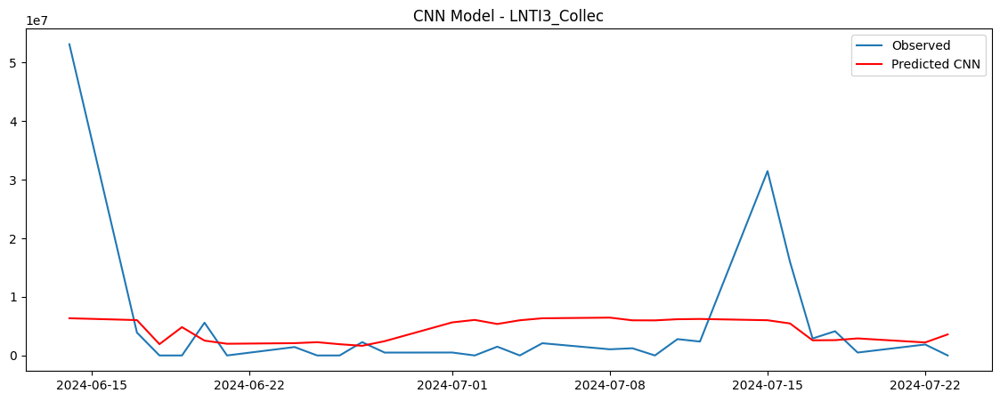

Training GRU model for LNTI3_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
RMSE for LNTI3_Collec using GRU: 2.821267204706223e+30


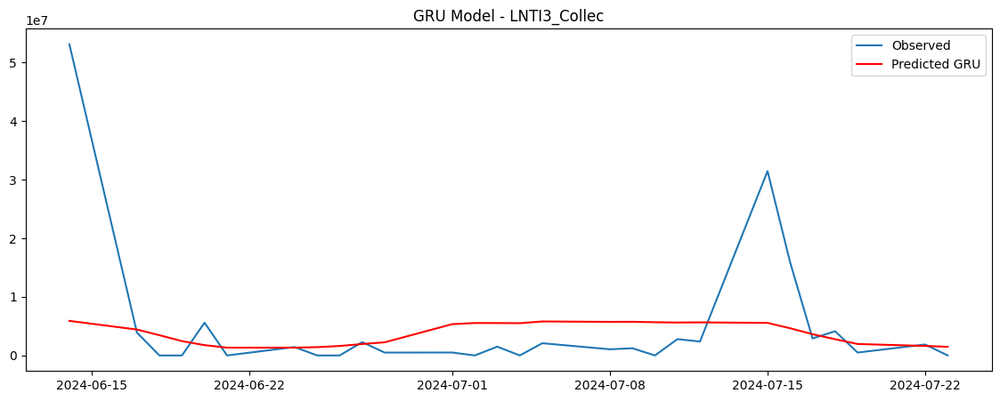

Processing series: LNTIC_Collec


c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\UT3NDP\My_IT_Applications\test_gitlab\venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(a

Training MLP model for LNTIC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
RMSE for LNTIC_Collec using MLP: 2351548.922292405


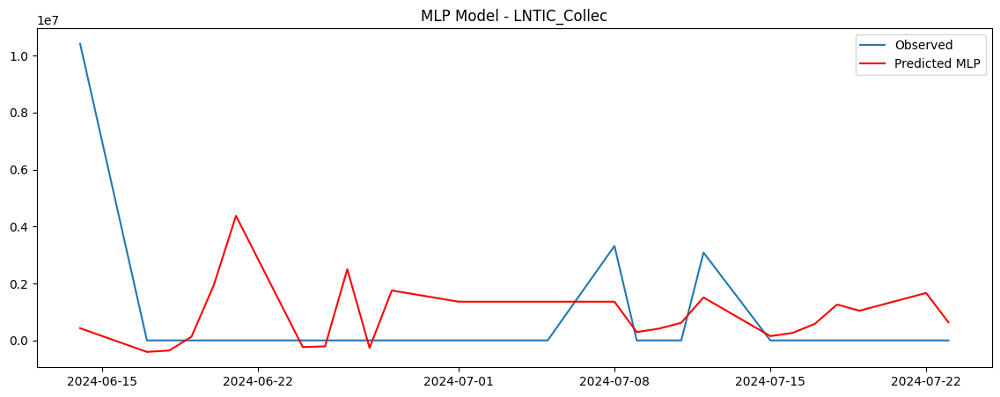

Training LSTM model for LNTIC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
RMSE for LNTIC_Collec using LSTM: 26762210135537.125


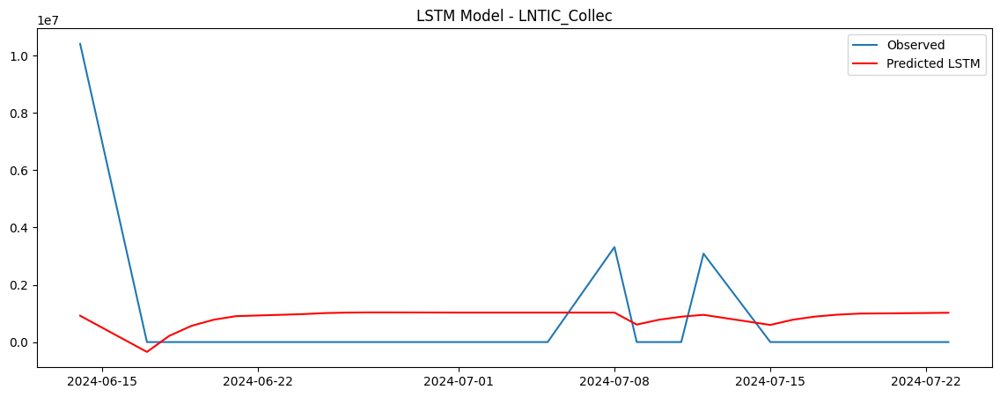

Training CNN model for LNTIC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
RMSE for LNTIC_Collec using CNN: 3.337757213503835e+20


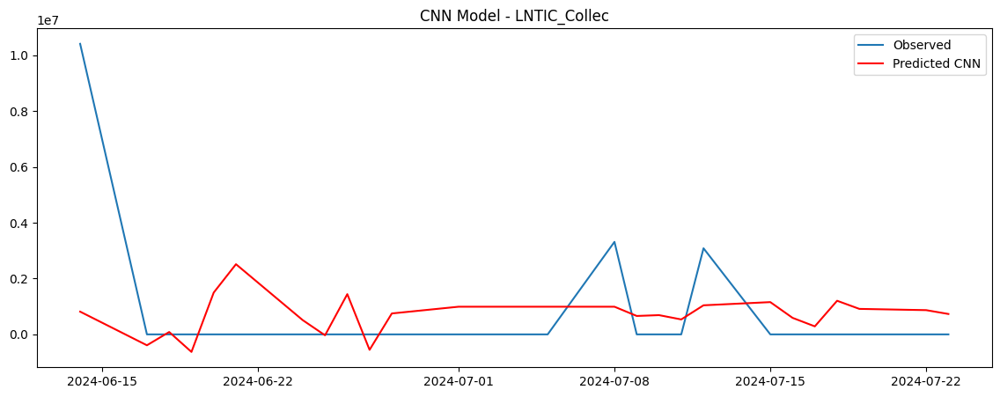

Training GRU model for LNTIC_Collec...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
RMSE for LNTIC_Collec using GRU: 4.162818784252551e+27


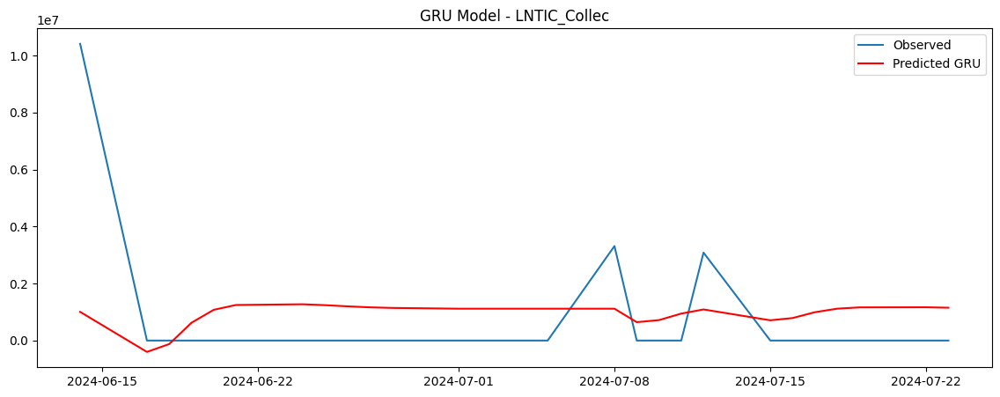


Comparison of RMSE across different models and series:

                           RMSE
LNACT_Collec MLP   3.951262e+06
             LSTM  9.357517e+13
             CNN   2.035369e+21
             GRU   4.427164e+28
LNAAE_Collec MLP   9.103555e+05
...                         ...
LNTI3_Collec GRU   2.821267e+30
LNTIC_Collec MLP   2.351549e+06
             LSTM  2.676221e+13
             CNN   3.337757e+20
             GRU   4.162819e+27

[140 rows x 1 columns]


In [61]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Conv1D, Flatten, GRU, SimpleRNN, Input, Reshape
from tensorflow.keras.layers import Conv1D, BatchNormalization, Activation, Add
from tensorflow.keras import Model

# Define the look-back period
look_back = 10

# Function to create the dataset with look-back
def create_dataset(series, look_back=1):
    X, Y = [], []
    for i in range(len(series) - look_back):
        X.append(series[i:(i + look_back)])
        Y.append(series[i + look_back])
    return np.array(X), np.array(Y)

# Initialize MinMaxScaler to normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))

# Store RMSE results
rmse_results = {}

# Iterate over each series in the data_series_it DataFrame
for series_name in data_series_it.columns:
    print(f"Processing series: {series_name}")

    # Define the series to be processed
    series = data_series_it[series_name].dropna()

    # Normalize the series
    series_scaled = scaler.fit_transform(series.values.reshape(-1, 1))

    # Create the dataset
    X, y = create_dataset(series_scaled, look_back)

    # Reshape input for LSTM, CNN, GRU, TCN, etc.
    X_reshaped = X.reshape(X.shape[0], X.shape[1], 1)

    # Split into train and test sets (70% train, 30% test)
    train_size = int(len(X) * 0.7)
    X_train, X_test = X[:train_size], X[train_size:]
    X_train_reshaped, X_test_reshaped = X_reshaped[:train_size], X_reshaped[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Models Dictionary
    models = {}

    # MLP (Multi-Layer Perceptron)
    model_mlp = Sequential([
        Dense(100, activation='relu', input_shape=(look_back,)),
        Dropout(0.2),
        Dense(50, activation='relu'),
        Dense(1)
    ])
    models['MLP'] = model_mlp

    # LSTM Model
    model_lstm = Sequential([
        LSTM(100, input_shape=(look_back, 1)),
        Dropout(0.2),
        Dense(1)
    ])
    models['LSTM'] = model_lstm

    # CNN Model
    model_cnn = Sequential([
        Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(look_back, 1)),
        Dropout(0.2),
        Flatten(),
        Dense(1)
    ])
    models['CNN'] = model_cnn

    # GRU Model
    model_gru = Sequential([
        GRU(100, input_shape=(look_back, 1)),
        Dropout(0.2),
        Dense(1)
    ])
    models['GRU'] = model_gru

    # RNN Model
    model_rnn = Sequential([
        SimpleRNN(100, input_shape=(look_back, 1)),
        Dropout(0.2),
        Dense(1)
    ])
    models['RNN'] = model_rnn

    # TCN Model
    def build_tcn_model(input_shape):
        input_layer = Input(shape=input_shape)
        x = Conv1D(64, kernel_size=2, padding='causal')(input_layer)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        x = Conv1D(64, kernel_size=2, padding='causal')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        x = Flatten()(x)
        output_layer = Dense(1)(x)
        return Model(input_layer, output_layer)

    model_tcn = build_tcn_model((look_back, 1))
    models['TCN'] = model_tcn

    # Compile, train, and evaluate each model
    for model_name, model in models.items():
        print(f"Training {model_name} model for {series_name}...")
        model.compile(optimizer='adam', loss='mean_squared_error')

        if model_name == 'MLP':
            model.fit(X_train, y_train, epochs=20, batch_size=10, verbose=0)
            predictions = model.predict(X_test)
        else:
            model.fit(X_train_reshaped, y_train, epochs=20, batch_size=10, verbose=0)
            predictions = model.predict(X_test_reshaped)

        # Inverse transform predictions and y_test
        predictions = scaler.inverse_transform(predictions)
        y_test = scaler.inverse_transform(y_test.reshape(-1, 1))

        # Calculate RMSE
        rmse = np.sqrt(mean_squared_error(y_test, predictions))
        print(f'RMSE for {series_name} using {model_name}: {rmse}')
        rmse_results[(series_name, model_name)] = rmse

        # Plot results
        plt.figure(figsize=(14, 5))
        plt.plot(series.iloc[train_size + look_back:], label='Observed')
        plt.plot(series.index[train_size + look_back:], predictions, color='red', label=f'Predicted {model_name}')
        plt.title(f'{model_name} Model - {series_name}')
        plt.legend()
        plt.show()

# Compare RMSE results across models and series
rmse_df = pd.DataFrame(rmse_results, index=['RMSE']).T
print("\nComparison of RMSE across different models and series:\n")
print(rmse_df)


# FAIRE UN TABLEAU QUI COMPARE

# CORRELATION MATRIX

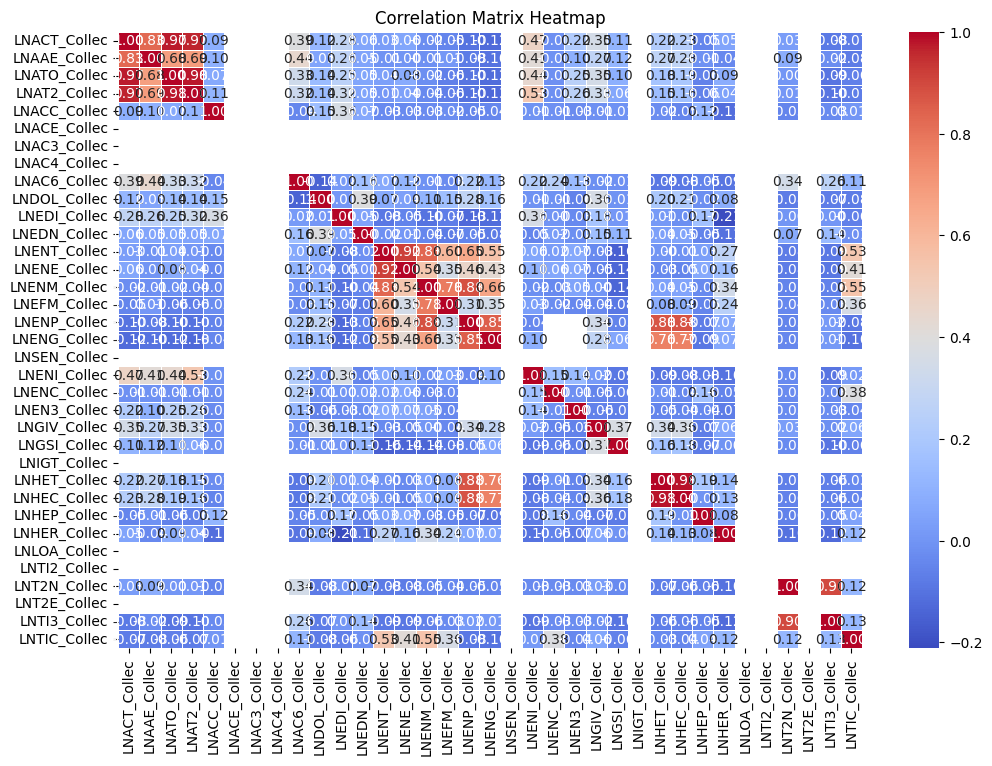

Correlation Matrix:
              LNACT_Collec  LNAAE_Collec  LNATO_Collec  LNAT2_Collec  \
LNACT_Collec      1.000000      0.827108      0.974187      0.965403   
LNAAE_Collec      0.827108      1.000000      0.679209      0.691867   
LNATO_Collec      0.974187      0.679209      1.000000      0.980294   
LNAT2_Collec      0.965403      0.691867      0.980294      1.000000   
LNACC_Collec      0.087528      0.099072      0.071315      0.111502   
LNACE_Collec           NaN           NaN           NaN           NaN   
LNAC3_Collec           NaN           NaN           NaN           NaN   
LNAC4_Collec           NaN           NaN           NaN           NaN   
LNAC6_Collec      0.386889      0.444028      0.328427      0.318273   
LNDOL_Collec      0.124501      0.051164      0.139850      0.138819   
LNEDI_Collec      0.279804      0.262896      0.254391      0.321056   
LNEDN_Collec      0.057213      0.050215      0.054658      0.053367   
LNENT_Collec      0.026410     -0.006455    

In [68]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `data_series_it` contains the time series data as a DataFrame where each column represents a different series.

# Step 1: Calculate the correlation matrix
correlation_matrix = data_series_it.corr()

# Step 2: Visualize the correlation matrix with a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

# Step 3: Display the correlation matrix as a DataFrame
print("Correlation Matrix:")
print(correlation_matrix)

# Step 4: Identify pairs of series with high correlation (threshold set to 0.8)
threshold = 0.8
high_correlation_pairs = correlation_matrix.unstack().sort_values(kind="quicksort", ascending=False).drop_duplicates()
high_correlation_pairs = high_correlation_pairs[(high_correlation_pairs > threshold) & (high_correlation_pairs < 1)]

print("\nHighly Correlated Pairs (Threshold > 0.8):")
print(high_correlation_pairs)


# DEPENDENCY

Evaluating dependency between time series can be approached using several techniques, especially when you want to determine the influence of one time series on another. Below are a few commonly used methods to evaluate dependencies between time series: 

### 1. **Granger Causality Test**
   - The Granger causality test is used to determine whether one time series can predict another. If time series \(X\) Granger-causes time series \(Y\), past values of \(X\) contain information that helps predict \(Y\) beyond the information contained in past values of \(Y\) alone.

### 2. **Cross-Correlation Function (CCF)**
   - Cross-correlation measures the similarity between two time series as a function of the time-lag applied to one of them. This is useful to identify leading and lagging relationships between series.

### 3. **Vector Autoregression (VAR)**
   - VAR models capture the linear interdependencies among multiple time series. By fitting a VAR model, you can observe how each series influences the others and analyze the impulse response functions.

### 4. **Cointegration Test**
   - Cointegration is used to determine if two or more time series are linked by a common stochastic trend, meaning they move together in the long run.

### 5. **Dynamic Time Warping (DTW)**
   - DTW is a method that computes an optimal alignment between two time series, which can be used to identify similarities in shape between series that may not be synchronized in time.

Here’s how you can implement these techniques using Python:


### 1. **Granger Causality Test**

In [70]:
from statsmodels.tsa.stattools import grangercausalitytests

# Example: Testing Granger Causality between all pairs of time series
max_lag = 5  # Define the maximum number of lags to test

for col1 in data_series_it.columns:
    for col2 in data_series_it.columns:
        if col1 != col2:
            print(f'Granger Causality Test between {col1} and {col2}')
            grangercausalitytests(data_series_it[[col1, col2]], max_lag=max_lag, verbose=True)


Granger Causality Test between LNACT_Collec and LNAAE_Collec


TypeError: grangercausalitytests() got an unexpected keyword argument 'max_lag'

In [72]:
from statsmodels.tsa.api import VAR

# Fit a VAR model on the time series data
model = VAR(data_series_it)
model_fitted = model.fit(maxlags=15, ic='aic')

# Print summary
print(model_fitted.summary())

# Impulse Response Function
irf = model_fitted.irf(10)
irf.plot(orth=False)
plt.show()


ValueError: Pandas data cast to numpy dtype of object. Check input data with np.asarray(data).